#### NOVA IMS / BSc in Data Science / Text Mining 2024/2025
### <b>Group Project: "Solving the Hyderabadi Word Soup"</b>
#### Notebook `Final`

#### Group:
- `João Capitão #20221863`
- `Maria Rodrigues #20221938`
- `Vidhi Rajanikante #20221982`
- `Yehor Malakhov #20221691`

#### <font color='#BFD72'>Table of Contents </font> <a class="anchor" id='toc'></a> 
- [1. Data Understanding](#P1)
- [2. General Data Preparation](#P2) 
- [3. Multilabel Classification (Information Requirement 3311)](#P3)
    - [3.1 Specific Data Preparation](#P31)
    - [3.2 Model Implementation](#P32)
    - [3.3 Model Evaluation](#P3n)
- [4. Sentiment Analysis (Information Requirement 3312)](#P4)
    - [4.1 Specific Data Preparation](#P41)
    - [4.2 Model Implementation](#P42)
    - [4.3 Model Evaluation](#P43)
- [5. Co-occurence Analysis, Clustering (Information Requirement 3321)](#P5)
    - [5.1 Co-occurence Analysis](#51)
        - [5.1.1 Specific Data Preparation](#P511)
        - [5.1.2 Model Implementation](#P512)
        - [5.1.3 Model Evaluation](#P513)
    - [5.2 Clustering witk KMeans](#52)
        - [5.2.1 Specific Data Preparation](#P521)
        - [5.2.2 Model Implementation](#P522)
        - [5.2.3 Model Evaluation](#P523)
    - [5.3 Clustering witk HDBSCAN](#53)
- [6. Topic Modelling (Information Requirement 3322)](#P6)
    - [6.1 Topic Modelling with LSA sklearn](#P61)
        - [6.1.1 Specific Data Preparation](#P611)
        - [6.1.2 Model Implementation](#P612)
        - [6.1.3 Model Evaluation](#P613)
    - [6.2 Topic Modelling with LSA Gensim](#P62)
        - [6.2.1 Specific Data Preparation](#P621)
        - [6.2.2 Model Implementation](#P622)
        - [6.2.3 Model Evaluation](#P623)
    - [6.3 Topic Modelling with LDA sklearn](#P63)
        - [6.3.1 Specific Data Preparation](#P631)
        - [6.3.2 Model Implementation](#P632)
        - [6.3.3 Model Evaluation](#P633)
    - [6.4 Topic Modelling with LDA Gensim](#P64)
        - [6.4.1 Specific Data Preparation](#P641)
        - [6.4.2 Model Implementation](#P642)
        - [6.4.3 Model Evaluation](#P643)

In [117]:
## All imports must be concentrated on a cell that immediately follow the table of contents
from utils.preproc import *
from utils.utils import *
from utils.clustering import *
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from utils.model import sentiment
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_is_fitted, check_array
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import ClassifierChain
from sklearn.tree import DecisionTreeClassifier
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from sklearn.decomposition import TruncatedSVD
from gensim import corpora
from gensim.models import LsiModel, LdaModel
from hdbscan import HDBSCAN
from bertopic import BERTopic
from sklearn.decomposition import LatentDirichletAllocation
from wordcloud import WordCloud
from itertools import combinations
from gensim.models.coherencemodel import CoherenceModel
from sklearn.metrics import mean_absolute_error

import time
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import circlify as circ
import pycirclize

import warnings
warnings.filterwarnings("ignore")

In [118]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<font color='#BFD72F' size=5>1. Data Understanding</font> <a class="anchor" id="P1"></a>
  
[Back to TOC](#toc)

<i>As the entire process consistently revisits various stages, 
this section remains empty, 
as we have achieved a comprehensive understanding of our data through data preprocessing.</i>

<font color='#BFD72F' size=5>2. Data Preprocessing</font> <a class="anchor" id="P2"></a>
  
[Back to TOC](#toc)

<font size=5>restaurants.csv</font> <a class="anchor" id="P1"></a>

First, we will focus on the 'restaurants.csv' dataset.

In [119]:
restaurants = pd.read_csv('data_hyderabad/105_restaurants.csv')
reviews = pd.read_csv('data_hyderabad/10k_reviews.csv')

In [120]:
restaurants.head()

,Name,Links,Cost,Collections,Cuisines,Timings
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavours-gachibowli,800,"Food Hygiene Rated Restaurants in Hyderabad, Corporate Favorites, Great Buffets, Top-Rated, Gold Curated, Live Sports Screenings","Chinese, Continental, Kebab, European, South Indian, North Indian","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)"
1,Paradise,https://www.zomato.com/hyderabad/paradise-gachibowli,800,Hyderabad's Hottest,"Biryani, North Indian, Chinese",11 AM to 11 PM
2,Flechazo,https://www.zomato.com/hyderabad/flechazo-gachibowli,"1,300","Great Buffets, Hyderabad's Hottest","Asian, Mediterranean, North Indian, Desserts","11:30 AM to 4:30 PM, 6:30 PM to 11 PM"
3,Shah Ghouse Hotel & Restaurant,https://www.zomato.com/hyderabad/shah-ghouse-hotel-restaurant-gachibowli,800,Late Night Restaurants,"Biryani, North Indian, Chinese, Seafood, Beverages",12 Noon to 2 AM
4,Over The Moon Brew Company,https://www.zomato.com/hyderabad/over-the-moon-brew-company-gachibowli,"1,200","Best Bars & Pubs, Food Hygiene Rated Restaurants in Hyderabad, Top-Rated, Gold Curated, Hyderabad's Hottest","Asian, Continental, North Indian, Chinese, Mediterranean","12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12noon to 12midnight (Fri-Sat)"


In [121]:
# Check if there are any duplicated names
duplicates = restaurants[restaurants['Name'].duplicated()]
print(duplicates)

Empty DataFrame
Columns: [Name, Links, Cost, Collections, Cuisines, Timings]
Index: []


In [122]:
# drop 'Links' and 'Timings' column
restaurants.drop(['Links','Timings'], axis=1, inplace=True)

# make 'Cost' as integer, and remove the ','
restaurants['Cost'] = restaurants['Cost'].apply(lambda content: int(re.sub(',','',content)))

### Exploration of the Restaurants dataset

In [123]:
restaurants.describe()

,Cost
count,105.000000
mean,861.428571
std,510.149730
min,150.000000
25%,500.000000
50%,700.000000
75%,1200.000000
max,2800.000000


In [124]:
restaurants.describe(include='O')

,Name,Collections,Cuisines
count,105,51,105
unique,105,42,92
top,Beyond Flavours,Food Hygiene Rated Restaurants in Hyderabad,"North Indian, Chinese"
freq,1,4,4


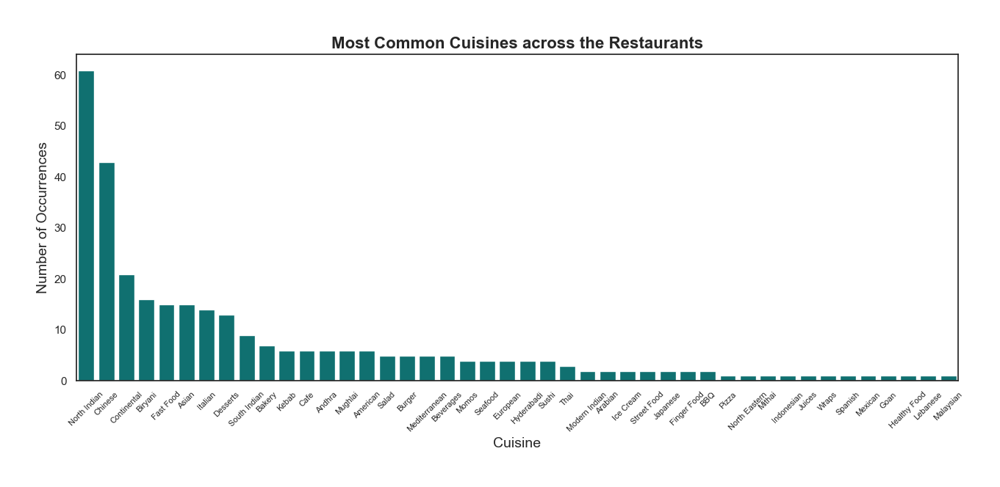

In [125]:
cuisine_counts = (
    restaurants['Cuisines']
    .str.split(', ')
    .explode()
    .value_counts()
)

plt.figure(figsize=(13, 6))
sns.barplot(y=cuisine_counts.values, x=cuisine_counts.index, color="#008080") 

plt.title('Most Common Cuisines across the Restaurants', fontsize=16, fontweight='bold')
plt.ylabel('Number of Occurrences', fontsize=14)
plt.xlabel('Cuisine', fontsize=14)

plt.xticks(rotation=45)
plt.tick_params(axis='x', labelsize=8)

plt.tight_layout()
plt.show()

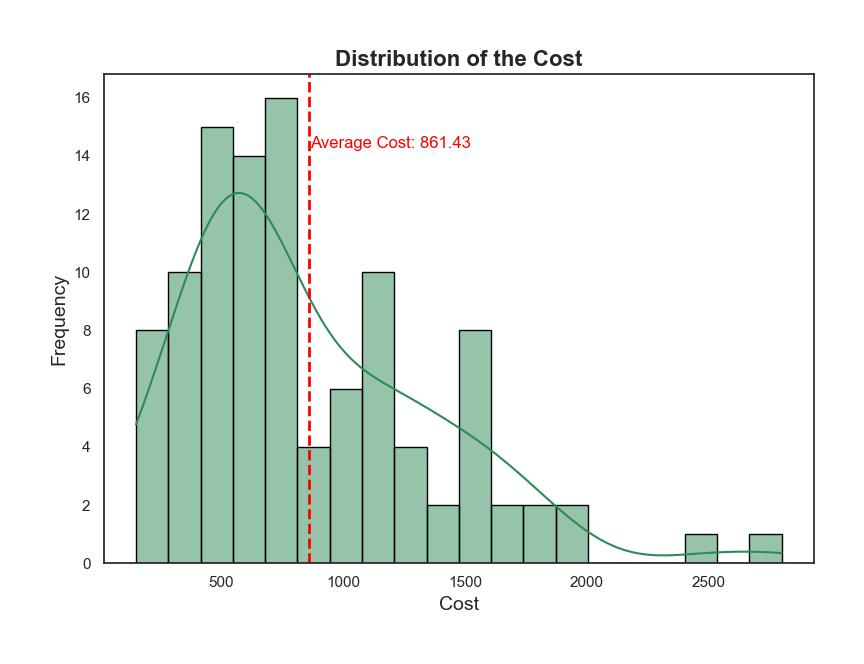

In [126]:
avg_cost = restaurants['Cost'].mean()

plt.figure(figsize=(8, 6))
sns.histplot(data=restaurants, x='Cost', kde=True, color='seagreen', bins=20, edgecolor='black')

plt.axvline(avg_cost, color='red', linestyle='--', linewidth=2)

plt.title('Distribution of the Cost', fontsize=16, fontweight='bold')
plt.xlabel('Cost', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.text(avg_cost + 3, plt.gca().get_ylim()[1] * 0.85, f'Average Cost: {avg_cost:.2f}', color='red', fontsize=12)

plt.tight_layout()
plt.show()


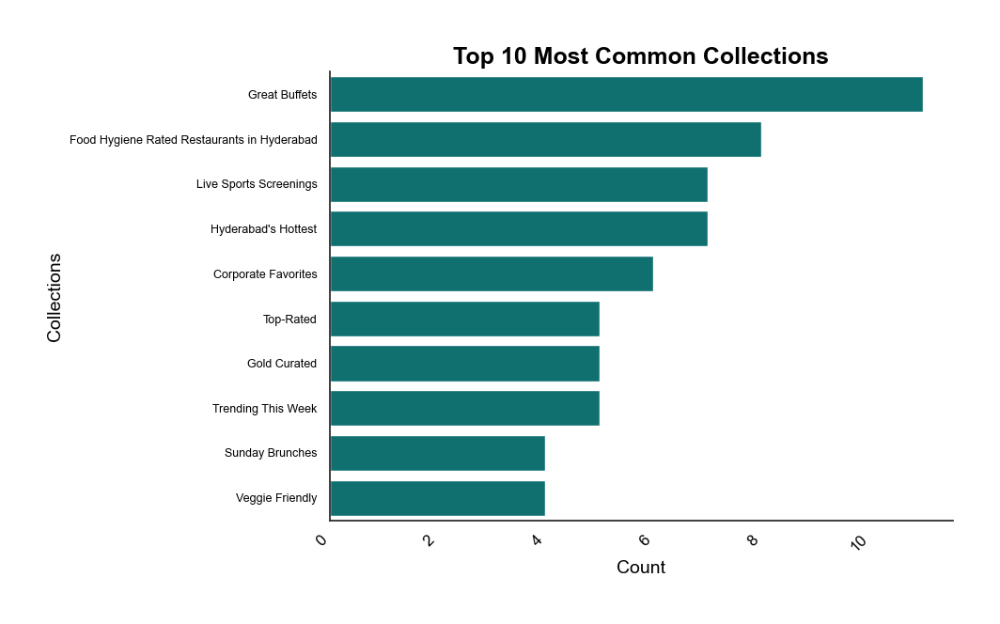

In [127]:
collections_counts = (
    restaurants['Collections']
    .str.split(', ')
    .explode()
    .value_counts()
    .head(10)  # Only top 10 collections
)

plt.figure(figsize=(10, 6))
sns.barplot(x=collections_counts.values, y=collections_counts.index, color="#008080")  

plt.title('Top 10 Most Common Collections', fontsize=18, fontweight='bold', color='black')
plt.xlabel('Count', fontsize=14, color='black')
plt.ylabel('Collections', fontsize=14, color='black')

plt.xticks(rotation=45, ha='right', fontsize=12, color='black')
plt.yticks(fontsize=9, color='black')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


### Preprocessing: restaurants dataset

In [128]:
restaurants_copy= restaurants.copy()

In [129]:
# implement OHE (sort of) to 'Cuisines'
restaurants['Cuisines'] = restaurants['Cuisines'].apply(lambda content: re.split(', ',content))

label_lt = label_into_lt(restaurants, 'Cuisines')
#len(label_lt) = 44

# final encoded 'Cuisines' # TODO HERE
restaurants['labels'] = restaurants['Cuisines'].apply(lambda x: label_encoder_column(x, label_lt))

In [130]:
restaurants['labels']

0      [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
1      [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
2      [0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
3      [1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
4      [1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
                                                                       ...                                                                 
100    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
101    [0, 0, 0, 0, 

In [131]:
# implement OHE (sort of) to 'Collections'
# temporarily remove Nan columns
rows_remove = restaurants[restaurants.isna().any(axis=1)]
rest_no_nan = restaurants.dropna().copy()

rest_no_nan['Collections'] = rest_no_nan['Collections'].apply(lambda content: re.split(', ',content))

label_lt = label_into_lt(rest_no_nan, 'Collections')
#len(label_lt) = 37

# encoded 'Collections'
rest_no_nan['Collections'] = rest_no_nan['Collections'].apply(lambda x: label_encoder_column(x, label_lt))

# set the nan/removed rows with encoded list with only 0.0
rows_remove['Collections'] = [[0.0] * len(label_lt)] * len(rows_remove)

restaurants = pd.concat([rest_no_nan, rows_remove])

In [132]:
restaurants.head(20)

,Name,Cost,Collections,Cuisines,labels
0,Beyond Flavours,800,"[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Chinese, Continental, Kebab, European, South Indian, North Indian]","[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
1,Paradise,800,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Biryani, North Indian, Chinese]","[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
2,Flechazo,1300,"[0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Asian, Mediterranean, North Indian, Desserts]","[0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
3,Shah Ghouse Hotel & Restaurant,800,"[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Biryani, North Indian, Chinese, Seafood, Beverages]","[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
4,Over The Moon Brew Company,1200,"[1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Asian, Continental, North Indian, Chinese, Mediterranean]","[1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
5,The Fisherman's Wharf,1500,"[1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Seafood, Goan, North Indian, Continental, Asian]","[0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
6,eat.fit,500,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Healthy Food, North Indian, Continental, South Indian]","[0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
8,Hyper Local,1000,"[0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[American, Chinese, North Indian, Kebab, South Indian]","[1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
9,Cream Stone,350,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Ice Cream, Desserts]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
10,Sardarji's Chaats & More,400,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Street Food, North Indian, Fast Food]","[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"


In [133]:
restaurants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105 entries, 0 to 103
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Cost         105 non-null    int64 
 2   Collections  105 non-null    object
 3   Cuisines     105 non-null    object
 4   labels       105 non-null    object
dtypes: int64(1), object(4)
memory usage: 4.9+ KB


### Preprocessing: reviews dataset

In [134]:
reviews.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . had Saturday lunch , which was cost effective .\nGood place for a sate brunch. One can also chill with friends and or parents.\nWaiter Soumen Das was really courteous and helpful.",5,"1 Review , 2 Followers",5/25/2019 15:54,0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. Service is very prompt. Food is good. Over all a good experience. Soumen Das - kudos to the service,5,"3 Reviews , 2 Followers",5/25/2019 14:20,0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx for the service by Pradeep and Subroto. My personal recommendation is Penne Alfredo Pasta:) ....... Also the music in the background is amazing.,5,"2 Reviews , 3 Followers",5/24/2019 22:54,0
3,Beyond Flavours,Swapnil Sarkar,"Soumen das and Arun was a great guy. Only because of their behavior and sincerety, And good food off course, I would like to visit this place again.",5,"1 Review , 1 Follower",5/24/2019 22:11,0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are good. Thanks to Pradeep. He served well. We enjoyed here. Ambience is also very good.,5,"3 Reviews , 2 Followers",5/24/2019 21:37,0


In [135]:
reviews.dropna(subset=['Review'], inplace=True)

In [136]:
reviews[['Nr_Reviews', 'Nr_Followers']] = reviews['Metadata'].str.split(' , ', expand=True)
reviews = reviews.drop('Metadata', axis=1)

# Removing any words using Regex
reviews['Nr_Reviews'] = reviews['Nr_Reviews'].apply(lambda x: re.sub(r'\D', '', str(x)))
reviews['Nr_Followers'] = reviews['Nr_Followers'].apply(lambda x: re.sub(r'\D', '', str(x)))
reviews['Nr_Followers'] = reviews['Nr_Followers'].replace('', 0)

In [137]:
reviews.drop(reviews[reviews['Rating']  == 'Like'].index, axis=0, inplace=True)

In [138]:
rev_dict = {'Nr_Reviews': 'int16', 
           'Nr_Followers': 'int16',
           'Rating': 'float32'} 

reviews = reviews.astype(rev_dict)

In [139]:
reviews['Time'] = pd.to_datetime(reviews['Time'], format='%m/%d/%Y %H:%M')

# Extract date and time into separate columns
reviews['Date'] = reviews['Time'].dt.date
reviews['Time_of_the_day'] = reviews['Time'].dt.strftime('%H:%M')

# Drop the original 'time' column
reviews = reviews.drop(columns=['Time'])
reviews.head()

,Restaurant,Reviewer,Review,Rating,Pictures,Nr_Reviews,Nr_Followers,Date,Time_of_the_day
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . had Saturday lunch , which was cost effective .\nGood place for a sate brunch. One can also chill with friends and or parents.\nWaiter Soumen Das was really courteous and helpful.",5.0,0,1,2,2019-05-25,15:54
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. Service is very prompt. Food is good. Over all a good experience. Soumen Das - kudos to the service,5.0,0,3,2,2019-05-25,14:20
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx for the service by Pradeep and Subroto. My personal recommendation is Penne Alfredo Pasta:) ....... Also the music in the background is amazing.,5.0,0,2,3,2019-05-24,22:54
3,Beyond Flavours,Swapnil Sarkar,"Soumen das and Arun was a great guy. Only because of their behavior and sincerety, And good food off course, I would like to visit this place again.",5.0,0,1,1,2019-05-24,22:11
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are good. Thanks to Pradeep. He served well. We enjoyed here. Ambience is also very good.,5.0,0,3,2,2019-05-24,21:37


In [140]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9954 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Restaurant       9954 non-null   object 
 1   Reviewer         9954 non-null   object 
 2   Review           9954 non-null   object 
 3   Rating           9954 non-null   float32
 4   Pictures         9954 non-null   int64  
 5   Nr_Reviews       9954 non-null   int16  
 6   Nr_Followers     9954 non-null   int16  
 7   Date             9954 non-null   object 
 8   Time_of_the_day  9954 non-null   object 
dtypes: float32(1), int16(2), int64(1), object(5)
memory usage: 622.1+ KB


In [141]:
display(reviews.head(3))
display(restaurants.head(3))

,Restaurant,Reviewer,Review,Rating,Pictures,Nr_Reviews,Nr_Followers,Date,Time_of_the_day
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . had Saturday lunch , which was cost effective .\nGood place for a sate brunch. One can also chill with friends and or parents.\nWaiter Soumen Das was really courteous and helpful.",5.0,0,1,2,2019-05-25,15:54
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. Service is very prompt. Food is good. Over all a good experience. Soumen Das - kudos to the service,5.0,0,3,2,2019-05-25,14:20
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx for the service by Pradeep and Subroto. My personal recommendation is Penne Alfredo Pasta:) ....... Also the music in the background is amazing.,5.0,0,2,3,2019-05-24,22:54


,Name,Cost,Collections,Cuisines,labels
0,Beyond Flavours,800,"[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Chinese, Continental, Kebab, European, South Indian, North Indian]","[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
1,Paradise,800,"[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Biryani, North Indian, Chinese]","[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
2,Flechazo,1300,"[0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[Asian, Mediterranean, North Indian, Desserts]","[0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"


<font color='#BFD72F' size=5>Data Exploration</font> <a class="anchor" id="#P1"></a>
  
[Back to TOC](#toc)

<font size=5>Specific Data Preparation</font> <a class="anchor" id="#P11"></a>

### Non-Text Exploration

In [142]:
reviews

,Restaurant,Reviewer,Review,Rating,Pictures,Nr_Reviews,Nr_Followers,Date,Time_of_the_day
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . had Saturday lunch , which was cost effective .\nGood place for a sate brunch. One can also chill with friends and or parents.\nWaiter Soumen Das was really courteous and helpful.",5.0,0,1,2,2019-05-25,15:54
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. Service is very prompt. Food is good. Over all a good experience. Soumen Das - kudos to the service,5.0,0,3,2,2019-05-25,14:20
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx for the service by Pradeep and Subroto. My personal recommendation is Penne Alfredo Pasta:) ....... Also the music in the background is amazing.,5.0,0,2,3,2019-05-24,22:54
3,Beyond Flavours,Swapnil Sarkar,"Soumen das and Arun was a great guy. Only because of their behavior and sincerety, And good food off course, I would like to visit this place again.",5.0,0,1,1,2019-05-24,22:11
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and basket mutton biryani. All are good. Thanks to Pradeep. He served well. We enjoyed here. Ambience is also very good.,5.0,0,3,2,2019-05-24,21:37
...,...,...,...,...,...,...,...,...,...
9995,Chinese Pavilion,Abhishek Mahajan,"Madhumathi Mahajan Well to start with nice courteous servers and staff. Excellent serving time, all items arrived on time infact for a change had folks asking if we want to hold a little while before getting next dish out? These things matter a lot when u r paying to eat out.\n\nNow food - Jade chicken soup, nice spinach based creamy stuff, gud way to start the meal. Accompanied by house salad of cabbage and cucumber kimchi, nice dressing but cabbage cut could have been good. Fish cakes were good, loved it and accompanying sauces were awesome. Main course was Mix XO rice of chicken and prawn, well that was the downer. Nothing exciting abt it, maybe shld have coupled with a curry but then Nash, fried rice u shld be able to enjoy dry. Desert - blue berry cheesecake, so here is where me and wifey differ, I thght it was worth it, she says the base wasn't crunchy engh. So try and rate yourself.\n\nLast ambience - was warm n eye soothing.\n\nOh and I forgot, the orange pekoe tea, the best I had in lat few months. Have it",3.0,0,53,54,2016-06-05,00:08
9996,Chinese Pavilion,Sharad Agrawal,"This place has never disappointed us.. The food, the courteous staff, the serene ambience.. We wanted to have something totally rice free and with very little oil. They served us Steamed Fish with chilly garlic noodles with Chicken. As always it was awesome.. Thanks Chinese Pavilion, it is always a pleasant experience!",4.5,0,2,53,2016-06-04,22:01
9997,Chinese Pavilion,Ramandeep,"Bad rating is mainly because of ""Chicken Bone found in Veg food"" and is not acceptable for a Vegetarian.\n\nTo satiate Cravings for chinese food we headed to Chinese Pavilion and there was also a voucher available in Little app for Luncheon tray for Rs 310 (Veg) [well do not bother for the voucher as the price for Veg Luncheon tray is Rs 275/- + taxes in the restaurant itself).\n\nThe ambiance is decent and since it was noon, not many tables occupied so it was pretty quite.\n\nIt was Thrusday special (Veg):\nHot and Sour soup: was just OK - well it had sprouts which were crunchy in your mouth: something different.\nKimchi - salad (personally i'm never fond of it)\nPotato in plum sauce - this was very good and well made\nBrocolli, Baby corn, Mushroom in spicy sauce - this dish lived to its name 'too spicy'; but was fine with fried rice\nVeg hakka noodles - was good\nVeg fried rice\n\nOverall the food tasted good until a piece of chicken BONE came into my friend's (he is pure vegetarian) mouth while eating noodles. It was such a disappointment and complete experience was ruined.\nWell Management did apologise but surely they cannot put things correct and 

In [143]:
reviews.describe()

,Rating,Pictures,Nr_Reviews,Nr_Followers
count,9954.000000,9954.000000,9954.000000,9954.000000
mean,3.600261,0.751959,24.007937,163.122363
std,1.483572,2.575819,50.631674,620.182806
min,1.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,1.000000,1.000000
50%,4.000000,0.000000,4.000000,7.000000
75%,5.000000,0.000000,22.000000,63.000000
max,5.000000,64.000000,1031.000000,13410.000000


In [144]:
reviews.describe(include='object')

,Restaurant,Reviewer,Review,Date,Time_of_the_day
count,9954,9954,9954,9954,9954
unique,100,7442,9363,647,1309
top,Beyond Flavours,Ankita,good,2018-07-29,22:46
freq,100,13,237,96,28


In [145]:
# Get the frequency of each category in the 'Restaurant' column
restaurant_counts = reviews['Restaurant'].value_counts()

# Most common frequency
most_common_freq = restaurant_counts.max()

# Least common frequency
least_common_freq = restaurant_counts.min()

print(f'The number of reviews for each Restaurant range from {least_common_freq} to {most_common_freq}.')


The number of reviews for each Restaurant range from 77 to 100.


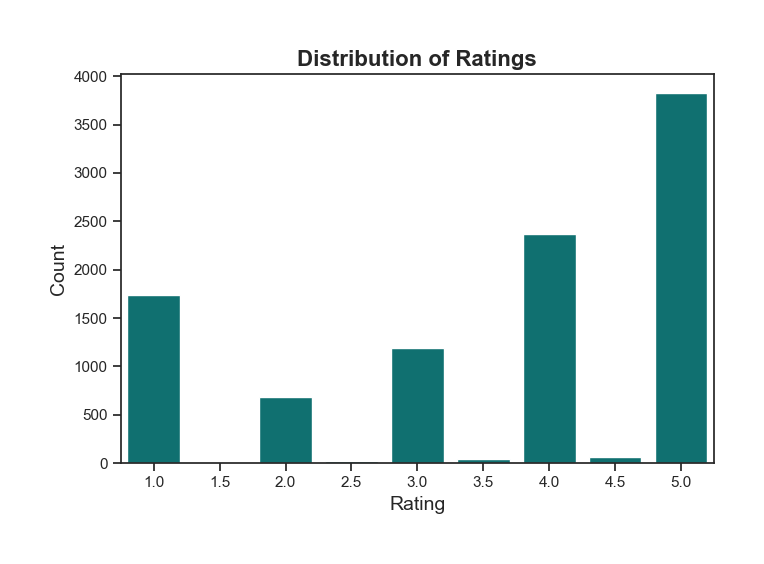

In [146]:
sns.set(style="ticks")

plt.figure(figsize=(7, 5))
ax = sns.countplot(data=reviews, x='Rating', palette=['#008080'])  

ax.set_title('Distribution of Ratings', fontsize=16, fontweight='bold')
ax.set_xlabel('Rating', fontsize=14)
ax.set_ylabel('Count', fontsize=14)

plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


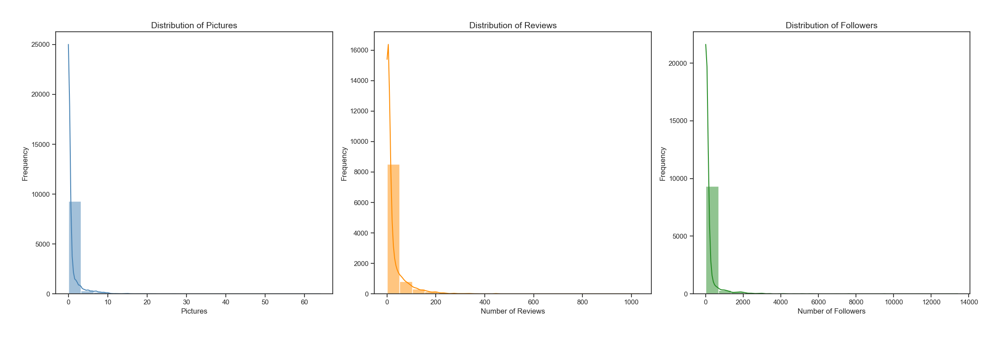

In [147]:
plt.figure(figsize=(22, 7))

# Histogram for 'Pictures'
plt.subplot(1, 3, 1)
sns.histplot(reviews['Pictures'], kde=True, color='steelblue', bins=20)
plt.title('Distribution of Pictures', fontsize=14)
plt.xlabel('Pictures', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Histogram for 'NrReviews'
plt.subplot(1, 3, 2)
sns.histplot(reviews['Nr_Reviews'], kde=True, color='darkorange', bins=20)
plt.title('Distribution of Reviews', fontsize=14)
plt.xlabel('Number of Reviews', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Histogram for 'NrFollowers'
plt.subplot(1, 3, 3)
sns.histplot(reviews['Nr_Followers'], kde=True, color='forestgreen', bins=20)
plt.title('Distribution of Followers', fontsize=14)
plt.xlabel('Number of Followers', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

plt.tight_layout()
plt.show()


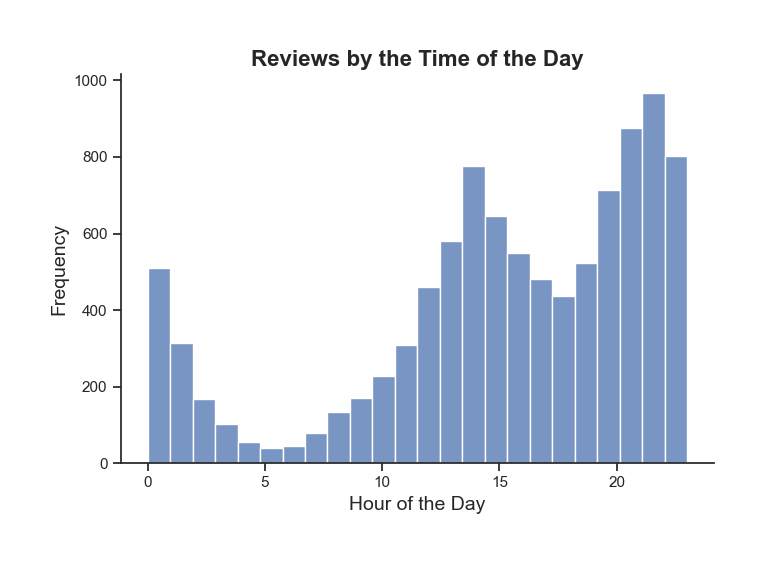

In [148]:
# Convert the 'Time_of_the_day' to a datetime format to extract the hour
reviews['Time_of_the_day'] = pd.to_datetime(reviews['Time_of_the_day'], format='%H:%M')

# Create a histogram of the hours of the day
plt.figure(figsize=(7, 5))
sns.histplot(reviews['Time_of_the_day'].dt.hour, bins=24, kde=False, color=sns.color_palette("deep")[0])

plt.title('Reviews by the Time of the Day', fontsize=16, fontweight='bold')
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

sns.despine()

plt.tight_layout()
plt.show()

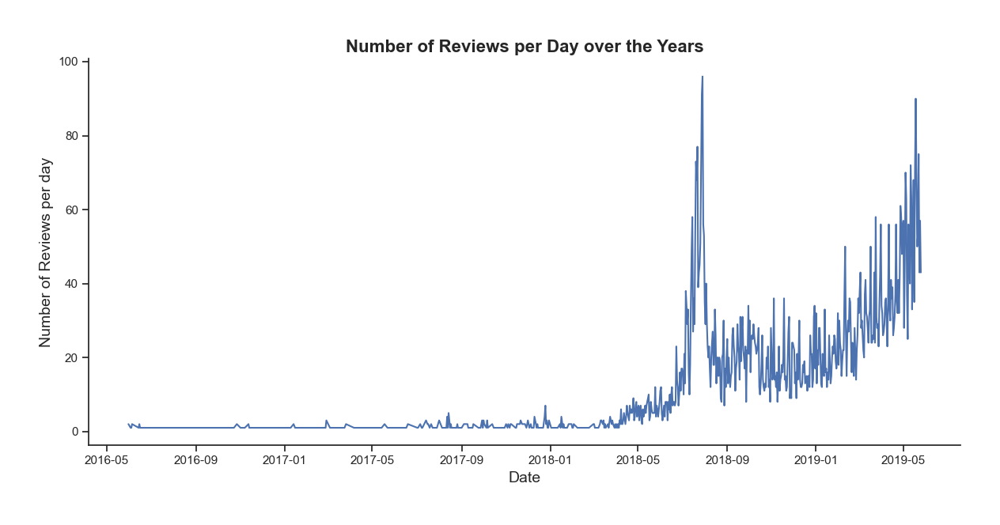

In [149]:
reviews['Date'] = pd.to_datetime(reviews['Date'])
date_counts = reviews.groupby('Date').size()

plt.figure(figsize=(12, 6))
sns.lineplot(x=date_counts.index, y=date_counts.values, color=sns.color_palette("deep")[0])

plt.title('Number of Reviews per Day over the Years', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Reviews per day', fontsize=14)
sns.despine()
plt.tight_layout()
plt.show()

In [150]:
#We have high peaks on the summer of 2018 and on the summer of 2019

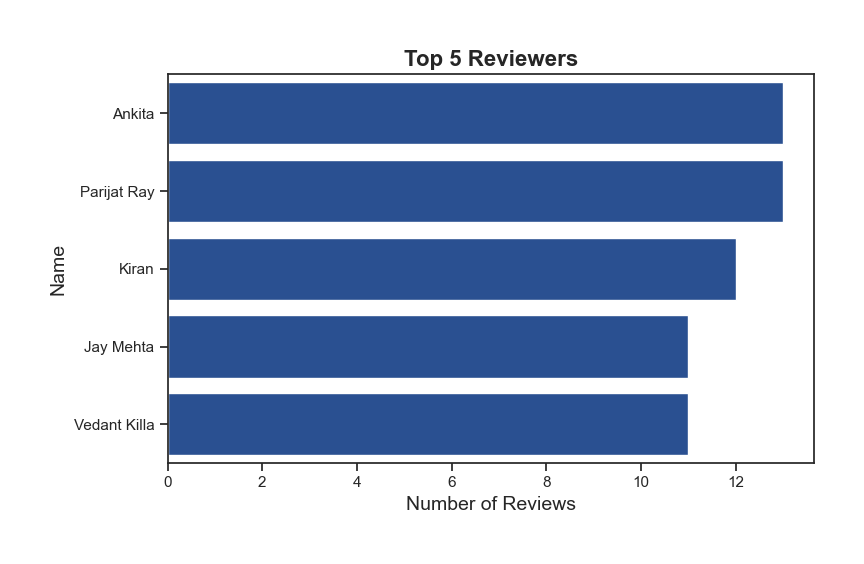

In [151]:
top_reviewers = reviews['Reviewer'].value_counts().head(5)

plt.figure(figsize=(8, 5))
sns.barplot(x=top_reviewers.values, y=top_reviewers.index, color="#194ba2")  # Dark blue color

plt.title('Top 5 Reviewers', fontsize=16, fontweight='bold')
plt.xlabel('Number of Reviews', fontsize=14)
plt.ylabel('Name', fontsize=14)

plt.tight_layout()
plt.show()

### Text Exploration

In [152]:
reviews_= pipeline(reviews,
         "clean_review",
         tokenize=False,
         pos_tag_=True, 
         no_stopwords=True, 
         stops_to_keep=set([]),
         lemmatized=True,
         lower=True, 
         no_numbers=True, 
         user_id=True,
         hashtag=True,
         links=True,
         punctuation=2, 
         no_double_spaces=True, 
         no_emojis_u8=True, 
         no_emojis_non_u8=True,
         non_lat_letter=True,
         contractions=True)
print("done")

done


In [153]:
pd.set_option('display.max_colwidth', None)

In [154]:
reviews_.drop(["Restaurant",
            "Reviewer",
            "Rating",
            "Date",
            'Time_of_the_day',
            "Pictures",	
            "Nr_Reviews",	
            "Nr_Followers"], axis=1).sample(3)

,Review,clean_review,clean_review_no_stopwords,clean_review_pos,clean_review_lemmatized,clean_review_no_contractions
9752,Amazing place with variety of dishes and drinks to enjoy your time to the fullest. I have been here many times but I would suggest you guys to reserve your tables before visiting so that you need not to wait for long especially during weekends. have fun,amazing place with variety of dishes and drinks to enjoy your time to the fullest i have been here many times but i would suggest you guys to reserve your tables before visiting so that you need not to wait for long especially during weekends have fun,amazing place variety dishes drinks enjoy time fullest many times would suggest guys reserve tables visiting need wait long especially weekends fun,"[JJ, NN, NN, NNS, VBP, JJ, NN, JJS, JJ, NNS, MD, VB, NNS, VB, NNS, VBG, VBP, VBP, RB, RB, VBZ, NN]",amazing place variety dish drink enjoy time full many time would suggest guy reserve table visit need wait long especially weekend fun,amazing place with variety of dishes and drinks to enjoy your time to the fullest i have been here many times but
3850,"Visited the place on a Saturday ! We had reservations made for 8pm and reached at around 8:20pm, only to receive a disapproving look by the lady and were told that it is difficult to hold a table this long! The entrance gave a deserted look and we were thinking why is this female so arrogant. Thereafter we got to know the real story as we moved towards the seating area. The place was well lit, with a posh ambience, perfect seating and tranquil yet charming environment. Really loved the idea of the hanging plants amidst the lights.\nWe ordered Lotus stem galauti kebab, kung paw chicken, teriyaki mushroom. The starters were delicious especially the chicken. Beware of the cocktail as you might be in for some surprises.\nOrdered stir fried udon Noodles for main course. Although a bit oily, it was tasty, full of vegetables ! The dark brownie ordered as desert was mouth watering, the taste lingers.\n\nThe staff is courteous and the Vallet very kind and amazing person :)\nAll in all a good experience !",visited the place on a saturday we had reservations made for pm and reached at around pm only to receive a disapproving look by the lady and were told that it is difficult to hold a table this long the entrance gave a deserted look and we were thinking why is this female so arrogant thereafter we got to know the real story as we moved towards the seating area the place was well lit with a posh ambience perfect seating and tranquil yet charming environment really loved the idea of the hanging plants amidst the lights we ordered lotus stem galauti kebab kung paw chicken teriyaki mushroom the starters were delicious especially the chicken beware of the cocktail as you might be in for some surprises ordered stir fried udon noodles for main course although a bit oily it was tasty full of vegetables the dark brownie ordered as desert was mouth watering the taste lingers the staff is courteous and the vallet very kind and amazing person all in all a good experience,visited place saturday reservations made pm reached around pm receive disapproving look lady told difficult hold table long entrance gave deserted look thinking female arrogant thereafter got know real story moved towards seating area place well lit posh ambience perfect seating tranquil yet charming environment really loved idea hanging plants amidst lights ordered lotus stem galauti kebab kung paw chicken teriyaki mushroom starters delicious especially chicken beware cocktail might surprises ordered stir fried udon noodles main course although bit oily tasty full vegetables dark brownie ordered desert mouth watering taste lingers staff courteous vallet kind amazing person good experience,"[JJ, NN, NN, NNS, VBD, NN, VBN, IN, JJ, VBP, VBG, NN, JJ, VBD, JJ, NN, NN, JJ, NN, VBD, VBN, NN, VBG, JJ, JJ, NN, VBD, JJ, JJ, NN, VBD, NNS, VBG, NN, NN, RB, VBZ, NN, NN, JJ, NN, NN, 

In [155]:
bow_vectorizer = CountVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")  #We changes the  default token pattern so it catches 1 word characters also
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")

In [156]:
#Feature extraction using Bag-of-Words

bow_matrix = bow_vectorizer.fit_transform(reviews_["clean_review"]).toarray()
reviews_["review_bow_vector"] = bow_matrix.tolist()
bow_word_list = bow_vectorizer.get_feature_names_out()

In [157]:
#Bow visualization
reviews_bow_df = word_freq_calculator(bow_matrix,bow_word_list)

In [158]:
#Instancing WordCloud
wc = WordCloud(background_color="white",max_words=120, width = 220,height = 220, color_func=lambda *args, **kwargs: (0,0,0))

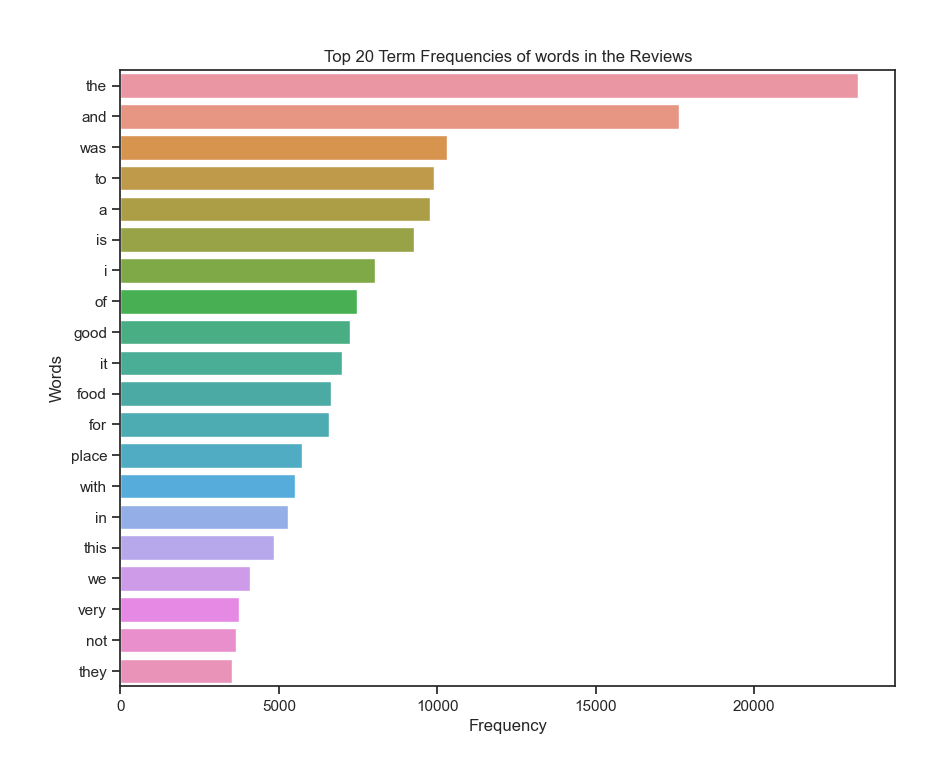

In [159]:
plot_term_frequency(reviews_bow_df, 20,"words in the Reviews", show=False)

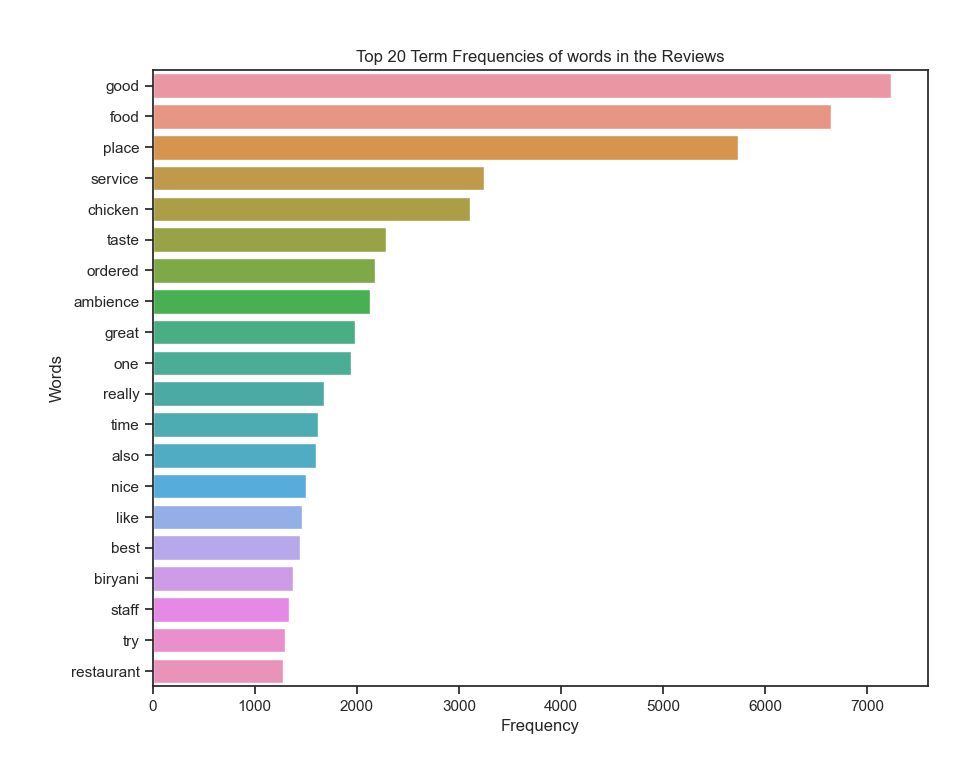

In [160]:
#Now, removing the stopwords
#Feature extraction using Bag-of-Words

bow_matrix = bow_vectorizer.fit_transform(reviews_["clean_review_no_stopwords"]).toarray()
reviews_["review_bow_vector"] = bow_matrix.tolist()
bow_word_list = bow_vectorizer.get_feature_names_out()

#BOW visualization
reviews_bow_df = word_freq_calculator(bow_matrix,bow_word_list)

#Instancing WordCloud
wc = WordCloud(background_color="white",max_words=120, width = 220,height = 220, color_func=lambda *args, **kwargs: (0,0,0))

plot_term_frequency(reviews_bow_df, 20,"words in the Reviews", show=False)

In [161]:
reviews_bow_df

,words,frequency
5327,good,7230
4801,food,6648
9500,place,5734
11315,service,3247
2246,chicken,3110
...,...,...
6560,jithendra,1
6559,jira,1
6557,jiggle,1
6556,jigae,1


In [162]:
reviews_bow_df["pos_tag"] = reviews_bow_df["words"].apply(get_pos_tag)

#create a tree map
fig = px.treemap(reviews_bow_df[:500], 
                path=[px.Constant('Reviews'), 'pos_tag','words'], 
                values='frequency',
                color='frequency',
                color_continuous_scale='viridis',
                )

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [163]:
reviews_= pipeline(reviews,
         "clean_review",
         stops_to_keep=set([]),
         tokenize=True,
         pos_tag_=False, 
         no_stopwords=True, 
         lemmatized=True,
         lower=True, 
         no_numbers=True, 
         user_id=True,
         hashtag=True,
         links=True,
         punctuation=2, 
         no_double_spaces=True, 
         no_emojis_u8=True, 
         no_emojis_non_u8=True,
         non_lat_letter=True,
         contractions=True)
print("done")

done


In [164]:
reviews_.drop(["Restaurant",
            "Reviewer",
            "Rating",
            "Date",
            'Time_of_the_day',
            "Pictures",	
            "Nr_Reviews",	
            "Nr_Followers"], axis=1).sample(3)

,Review,clean_review,clean_review_token,clean_review_no_stopwords,clean_review_lemmatized,clean_review_no_contractions
5460,"I ordered noodles with gobi Manchuria. Trust me... The noodles were so fat and without any taste. The Sauces or the fry that noodles went through, there was no taste at all in it. It was not even having the basic salt. Managed to eat with the gobi given in the box and later realized that there not more than 5 pieces of Manchuria. Thus, I could not even complete the noodles. Was not at all satisfied with the noodles combo box.",i ordered noodles with gobi manchuria trust me the noodles were so fat and without any taste the sauces or the fry that noodles went through there was no taste at all in it it was not even having the basic salt managed to eat with the gobi given in the box and later realized that there not more than pieces of manchuria thus i could not even complete the noodles was not at all satisfied with the noodles combo box,"[i, ordered, noodles, with, gobi, manchuria, trust, me, the, noodles, were, so, fat, and, without, any, taste, the, sauces, or, the, fry, that, noodles, went, through, there, was, no, taste, at, all, in, it, it, was, not, even, having, the, basic, salt, managed, to, eat, with, the, gobi, given, in, the, box, and, later, realized, that, there, not, more, than, pieces, of, manchuria, thus, i, could, not, even, complete, the, noodles, was, not, at, all, satisfied, with, the, noodles, combo, box]","[ordered, noodles, gobi, manchuria, trust, noodles, fat, without, taste, sauces, fry, noodles, went, taste, even, basic, salt, managed, eat, gobi, given, box, later, realized, pieces, manchuria, thus, could, even, complete, noodles, satisfied, noodles, combo, box]","[ordered, noodle, gobi, manchuria, trust, noodle, fat, without, taste, sauce, fry, noodle, go, taste, even, basic, salt, manage, eat, gobi, give, box, later, realize, piece, manchuria, thus, could, even, complete, noodle, satisfied, noodle, combo, box]",ordered noodles gobi manchuria trust noodles fat without taste sauces fry noodles went taste even basic salt managed eat gobi given box later realized pieces manchuria thus could even complete noodles satisfied noodles combo box
5024,"”Nai, They don’t have any punjabi Gal’\n\nFirst things first, really not happy with their service. Two different groups of people who came after us were served earlier than us and another worst thing was Washrooms din have water supply and that created a big problem for most of the customers.\n\nSo finally we got our order after 20-25 min of wait. The lemon coriander soup was quite normal with dense eggy smell. In starters Amrutsari murg was nice with moderate flavours along with malai. This came with grated cheese on top of it which was the only best part. Methi roti was fresh and good which came with 2 pieces. Unlike plain tandoori tasted too bad, it was the flour which got stale over the time may be. Don’t know how they served it. So we ordered Boneless Murg, i guess it was Murg Musalam, this tastes really good just like as i needed less spicy, thick gravy and nice pieces of chicken.\n\nOverall one time try stop.",nai they don t have any punjabi gal first things first really not happy with their service two different groups of people who came after us were served earlier than us and another worst thing was washrooms din have water supply and that created a big problem for most of the customers so finally we got our order after min of wait the lemon coriander soup was quite normal with dense eggy smell in starters amrutsari murg was nice with moderate flavours along with malai this came with grated cheese on top of it which was the only best part methi roti was fresh and good which came with pieces unlike plain tandoori tasted too bad it was the flour which got stale over the time may be don t know how they served it so we ordered boneless murg i guess it was murg musalam this tastes really good just like as i needed less spicy thick gravy

In [165]:
##Context window = 2 words
reviews_co_occurrence_window = cooccurrence_matrix_window_generator(reviews_["clean_review_lemmatized"].tolist(),2)

100%|██████████| 9954/9954 [00:02<00:00, 3827.77it/s]


In [166]:
## Plot with plotly
fig = px.imshow(reviews_co_occurrence_window.iloc[:25, :25], color_continuous_scale='Blues', 
                labels=dict(x="Words", y="Words", color="Count"),
                title="Co-occurrence matrix for Reviews (25 most frequent co-occurring words in a 2-token context window)", 
                width=1000, height=800)

fig.show()

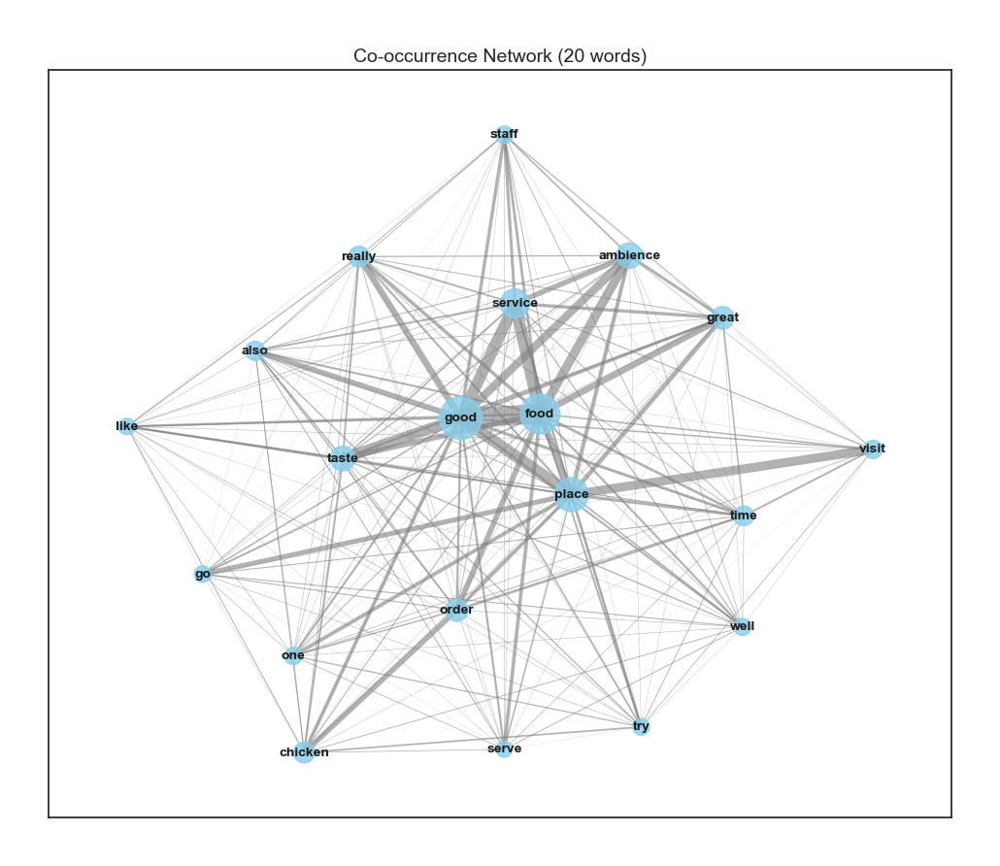

In [167]:
cooccurrence_network_generator(reviews_co_occurrence_window, 20)

In [168]:
reviews_= pipeline(reviews,
         "clean_review",
         stops_to_keep=set([]),
         tokenize=False,
         pos_tag_=False, 
         no_stopwords=True, 
         lemmatized=True,
         lower=True, 
         no_numbers=True, 
         user_id=True,
         hashtag=True,
         links=True,
         punctuation=2, 
         no_double_spaces=True, 
         no_emojis_u8=True, 
         no_emojis_non_u8=True,
         non_lat_letter=True,
         contractions=True)
print("done")

done


##### WordClouds for the reviews based on the Rating

In [169]:
#It makes sense to use TFIDF in this case since we will have separate documents. Each one with the reviews associated with a certain Rating

In [170]:
#Vectorizing using TF-IDF (and including bigrams)
bigram_tfidf_vectorizer = TfidfVectorizer(ngram_range=(1,2), token_pattern=r"(?u)\b\w+\b")

In [171]:
#Separating the reviews based on the Rating

rating1_text = " ".join(reviews_["clean_review_lemmatized"].loc[reviews_["Rating"] == 1])
rating2_text = " ".join(reviews_["clean_review_lemmatized"].loc[reviews_["Rating"] == 2])
rating3_text = " ".join(reviews_["clean_review_lemmatized"].loc[reviews_["Rating"] == 3])
rating4_text = " ".join(reviews_["clean_review_lemmatized"].loc[reviews_["Rating"] == 4])
rating5_text = " ".join(reviews_["clean_review_lemmatized"].loc[reviews_["Rating"] == 5])



#Joining the texts into a corpus to fit the tfidf
reviews_ratings_corpus = [rating1_text, rating2_text, rating3_text, rating4_text, rating5_text]
reviews_ratings_corpus_td_matrix = bigram_tfidf_vectorizer.fit_transform(reviews_ratings_corpus)
reviews_ratings_corpus_td_list = bigram_tfidf_vectorizer.get_feature_names_out()

#Calculating the word frequency for each of the documents
ratings1_vocabulary_df = word_freq_calculator(reviews_ratings_corpus_td_matrix[0].toarray(),\
                                                                      reviews_ratings_corpus_td_list, df_output=False)
ratings2_vocabulary_df = word_freq_calculator(reviews_ratings_corpus_td_matrix[1].toarray(),\
                                                                      reviews_ratings_corpus_td_list, df_output=False)
ratings3_vocabulary_df = word_freq_calculator(reviews_ratings_corpus_td_matrix[2].toarray(),\
                                                                      reviews_ratings_corpus_td_list, df_output=False)
ratings4_vocabulary_df = word_freq_calculator(reviews_ratings_corpus_td_matrix[3].toarray(),\
                                                                      reviews_ratings_corpus_td_list, df_output=False)
ratings5_vocabulary_df = word_freq_calculator(reviews_ratings_corpus_td_matrix[4].toarray(),\
                                                                      reviews_ratings_corpus_td_list, df_output=False)


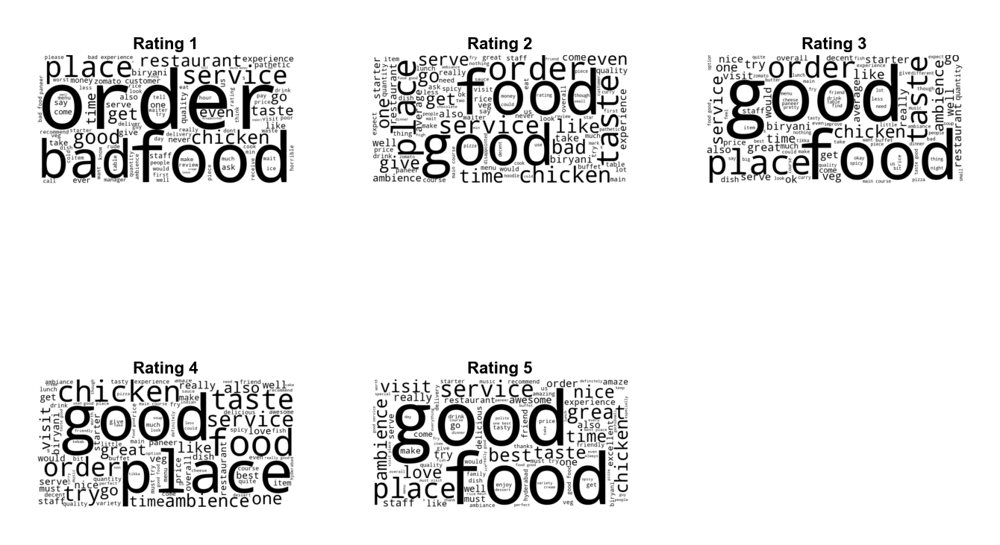

In [172]:
all_rating_vocabularies = [ratings1_vocabulary_df, ratings2_vocabulary_df, ratings3_vocabulary_df, ratings4_vocabulary_df, ratings5_vocabulary_df]

plt.figure(figsize=(16, 10))

for i, vocabulary in enumerate(all_rating_vocabularies, start=1):
    plt.subplot(2, 3, i)
    wc = WordCloud(
        width=800, height=400,
        background_color='white',
        max_words=100,
        colormap=None,
        color_func=lambda *args, **kwargs: 'black',
        contour_color='gray',
        contour_width=1,
        random_state=42,
        relative_scaling=0.5
    )
    wc.generate_from_frequencies(vocabulary)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Rating {i}', fontsize=16, fontweight='bold', color='black')

plt.subplots_adjust(wspace=0.3, hspace=0.3)

plt.show()

<font color='#BFD72F' size=5>3. Multilabel Classification (Information Requirement 3311)</font> <a class="anchor" id="P3"></a>
  
[Back to TOC](#toc)

<font size=5>3.1 Specific Data Preparation</font> <a class="anchor" id="P31"></a>

<i>In the context of multilabel classification, it is crucial to integrate two distinct datasets and to employ a binary representation for the cuisine column. Furthermore, the preprocessing of the text should align with established literature, while incorporating modifications that have demonstrated effectiveness in achieving optimal outcomes.</i>

In [173]:
work = reviews.merge(restaurants, how="left", left_on="Restaurant", right_on="Name")[["Restaurant", "Review", "Cuisines", "labels"]]  
work.sample(2)

,Restaurant,Review,Cuisines,labels
5035,Gal Punjab Di,Finally! Found something in hyderabad that tastes like north indian food. Tried the chilli chicken and thankfully it came without curry leaves. Also ordered roomali roti which was quite large in size.\n\nPackaging: 4/5\nTaste: 3.5/5\nQuantity: 4/5\n\nWill i order again: definitely!,"[North Indian, Continental]","[0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
6407,Hyderabad Chefs,"Worst service and the food is pathetic.Biryani is not at all hot and the chicken is stored one which smells very bad.Coming to chicken Lollipop,When we ordered it he brought drumsticks and saying it’s lollipop.They are trying make customers fools and making cash for the ppl who comes as team outing on Friday.\nFood-1/5\nService-0( Arrogant servants)\nAmbiance-2/5","[North Indian, Chinese]","[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"


In [174]:
work = pipeline(work,
                tokenize=False,
                lemmatized=True,
                no_stopwords=True,
                stops_to_keep = set([]),
                no_emojis_u8=True, 
                no_emojis_non_u8=True,
                no_numbers = True,
                hashtag=True,
                links=True,
                punctuation=2,
                non_lat_letter=True,
                lower=True,
                user_id=True,
                no_double_spaces=True,
                contractions=True)
work["Review"] = work["clean_text_no_contractions"]
work["label_binary"] = work["labels"]
work.drop(["clean_text_lemmatized", 
           "labels",
           "Cuisines", 
           "clean_text", 
           "clean_text_no_stopwords",
           "clean_text_no_contractions"], axis=1, inplace=True)

work.sample(2)

,Restaurant,Review,label_binary
6440,Hyderabad Chefs,butter milk delivered,"[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
9557,Hyderabadi Daawat,worest haleem never tasted like chewing half cooked meat ingredients flavor eating haleem bad experience eating haleem k,"[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"


In [175]:
work["Review"] = work["Review"].apply(lambda x: None if (str(x).strip()=="" or x=="nan" or x==[]) else x)
work.dropna(inplace=True)
work.describe()

,Restaurant,Review,label_binary
count,9930,9930,9930
unique,100,9161,82
top,Beyond Flavours,good,"[1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]"
freq,100,340,498


In [176]:
X = work.copy()
X["Review_tfidf"] = TfidfVectorizer().fit_transform(X["Review"].to_numpy()).toarray().tolist()

y = X[["label_binary"]]
X = X[["Review_tfidf"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.8,
                                                    random_state=42)
X_train = np.array([np.array(el[0]) for el in X_train.to_numpy()])
X_test = np.array([np.array(el[0]) for el in X_test.to_numpy()])
y_train = np.array([np.array(el[0]) for el in y_train.to_numpy()])
y_test = np.array([np.array(el[0]) for el in y_test.to_numpy()])

<font size=5>3.2 Model Implementation</font> <a class="anchor" id="P32"></a>

<i>For multilabel classification, we chose a classifier chain with decision trees. This decision comes from the belief in the correlations among different cuisines and the superior division capability of decision trees.</i>

In [177]:
class GridClassifierTuner(ClassifierMixin, BaseEstimator):
    def __init__(self, classifier, **kwargs):
        self.classifier = classifier

    def fit(self, X_, y_, **kwargs):
        X_train_ = X_
        y_train_ = y_
            
        try:
            X_train_ = X_train_.toarray()
        except AttributeError:
            pass
        try:
            y_train_ = y_train_.to_numpy()
        except AttributeError:
            pass

        self.classifier.fit(X_train_, y_train_)

        self.X_ = X_train_
        self.y_ = y_train_

        return self
    
    def predict(self, X_test_raw):
        
        # Check if fit has been called
        check_is_fitted(self)

        X_test_ = X_test_raw

        try:
            X_test_ = check_array(X_test_.toarray())
        except AttributeError:
            X_test_ = check_array(X_test_)
            
        y_pred_ = self.classifier.predict(X_test_)

        return y_pred_

In [178]:
# NB THIS CELL TAKES AROUND 25 HOURS TO RUN

"""dummy_classifier = ClassifierChain(DecisionTreeClassifier())
tuner = GridClassifierTuner(dummy_classifier)

padam_padam = {
    "classifier__base_estimator__class_weight": ["balanced"],
    "classifier__base_estimator__criterion" : ["gini"],
    "classifier__base_estimator__max_depth" : [5, 10, 15],
    "classifier__base_estimator__min_samples_split": [2, 10, 20],
    "classifier__base_estimator__min_samples_leaf": [1, 10, 20],
    "classifier__base_estimator__max_leaf_nodes": [10, 50]
}

scores = ["accuracy","precision_weighted","recall_weighted","f1_weighted"]

hgs = GridSearchCV(tuner, padam_padam, scoring=scores, verbose=4, refit="f1_weighted")

hgs_result = hgs.fit(X_train, y_train)"""

'dummy_classifier = ClassifierChain(DecisionTreeClassifier())\ntuner = GridClassifierTuner(dummy_classifier)\n\npadam_padam = {\n    "classifier__base_estimator__class_weight": ["balanced"],\n    "classifier__base_estimator__criterion" : ["gini"],\n    "classifier__base_estimator__max_depth" : [5, 10, 15],\n    "classifier__base_estimator__min_samples_split": [2, 10, 20],\n    "classifier__base_estimator__min_samples_leaf": [1, 10, 20],\n    "classifier__base_estimator__max_leaf_nodes": [10, 50]\n}\n\nscores = ["accuracy","precision_weighted","recall_weighted","f1_weighted"]\n\nhgs = GridSearchCV(tuner, padam_padam, scoring=scores, verbose=4, refit="f1_weighted")\n\nhgs_result = hgs.fit(X_train, y_train)'

<font size=5>3.3 Model Evaluation</font> <a class="anchor" id="P43"></a>

<i>In the following cells, you can see the best hyperparameters and overall results for our classification..</i>

In [179]:
#hgs_result.best_params_

output:

{'classifier__base_estimator__class_weight': 'balanced',
 'classifier__base_estimator__criterion': 'gini',
 'classifier__base_estimator__max_depth': 15,
 'classifier__base_estimator__max_leaf_nodes': 50,
 'classifier__base_estimator__min_samples_leaf': 1,
 'classifier__base_estimator__min_samples_split': 10}

In [180]:
#for score in scores:
#    print("{} = {}".format(score,round(hgs_result.cv_results_['mean_test_{}'.format(score)][hgs_result.best_index_],3)))

output:

accuracy = 0.037
precision_weighted = 0.365
recall_weighted = 0.447
f1_weighted = 0.38

<font color='#BFD72F' size=5>4. Sentiment Analysis (Information Requirement 3312)</font> <a class="anchor" id="P4"></a>
  
[Back to TOC](#toc)

<font size=5>4.1 Specific Data Preparation</font> <a class="anchor" id="P41"></a>

<i>WORDS WORDS WORDS.</i>

In [181]:
sentiment_data = reviews[["Review", "Rating"]]
sentiment_data = pipeline(sentiment_data, "Review", 
                          no_stopwords=True, 
                          hashtag=True, 
                          no_emojis_non_u8=True,
                          contractions=True)
sentiment_data["Review"] = sentiment_data["Review_no_contractions"]
sentiment_data.drop(["Review_no_stopwords", "Review_no_contractions"], axis=1, inplace=True)
sentiment_data["Review"] = sentiment_data["Review"].apply(lambda x: str(x) if (x!="" or x==[]) else None)
sentiment_data.dropna(inplace=True)
sentiment_data.sample(3)

,Review,Rating
7500,Delivery time,5.0
7986,food lover . love food increased eating food . Ate loveliest pasta biryani ever . One best restaurants .,5.0
466,"place decently crowded thursday evening . Ambience nice perfect music , added life whole setup . Coming menu good amount beer options choose . ordered Apple cider beer amazing . food options ordered three cheese mushroom California chicken pizza . items good . great experience . Also would like give shout-out Keshav prompt service .",5.0


<font size=5>4.2 Model Implementation</font> <a class="anchor" id="P42"></a>

<i>WORDS WORDS WORDS.</i>

In [182]:
# approximate running time:3m 10.1s
sentiment(sentiment_data, "Review", False, "vader", "full_vader")
sentiment(sentiment_data, "Review", True, "vader", "sen_vader")
sentiment(sentiment_data, "Review", False, "textblob", "full_textblob")
sentiment(sentiment_data, "Review", True, "textblob", "sen_textblob")
print("done")

done


<font size=5>4.3 Model Evaluation</font> <a class="anchor" id="P43"></a>

<i>WORDS WORDS WORDS.</i>

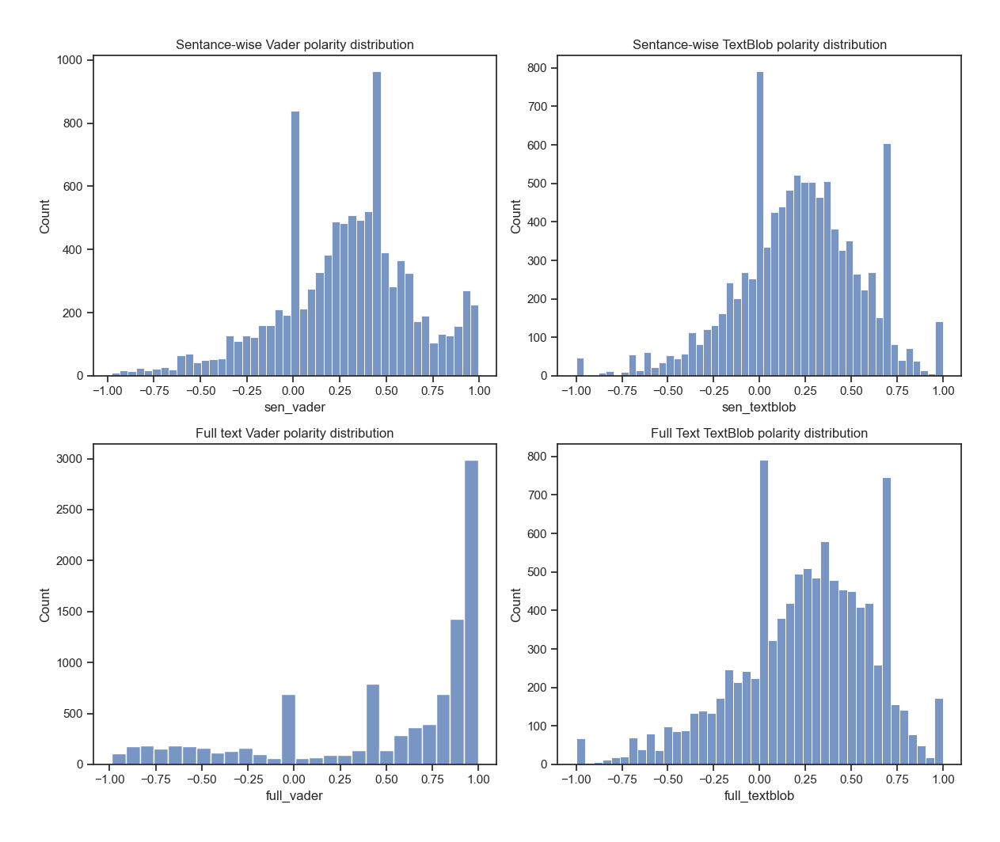

In [183]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(sentiment_data["sen_vader"], ax=axes[0, 0])
axes[0, 0].set_title("Sentance-wise Vader polarity distribution")

sns.histplot(sentiment_data["sen_textblob"], ax=axes[0, 1])
axes[0, 1].set_title("Sentance-wise TextBlob polarity distribution")

sns.histplot(sentiment_data["full_vader"], ax=axes[1, 0])
axes[1, 0].set_title("Full text Vader polarity distribution")

sns.histplot(sentiment_data["full_textblob"], ax=axes[1, 1])
axes[1, 1].set_title("Full Text TextBlob polarity distribution")

plt.tight_layout()
plt.show()

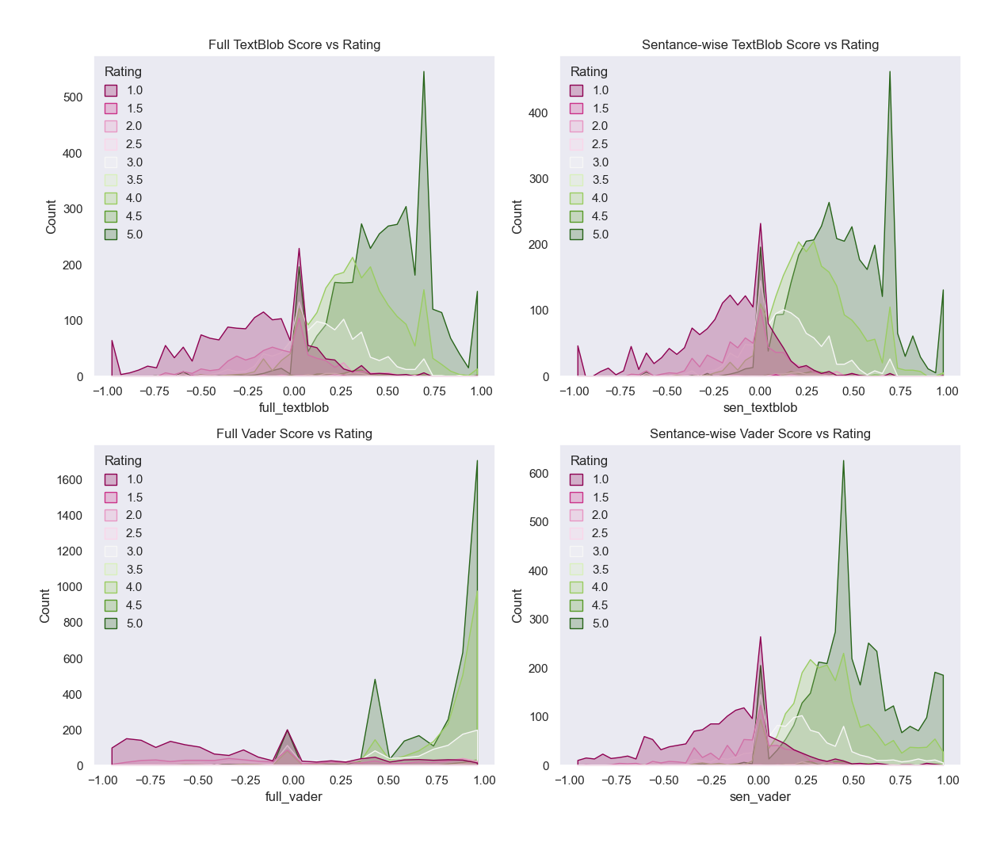

In [184]:
sns.set_theme(style="dark")
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

sns.histplot(sentiment_data, x="full_textblob", hue="Rating", multiple="layer", element="poly", palette="PiYG", ax=axes[0, 0])
axes[0, 0].set_title("Full TextBlob Score vs Rating")

sns.histplot(sentiment_data, x="sen_textblob", hue="Rating", multiple="layer", element="poly", palette="PiYG", ax=axes[0, 1])
axes[0, 1].set_title("Sentance-wise TextBlob Score vs Rating")

sns.histplot(sentiment_data, x="full_vader", hue="Rating", multiple="layer", element="poly", palette="PiYG", ax=axes[1, 0])
axes[1, 0].set_title("Full Vader Score vs Rating")

sns.histplot(sentiment_data, x="sen_vader", hue="Rating", multiple="layer", element="poly", palette="PiYG", ax=axes[1, 1])
axes[1, 1].set_title("Sentance-wise Vader Score vs Rating")

plt.tight_layout()
plt.show()
sns.set_theme(style='white')

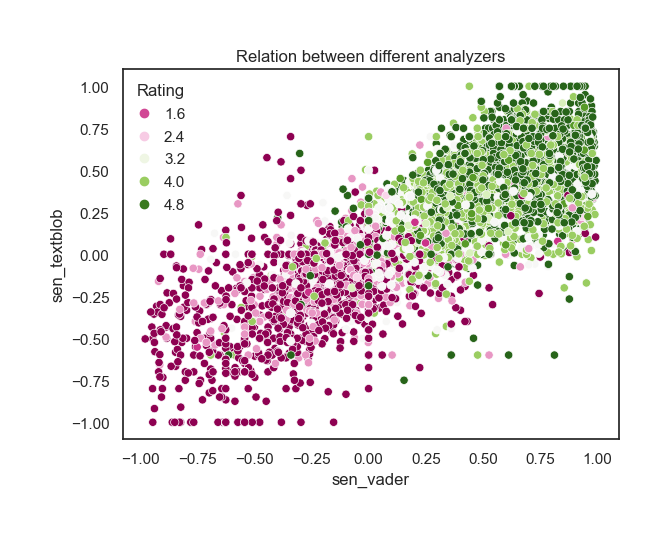

In [185]:
sns.scatterplot(sentiment_data, x="sen_vader", y="sen_textblob", hue="Rating", palette="PiYG")
plt.title("Relation between different analyzers")
plt.show()


In [186]:
sentiment_data.drop("Review", axis=1).corr()["Rating"].sort_values(ascending=False)

Rating           1.000000
full_textblob    0.712098
full_vader       0.698360
sen_textblob     0.691420
sen_vader        0.687622
Name: Rating, dtype: float64

Using full_vader:
TRAIN R2: 0.4905921173553296, TEST R2: 0.4833011403402707, MAE: 0.8500833234054386

Using sen_vader:
TRAIN R2: 0.4753650522960313, TEST R2: 0.46895314479965877, MAE: 0.8690385498384351

Using full_textblob:
TRAIN R2: 0.5101736210175585, TEST R2: 0.5023919956946028, MAE: 0.8236070790904209

Using sen_textblob:
TRAIN R2: 0.48023649323893214, TEST R2: 0.4747896184053554, MAE: 0.8538023356484143



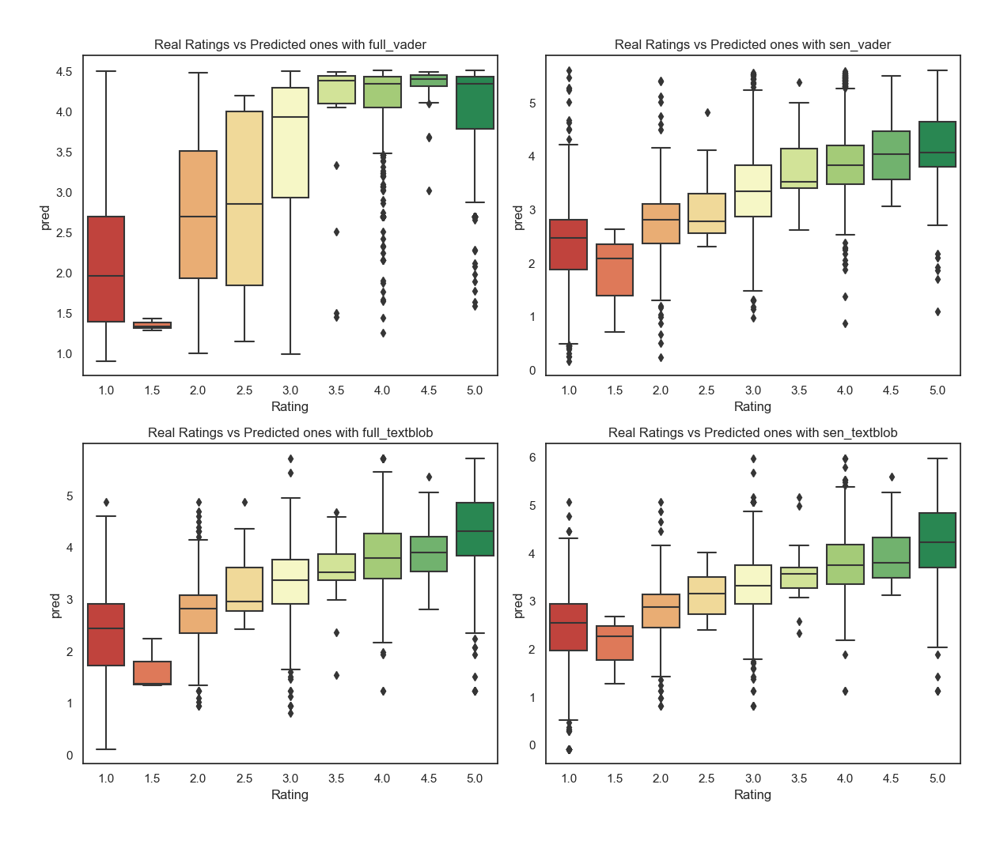

In [187]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

X = sentiment_data.drop(["Rating", "Review"], axis=1)
y = sentiment_data[["Rating"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42, stratify=y)

for i, col in enumerate(X_train.columns):
    lr = LinearRegression().fit(X_train[[col]], y_train.astype(str))
    train_r2 = lr.score(X_train[[col]], y_train)
    test_r2 = lr.score(X_test[[col]], y_test)
    
    # Predicting on the test set
    predictions = lr.predict(X_test[[col]])
    
    # Calculating MAE
    mae = mean_absolute_error(y_test, predictions)
    
    print(f"Using {col}:\nTRAIN R2: {train_r2}, TEST R2: {test_r2}, MAE: {mae}\n")

    X_copy = X_test.copy()
    X_copy["Rating"] = y_test
    X_copy["pred"] = predictions

    sns.boxplot(X_copy, x="Rating", y="pred", palette="RdYlGn", ax=axes[int(i>=2), int(i%2!=0)])
    axes[int(i>=2), int(i%2!=0)].set_title(f"Real Ratings vs Predicted ones with {col}")

plt.tight_layout()
plt.show()


<font color='#BFD72F' size=5>5. Co-occurence Analysis. Clustering (Information Requirement 3321)</font> <a class="anchor" id="P5"></a>
  
[Back to TOC](#toc)

<font size=5>5.1.1 Specific Data Preparation</font> <a class="anchor" id="P51"></a>

<i>We performed text preprocessing for co-occurrence analysis, similar to literature, and also extracted various food names.</i>

In [72]:
reviews_ = pipeline(
    reviews, 
    "clean_review",
    tokenize=False,
    pos_tag_=False,
    no_stopwords=True,
    lemmatized=True,
    lower=True,
    no_numbers=True,
    user_id=True,
    hashtag=True,
    links=True,
    punctuation=2,
    no_double_spaces=True,
    no_emojis_u8=True,
    no_emojis_non_u8=True,
    non_lat_letter=True,
    #contractions=True
)
#reviews_ = reviews_[reviews_["clean_review_no_contractions"].apply(lambda x: x!=[] and x!="")]
#reviews_.dropna(inplace=True)

In [73]:
reviews_list = reviews_['clean_review_lemmatized'].tolist()

In [74]:
# Extract nouns/entities as dish candidates
all_dish_candidates = extract_nouns_and_entities(reviews_list)
dish_counts = Counter(all_dish_candidates)

# Step 2: Filter for frequent nouns (possible dish names)
threshold = 3 
dish_list = [dish for dish, count in dish_counts.items() if count >= threshold]
print("Identified Dish Names:", dish_list[:10])

Identified Dish Names: ['food', 'lunch', 'cost', 'place', 'brunch', 'friend', 'parent', 'waiter', 'ambience', 'service']


In [75]:
#From the big list above, we filtered the ones that correspond to foods and drinks

foods_and_drinks= ['mutton','pradeep', 'shubro', 'papiya', 'shuvro', 'soup', 'honey','corn', 'cheese', 'paneer', 
                   'pasta', 'brownie', 'tomato', 'basil', 'shorba', 'sonalin','bread', 'shaam', 'savera', 'raita',
                   'cherry', 'cake', 'noodle','tikka', 'cottage', 'pizza', 'olive','mocktails','sizzlers', 'biryani',
                   'fish','onion', 'egg', 'rice',  'gachibowli',  'pudding','sizzler', 'chicken', 'butter', 'beverage', 
                   'masala', 'palak', 'moong', 'dal', 'halwa', 'ice', 'fruit', 'water','biriyani', 'bean','popcorn', 
                   'pulav', 'curry', 'lime', 'biryanis','icecreams','panner', 'mushroom', 'jam',  'gulab', 'jalebi', 
                   'potato', 'barbeque', 'sushi','salad', 'milk', 'ranjit', 'rabdi', 'chocolate', 'ramzan', 'pineapple',
                   'bbq', 'sandwich', 'icecream', 'naan', 'tadka', 'shawarma',  'tandoori', 'kebabs', 'ghee', 'juice', 
                   'punjabi', 'cider', 'beer', 'sarveshwar', 'chill', 'steak', 'apple', 'tea', 'vodka', 'cocktail', 
                   'lobster', 'shell', 'wrap', 'bhurji', 'risotto', 'lemon', 'soda', 'coconut','fillet',  'crab', 
                   'pork', 'beef', 'seafood','wine', 'pomfret', 'liquor',  'broccoli', 'blueberry', 'raspberry',  
                   'gobi', 'paratha', 'rajma', 'tofu', 'cabbage', 'sabji', 'oat', 'chawal', 'pickle', 'carrot', 'chana', 
                   'chaat', 'gooey', 'burji', 'ketchup', 'watermelon', 'makhni', 'banana', 'sesame', 'mayo',  'coriander', 
                   'shawarmas',  'hummus', 'shahghouse','chai', 'falafel', 'goid',  'chilla', 'kiwi', 'coke',  'toast', 
                   'gin',  'rum',  'mustard',  'pancake', 'malai', 'shahi',  'cafe', 'tacos', 'cockroach','noodles', 
                   'bruschetta',  'ferrero', 'tiramisu',  'fudge',  'kolkata', 'anjeer', 'waffle',  'caramel', 'custom', 
                   'velvet', 'coffee', 'milkshake','dahi', 'papri', 'lassi', 'bhaji', 'kofta',  'barbecue','browine', 
                   'prakash', 'dhaba', 'spaghetti', 'nachos', 'lolipop', 'burger', 'nugget', 'biscuit', 'sarson', 'panneer', 
                   'nacho', 'pie', 'meetha',  'pakwaan', 'gobhi', 'cheesecake','salmon', 'rib', 'berry', 'chili', 'wasabi',  
                   'strawberry',  'cupcake', 'pesto', 'prabhu', 'sausages',  'pizzas', 'gelato',  'whiskey', 'martini', 
                   'ribs','shivam', 'biriyanis', 'raitha', 'buttermilk', 'natukodi',  'tuna',  'marsala', 'charcoal', 
                   'kitkat', 'masalas', 'jamuns',  'ravioli', 'okish', 'sambar', 'teriyaki', 'cappuccino', 'latte', 
                   'lettuce',  'pastas', 'muffins', 'biscuits', 'cupcakes', 'muffin', 'samosa','mocha',  'raju', 'gadwal', 
                   'ulavacharu', 'junnu', 'suhail', 'specialise', 'dimsum', 'goreng', 'nasi', 'dosas', 'poha', 'upma',  
                   'pachadi', 'pas',  'manchurian', 'macaroon', 'gelatos', 'bagel', 'eggs', 'quiche',  'cheddar', 
                   'cucumber', 'cookie', 'hotdog', 'mojito',  'nawabi', 'oyster', 'shrimp', 'cauliflower',  'ooze', 
                   'suvendu', 'raza', 'shakeel', 'subendu', 'narender', 'ritam', 'labonel', 'theobroma', 'feta',  
                   'donuts','donut']

In [76]:
#Filtering each review to retain only the words that are present in the dataset called foods_and_drinks
filtered_reviews = [
    [word for word in review.split() if word in foods_and_drinks]  # Keep only dish names
    for review in reviews_list
]


<font size=5>5.1.2 Model Implementation</font> <a class="anchor" id="P52"></a>

<i>Here is the co-occurrence matrix displayed below.</i>

In [77]:
# Count co-occurrences of dishes
co_occurrence_counter = Counter()
for review in filtered_reviews:
    pairs = combinations(review, 2)  # Get all pairs of dishes in each review
    co_occurrence_counter.update(pairs)

# Create co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(index=dish_list, columns=dish_list).fillna(0)
for (dish1, dish2), count in co_occurrence_counter.items():
    co_occurrence_matrix.loc[dish1, dish2] = count
    co_occurrence_matrix.loc[dish2, dish1] = count

print("Co-occurrence Matrix:")
print(co_occurrence_matrix)

Co-occurrence Matrix:
         food  lunch  cost  place  brunch  friend  parent  waiter  ambience  \
food      0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
lunch     0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
cost      0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
place     0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
brunch    0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
...       ...    ...   ...    ...     ...     ...     ...     ...       ...   
achaari   0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
gosht     0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
zega      0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
pottery   0.0    0.0   0.0    0.0     0.0     0.0     0.0     0.0       0.0   
prakash   NaN    NaN   NaN    NaN     NaN     NaN     NaN     NaN       NaN   

         service  ...  khaas 

<font size=5>5.1.3 Model Evaluation</font> <a class="anchor" id="P53"></a>

<i>To gain a better understanding of co-occurrences, please refer to the graph provided.</i>

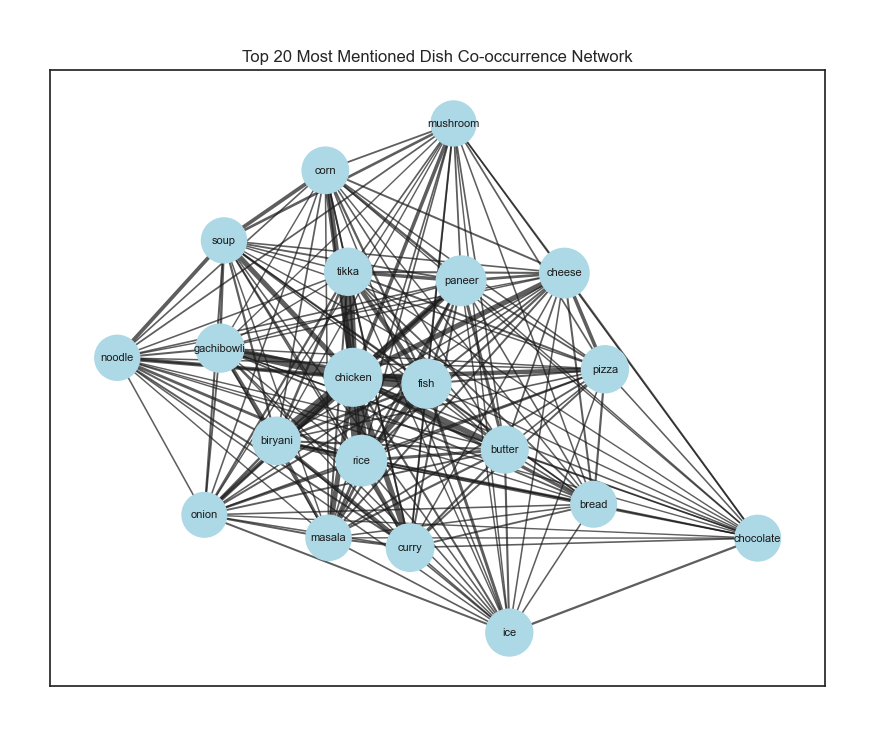

In [108]:
# Get the top 20 most frequent dishes based on co-occurrence counts
# First, we count how many times each dish appears in the co-occurrence pairs
dish_counts = Counter([dish1 for (dish1, dish2) in co_occurrence_counter.keys()] +
                      [dish2 for (dish1, dish2) in co_occurrence_counter.keys()])

# Get the top 20 dishes
top_20_dishes = [dish for dish, count in dish_counts.most_common(20)]

# Create a graph from the co-occurrence matrix, only including the top 20 dishes
G = nx.Graph()
for (dish1, dish2), count in co_occurrence_counter.items():
    # Add the edge only if both dishes are in the top 20 and the count is > 1
    if dish1 in top_20_dishes and dish2 in top_20_dishes and dish1 != dish2 and count > 1:
        G.add_edge(dish1, dish2, weight=count)

# Check if the graph is empty, which might happen if there are no edges between top dishes
if G.number_of_edges() == 0:
    print("No edges found between the top 20 dishes. Try increasing the co-occurrence threshold.")

# Create a plot with an explicit axis
fig, ax = plt.subplots(figsize=(10, 8))
pos = nx.spring_layout(G, seed=42) 

#Nodes
# Node sizes are scaled by how many times the dish appears in the co-occurrence pairs
node_sizes = [(dish_counts[dish] * 4) for dish in G.nodes()]
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=node_sizes, node_color="lightblue")

# Calculate the edge widths (scaled to range 1-10)
min_weight = min([G[u][v]["weight"] for u, v in G.edges()])
max_weight = max([G[u][v]["weight"] for u, v in G.edges()])
edge_widths = [((G[u][v]["weight"] - min_weight) / (max_weight - min_weight)) * 10 + 1 for u, v in G.edges()]

# Draw the edges with adjusted thickness
nx.draw_networkx_edges(G, pos, ax=ax, width=edge_widths, alpha=0.7)

# Draw the node labels
nx.draw_networkx_labels(G, pos, ax=ax, font_size=8)

# Set title and show the plot
ax.set_title("Top 20 Most Mentioned Dish Co-occurrence Network")
plt.show()


<font size=5>5.2.1 Specific Data Preparation</font> <a class="anchor" id="P51"></a>

<i>For the preprocessing step before clustering, we utilized two techniques: Doc2Vec and Bag of Words.</i>

[Back to TOC](#toc)

In [79]:
#Merge cuisine types from the resturants dataset into the reviews dataset
reviews_ = reviews_.merge(restaurants_copy[['Name', 'Cuisines']], 
                          left_on='Restaurant', 
                          right_on='Name', 
                          how='left')

reviews_ = reviews_.drop(columns=['Name'])

In [80]:
# Vectorise using BOW
bow_vectorizer = CountVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")
reviews_bow_td_matrix = bow_vectorizer.fit_transform(reviews_["clean_review_lemmatized"]).toarray()
reviews_["bow_vector"] = reviews_bow_td_matrix.tolist()

# Vectorise using Doc2Vec
d2v = Doc2Vec 
documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(reviews_["clean_review"])]
d2v_model = d2v(documents, vector_size=300, window=6, min_count=1, workers=4, epochs=20)
reviews_["doc2vec_vector"] = [d2v_model.dv[idx].tolist() for idx in tqdm(range(len(reviews_)))]

100%|██████████| 9954/9954 [00:00<00:00, 69186.72it/s]


In [81]:
#Converting to arrays
reviews_bow_td_matrix = np.array([[component for component in doc] for doc in reviews_["bow_vector"]])
reviews_doc2vec_td_matrix = np.array([[component for component in doc] for doc in reviews_["doc2vec_vector"]])

<font size=5>5.2.2 Model Implementation</font> <a class="anchor" id="P52"></a>

<i>Initially, we attempted to use KMeans. To determine the appropriate number of clusters, we examined the inertia.</i>

In [152]:
#Plotting the inertia
inertia_plotter(reviews_bow_td_matrix, 30)

100%|██████████| 29/29 [05:23<00:00, 11.15s/it]


In [153]:
inertia_plotter(reviews_doc2vec_td_matrix,30)

100%|██████████| 29/29 [00:15<00:00,  1.92it/s]


In [ ]:
#Finding the elbow
elbow_finder(reviews_bow_td_matrix,40)

  2%|▎         | 1/40 [00:03<01:57,  3.02s/it]

For k = 1, inertia = 381842.851


  5%|▌         | 2/40 [00:10<03:25,  5.41s/it]

For k = 2, inertia = 367401.129


  8%|▊         | 3/40 [00:18<04:16,  6.93s/it]

For k = 3, inertia = 359799.487


 10%|█         | 4/40 [00:27<04:34,  7.62s/it]

For k = 4, inertia = 358660.404


 12%|█▎        | 5/40 [00:35<04:30,  7.72s/it]

For k = 5, inertia = 354239.414


 15%|█▌        | 6/40 [00:44<04:32,  8.02s/it]

For k = 6, inertia = 350765.335


 18%|█▊        | 7/40 [00:52<04:31,  8.22s/it]

For k = 7, inertia = 348924.007


 20%|██        | 8/40 [00:59<04:11,  7.85s/it]

For k = 8, inertia = 345653.442


 22%|██▎       | 9/40 [01:10<04:33,  8.81s/it]

For k = 9, inertia = 343549.151


 25%|██▌       | 10/40 [01:19<04:29,  8.97s/it]

For k = 10, inertia = 342759.791


 28%|██▊       | 11/40 [01:29<04:25,  9.16s/it]

For k = 11, inertia = 341796.07


 30%|███       | 12/40 [01:39<04:22,  9.36s/it]

For k = 12, inertia = 340721.455


 32%|███▎      | 13/40 [01:48<04:13,  9.40s/it]

For k = 13, inertia = 338574.057


 35%|███▌      | 14/40 [02:02<04:36, 10.62s/it]

For k = 14, inertia = 336678.566


 38%|███▊      | 15/40 [02:14<04:34, 11.00s/it]

For k = 15, inertia = 335490.729


 40%|████      | 16/40 [02:26<04:30, 11.28s/it]

For k = 16, inertia = 334836.761


 42%|████▎     | 17/40 [02:37<04:21, 11.35s/it]

For k = 17, inertia = 334881.659


 45%|████▌     | 18/40 [02:47<03:59, 10.90s/it]

For k = 18, inertia = 334331.577


 48%|████▊     | 19/40 [02:59<03:55, 11.19s/it]

For k = 19, inertia = 333007.834


 50%|█████     | 20/40 [03:11<03:50, 11.52s/it]

For k = 20, inertia = 331649.217


 52%|█████▎    | 21/40 [03:23<03:42, 11.71s/it]

For k = 21, inertia = 329942.983


 55%|█████▌    | 22/40 [03:36<03:35, 11.96s/it]

For k = 22, inertia = 329420.512


 57%|█████▊    | 23/40 [03:48<03:22, 11.91s/it]

For k = 23, inertia = 328680.087


 60%|██████    | 24/40 [04:04<03:31, 13.20s/it]

For k = 24, inertia = 327789.957


 62%|██████▎   | 25/40 [04:17<03:17, 13.16s/it]

For k = 25, inertia = 327736.58


 65%|██████▌   | 26/40 [04:32<03:10, 13.63s/it]

For k = 26, inertia = 327429.752


 68%|██████▊   | 27/40 [04:45<02:56, 13.60s/it]

For k = 27, inertia = 326988.662


 70%|███████   | 28/40 [04:58<02:38, 13.24s/it]

For k = 28, inertia = 326179.164


 72%|███████▎  | 29/40 [05:12<02:28, 13.53s/it]

For k = 29, inertia = 326003.191


 75%|███████▌  | 30/40 [05:24<02:12, 13.23s/it]

For k = 30, inertia = 325422.821


 78%|███████▊  | 31/40 [05:41<02:07, 14.16s/it]

For k = 31, inertia = 324582.197


 80%|████████  | 32/40 [05:54<01:50, 13.82s/it]

For k = 32, inertia = 323876.762


 82%|████████▎ | 33/40 [06:11<01:44, 14.92s/it]

For k = 33, inertia = 323327.236


In [132]:
elbow_finder(reviews_doc2vec_td_matrix,40)

  5%|▌         | 2/40 [00:00<00:02, 15.99it/s]

For k = 1, inertia = 5413.223
For k = 2, inertia = 4967.31
For k = 3, inertia = 4700.07


 10%|█         | 4/40 [00:00<00:02, 12.95it/s]

For k = 4, inertia = 4359.452
For k = 5, inertia = 4201.916


 15%|█▌        | 6/40 [00:00<00:03, 10.30it/s]

For k = 6, inertia = 3950.399
For k = 7, inertia = 3869.492


 22%|██▎       | 9/40 [00:00<00:03,  8.03it/s]

For k = 8, inertia = 3805.637
For k = 9, inertia = 3732.205


 28%|██▊       | 11/40 [00:01<00:03,  7.63it/s]

For k = 10, inertia = 3684.534
For k = 11, inertia = 3642.586


 32%|███▎      | 13/40 [00:01<00:04,  6.52it/s]

For k = 12, inertia = 3607.61
For k = 13, inertia = 3575.679


 35%|███▌      | 14/40 [00:01<00:04,  6.12it/s]

For k = 14, inertia = 3535.461


 38%|███▊      | 15/40 [00:02<00:04,  5.03it/s]

For k = 15, inertia = 3502.283


 40%|████      | 16/40 [00:02<00:05,  4.17it/s]

For k = 16, inertia = 3468.528


 42%|████▎     | 17/40 [00:02<00:06,  3.53it/s]

For k = 17, inertia = 3434.982


 45%|████▌     | 18/40 [00:03<00:06,  3.57it/s]

For k = 18, inertia = 3406.282


 48%|████▊     | 19/40 [00:03<00:06,  3.26it/s]

For k = 19, inertia = 3382.383


 50%|█████     | 20/40 [00:03<00:05,  3.41it/s]

For k = 20, inertia = 3350.807


 52%|█████▎    | 21/40 [00:04<00:05,  3.36it/s]

For k = 21, inertia = 3334.471


 55%|█████▌    | 22/40 [00:04<00:06,  2.72it/s]

For k = 22, inertia = 3316.822


 57%|█████▊    | 23/40 [00:04<00:06,  2.76it/s]

For k = 23, inertia = 3301.859


 60%|██████    | 24/40 [00:05<00:05,  2.91it/s]

For k = 24, inertia = 3281.772


 62%|██████▎   | 25/40 [00:05<00:05,  2.91it/s]

For k = 25, inertia = 3267.117


 65%|██████▌   | 26/40 [00:05<00:04,  2.83it/s]

For k = 26, inertia = 3241.08


 68%|██████▊   | 27/40 [00:06<00:04,  2.84it/s]

For k = 27, inertia = 3227.397


 70%|███████   | 28/40 [00:06<00:04,  2.91it/s]

For k = 28, inertia = 3210.722


 72%|███████▎  | 29/40 [00:07<00:04,  2.74it/s]

For k = 29, inertia = 3197.315


 75%|███████▌  | 30/40 [00:07<00:04,  2.35it/s]

For k = 30, inertia = 3173.799


 78%|███████▊  | 31/40 [00:08<00:03,  2.35it/s]

For k = 31, inertia = 3164.347


 80%|████████  | 32/40 [00:08<00:03,  2.41it/s]

For k = 32, inertia = 3153.058


 82%|████████▎ | 33/40 [00:08<00:02,  2.38it/s]

For k = 33, inertia = 3149.392


 85%|████████▌ | 34/40 [00:09<00:02,  2.36it/s]

For k = 34, inertia = 3135.234


 88%|████████▊ | 35/40 [00:09<00:02,  2.31it/s]

For k = 35, inertia = 3131.701


 90%|█████████ | 36/40 [00:10<00:01,  2.18it/s]

For k = 36, inertia = 3118.922


 92%|█████████▎| 37/40 [00:10<00:01,  2.15it/s]

For k = 37, inertia = 3108.605


 95%|█████████▌| 38/40 [00:11<00:01,  1.87it/s]

For k = 38, inertia = 3085.172


 98%|█████████▊| 39/40 [00:11<00:00,  1.84it/s]

For k = 39, inertia = 3076.971


100%|██████████| 40/40 [00:12<00:00,  3.22it/s]

For k = 40, inertia = 3079.667
Optimal value of k according to the elbow method: 9


9

In [82]:
#Clustering again, but now with the optimized values of k (number of clusters)

kmeans_bow = KMeans(n_clusters=10, random_state=0).fit(reviews_bow_td_matrix)
reviews_["kmeans_bow_clusters"] = kmeans_bow.labels_.tolist()

kmeans_doc2vec = KMeans(n_clusters=8, random_state=0).fit(reviews_doc2vec_td_matrix)
reviews_["kmeans_doc2vec_clusters"] = kmeans_doc2vec.labels_.tolist()

<font size=5>5.2.3 Model Evaluation</font> <a class="anchor" id="P53"></a>

<i>Let's take a look at some information about the visualization of clusters and some details related to them.</i>

In [83]:
#Naming the clusters based on the context within each of the clusters
reviews_ = cluster_namer_bow(reviews_, "kmeans_bow_clusters", 'clean_review_lemmatized')

In [84]:
#Plotting the clusters
plotter_3d_cluster(reviews_,"bow_vector","kmeans_bow_clusters", column_to_name_on_namer='clean_review_lemmatized')

In [85]:
reviews_ = cluster_namer_doc2vec(reviews_, "kmeans_doc2vec_clusters")

In [86]:
plotter_3d_cluster(reviews_,"doc2vec_vector",'kmeans_doc2vec_clusters', column_to_name_on_namer='clean_review_lemmatized')

In [87]:
clusters_dict= filter_clusters(reviews_, cluster_column_name='kmeans_bow_clusters')
clusters_dict.keys()

dict_keys(['cluster_good_food_service_place_taste', 'cluster_food_service_good_place_great', 'cluster_place_food_good_visit_service', 'cluster_good_order_not_taste_place', 'cluster_not_food_place_order_service', 'cluster_good_place_taste_chicken_food', 'cluster_chicken_order_good_biryani_taste', 'cluster_chicken_good_taste_place_dish', 'cluster_n_good_place_prawn_taste', 'cluster_sauce_like_wing_hot_good'])

In [88]:
cluster_good_food_service_place_taste = reviews_[reviews_['kmeans_bow_clusters'] == 'good_food_service_place_taste']
cluster_food_service_good_place_great = reviews_[reviews_['kmeans_bow_clusters'] == 'food_service_good_place_great']
cluster_place_food_good_visit_service = reviews_[reviews_['kmeans_bow_clusters'] == 'place_food_good_visit_service']
cluster_good_order_not_taste_place = reviews_[reviews_['kmeans_bow_clusters'] == 'good_order_not_taste_place']
cluster_not_food_place_order_service = reviews_[reviews_['kmeans_bow_clusters'] == 'not_food_place_order_service']
cluster_good_place_taste_chicken_food = reviews_[reviews_['kmeans_bow_clusters'] == 'good_place_taste_chicken_food']
cluster_chicken_order_good_biryani_taste = reviews_[reviews_['kmeans_bow_clusters'] == 'chicken_order_good_biryani_taste']
cluster_chicken_good_taste_place_dish = reviews_[reviews_['kmeans_bow_clusters'] == 'chicken_good_taste_place_dish']
cluster_n_good_place_prawn_taste = reviews_[reviews_['kmeans_bow_clusters'] == 'n_good_place_prawn_taste']
cluster_sauce_like_wing_hot_good = reviews_[reviews_['kmeans_bow_clusters'] == 'sauce_like_wing_hot_good']


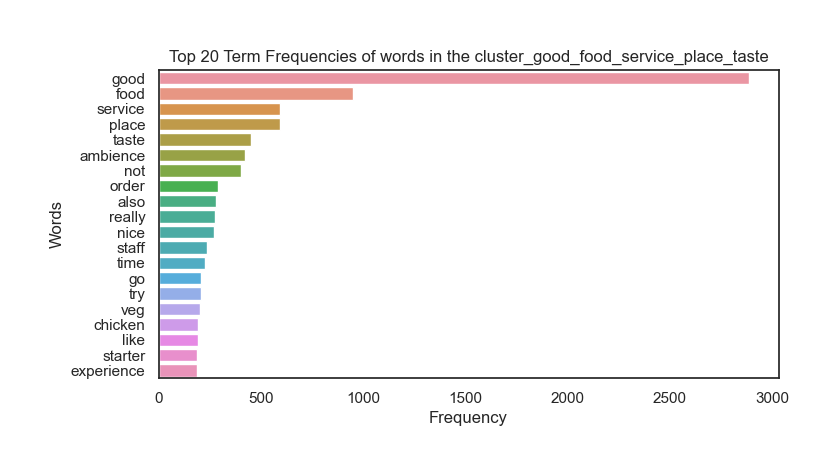

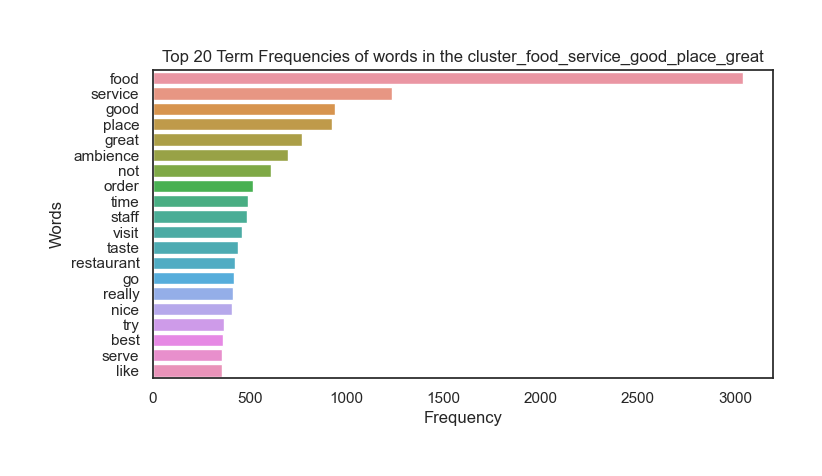

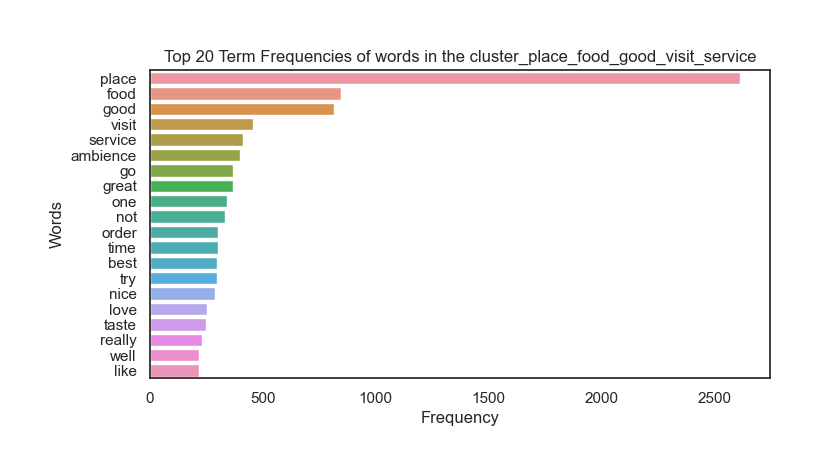

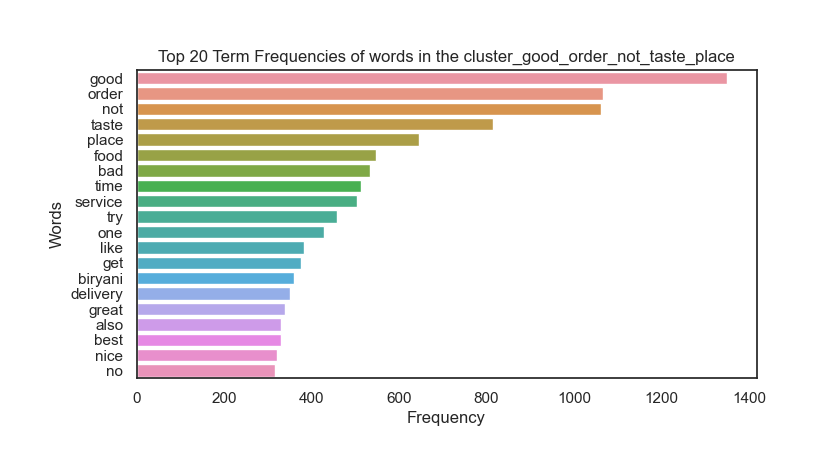

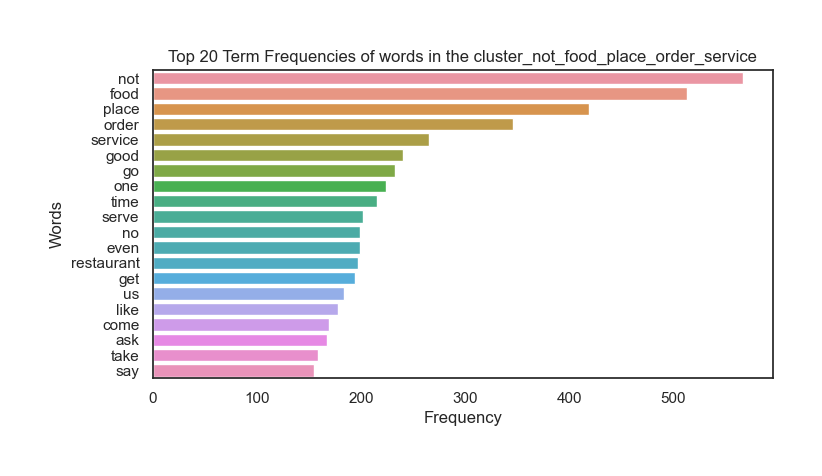

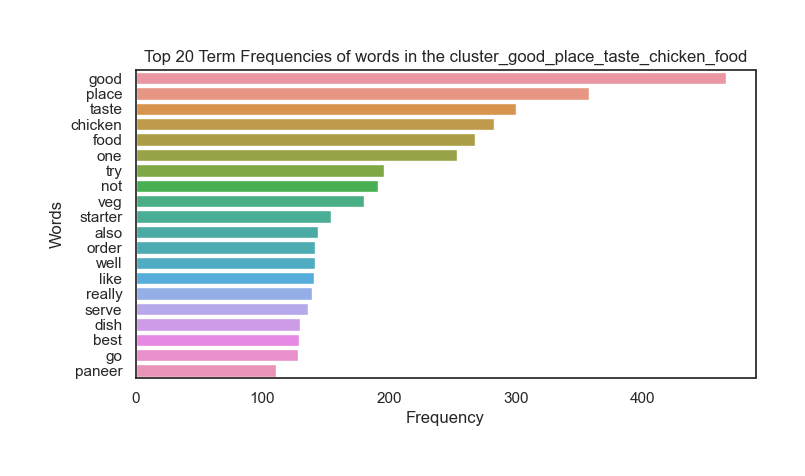

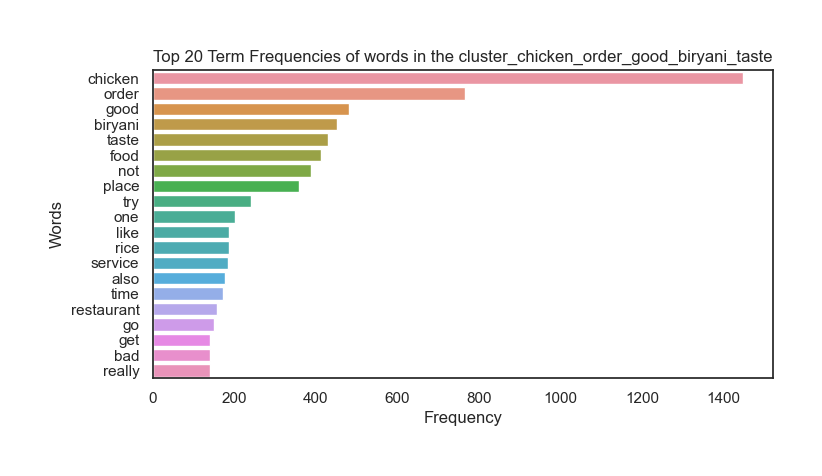

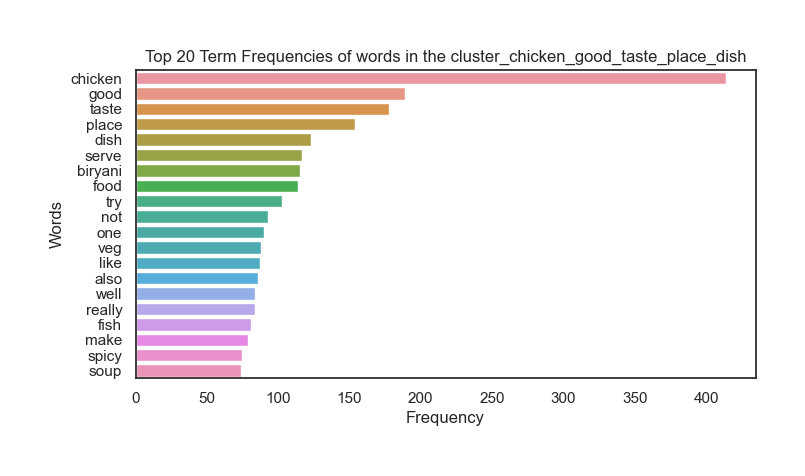

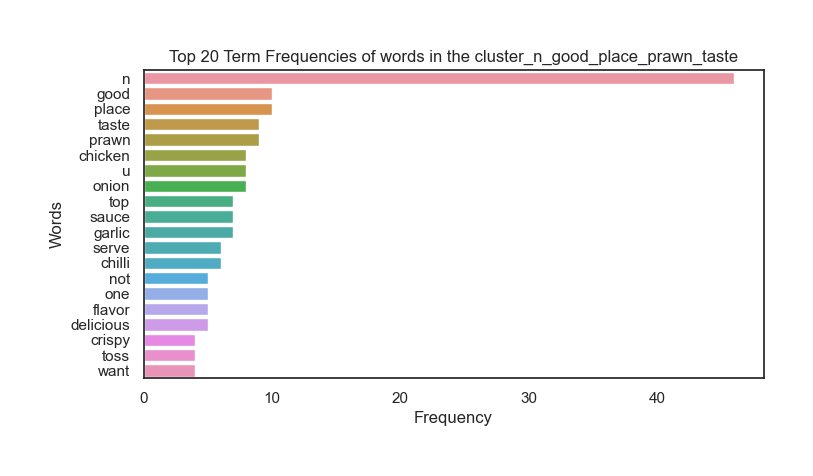

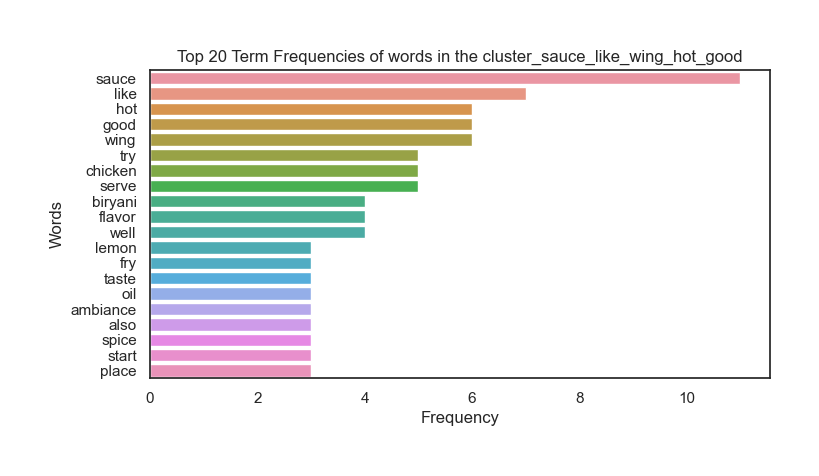

In [89]:
cluster_tuples = [
    (cluster_good_food_service_place_taste, 'cluster_good_food_service_place_taste'),
    (cluster_food_service_good_place_great, 'cluster_food_service_good_place_great'),
    (cluster_place_food_good_visit_service, 'cluster_place_food_good_visit_service'),
    (cluster_good_order_not_taste_place, 'cluster_good_order_not_taste_place'),
    (cluster_not_food_place_order_service, 'cluster_not_food_place_order_service'),
    (cluster_good_place_taste_chicken_food, 'cluster_good_place_taste_chicken_food'),
    (cluster_chicken_order_good_biryani_taste, 'cluster_chicken_order_good_biryani_taste'),
    (cluster_chicken_good_taste_place_dish, 'cluster_chicken_good_taste_place_dish'),
    (cluster_n_good_place_prawn_taste, 'cluster_n_good_place_prawn_taste'),
    (cluster_sauce_like_wing_hot_good, 'cluster_sauce_like_wing_hot_good')
]


for cluster in cluster_tuples:
    bow_matrix = bow_vectorizer.fit_transform(cluster[0]["clean_review_lemmatized"]).toarray()
    cluster[0]["review_bow_vector"] = bow_matrix.tolist()
    bow_word_list = bow_vectorizer.get_feature_names_out()

    #BOW visualization
    reviews_bow_df = word_freq_calculator(bow_matrix,bow_word_list)

    #Instancing WordCloud
    wc = WordCloud(background_color="white",max_words=120, width = 220,height = 220, color_func=lambda *args, **kwargs: (0,0,0))

    plot_term_frequency(reviews_bow_df, 20,f"words in the {cluster[1]}", show=True, figsize=(8,4))

In [90]:
# Dictionary to store results
cluster_cuisine_counts = {}

# Process each cluster
for cluster, name in cluster_tuples:
    all_cuisines = cluster['Cuisines'].dropna().str.split(', ')
    flat_cuisines = [cuisine for sublist in all_cuisines for cuisine in sublist]
    cuisine_counts = Counter(flat_cuisines)
    cuisine_counts_df = pd.DataFrame(cuisine_counts.items(), columns=['Cuisine', 'Count']).sort_values(by='Count', ascending=False)
    
    # Reset index and store in dictionary
    cluster_cuisine_counts[name] = cuisine_counts_df.reset_index(drop=True)

# Display results for all clusters
for name, df in cluster_cuisine_counts.items():
    print(f"\nMost Common Cuisines for {name}:\n")
    print(df.head(5))  # Display top 5 cuisines


Most Common Cuisines for cluster_good_food_service_place_taste:

        Cuisine  Count
0  North Indian    751
1       Chinese    501
2   Continental    317
3         Asian    195
4       Italian    189

Most Common Cuisines for cluster_food_service_good_place_great:

        Cuisine  Count
0  North Indian   1423
1       Chinese    911
2   Continental    684
3         Asian    484
4       Italian    460

Most Common Cuisines for cluster_place_food_good_visit_service:

        Cuisine  Count
0  North Indian    664
1       Chinese    380
2   Continental    359
3       Italian    261
4         Asian    191

Most Common Cuisines for cluster_good_order_not_taste_place:

        Cuisine  Count
0  North Indian   2437
1       Chinese   1757
2       Biryani    858
3      Desserts    821
4     Fast Food    765

Most Common Cuisines for cluster_not_food_place_order_service:

        Cuisine  Count
0  North Indian    178
1       Chinese    113
2   Continental     78
3       Italian     71
4      

### Food based clustering
Since the clusters did not show much distinction in terms of cuisine types, we will try a different approach. We will create a new column in the reviews dataset containing only words that represent foods or drinks, and use this column to generate the clusters.

In [91]:
# Create a column with only food-related words
reviews_["foods"] = reviews_["clean_review"].apply(
    lambda review: " ".join([word for word in review.split() if word in foods_and_drinks])
)

In [92]:
# Vectorise using BOW
bow_vectorizer = CountVectorizer(ngram_range=(1,1), token_pattern=r"(?u)\b\w+\b")
reviews_bow_td_matrix = bow_vectorizer.fit_transform(reviews_["foods"]).toarray()
reviews_["bow_vector_foods_only"] = reviews_bow_td_matrix.tolist()

#Converting to an array
reviews_bow_td_matrix = np.array([[component for component in doc] for doc in reviews_["bow_vector_foods_only"]])

inertia_plotter(reviews_bow_td_matrix,30)

100%|██████████| 29/29 [00:52<00:00,  1.80s/it]


In [93]:
#Creating the clusters
#We will choose k=9, based on the plot
kmeans_bow = KMeans(n_clusters=9, random_state=42).fit(reviews_bow_td_matrix)
reviews_["kmeans_bow_clusters_foods_only"] = kmeans_bow.labels_.tolist()

#Renaming the clusters
reviews_ = cluster_namer_bow(reviews_, "kmeans_bow_clusters_foods_only", 'foods', 3)

In [94]:
#Plotting the clusters
plotter_3d_cluster(reviews_,"bow_vector_foods_only","kmeans_bow_clusters_foods_only", column_to_name_on_namer='foods')

In [95]:
clusters_dict= filter_clusters(reviews_, cluster_column_name='kmeans_bow_clusters_foods_only')
clusters_dict.keys()

dict_keys(['cluster_rice_biryani_pizza', 'cluster_biryani_chicken_mutton', 'cluster_paneer_butter_tikka', 'cluster_chicken_rice_biryani', 'cluster_ice_chocolate_fruit', 'cluster_cake_chocolate_cheese', 'cluster_coffee_cafe_chocolate', 'cluster_chicken_biryani_fish'])

In [96]:
# Assuming `reviews_` is a pandas DataFrame
cluster_rice_biryani_pizza = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'rice_biryani_pizza']
cluster_biryani_chicken_mutton = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'biryani_chicken_mutton']
cluster_paneer_butter_tikka = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'paneer_butter_tikka']
cluster_chicken_rice_biryani = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'chicken_rice_biryani']
cluster_ice_chocolate_fruit = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'ice_chocolate_fruit']
cluster_cake_chocolate_cheese = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'cake_chocolate_cheese']
cluster_coffee_cafe_chocolate = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'coffee_cafe_chocolate']
cluster_chicken_biryani_fish = reviews_[reviews_['kmeans_bow_clusters_foods_only'] == 'chicken_biryani_fish']

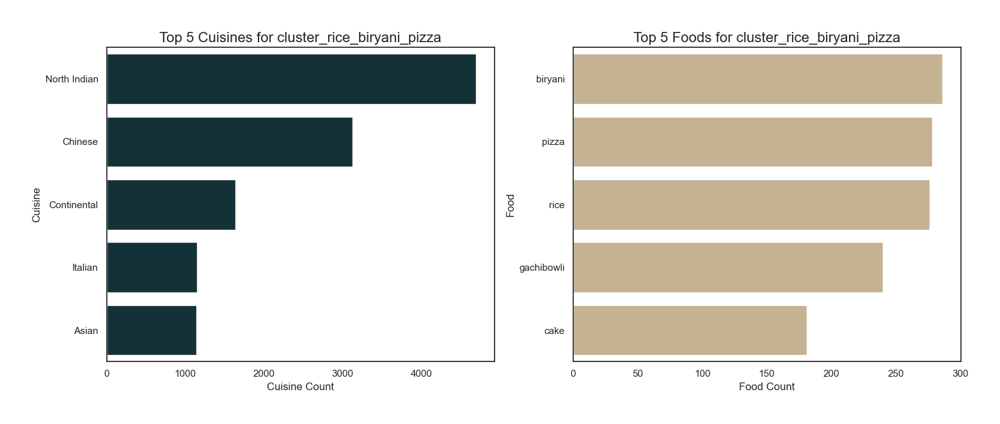

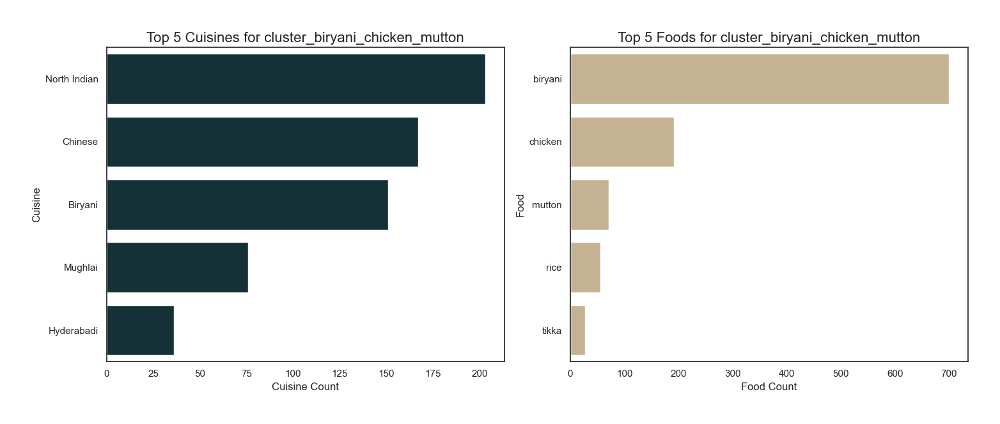

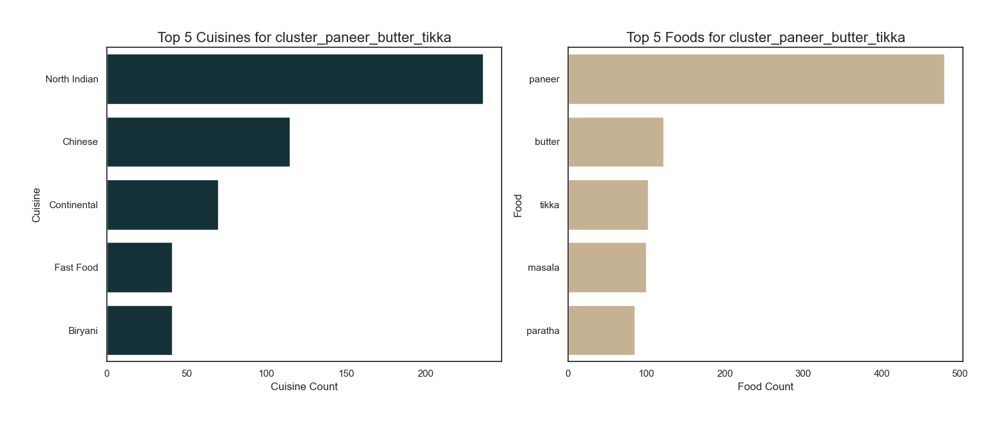

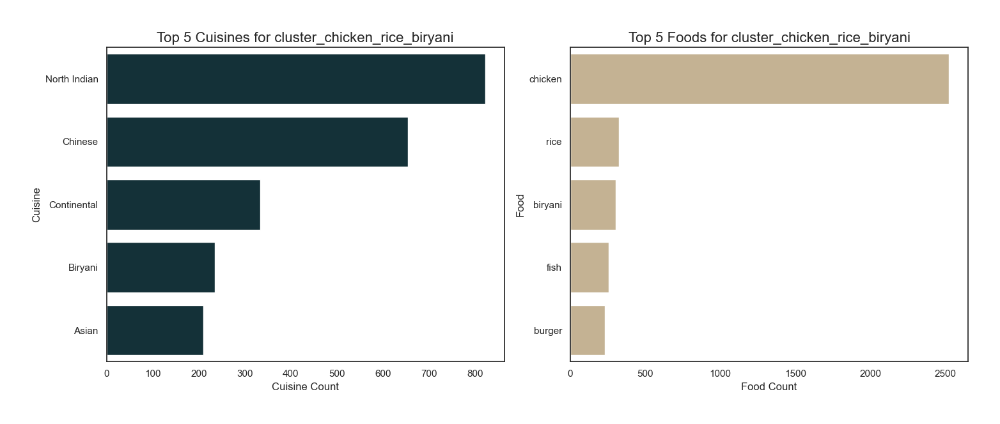

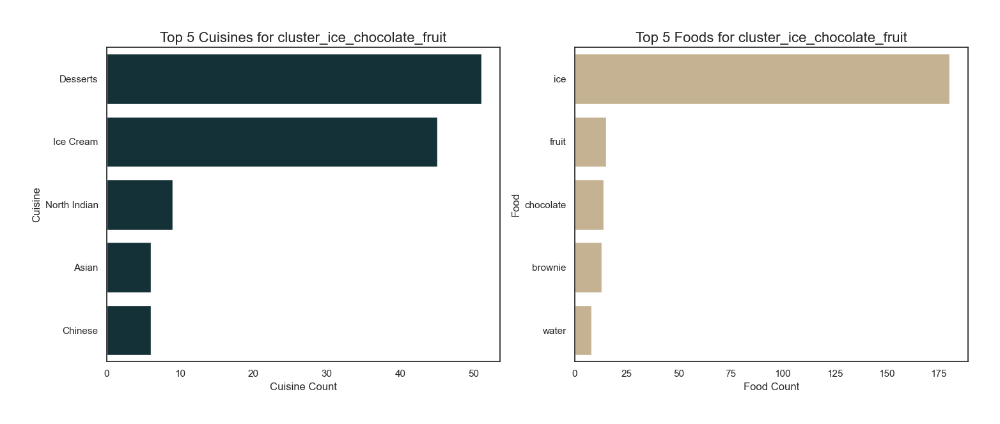

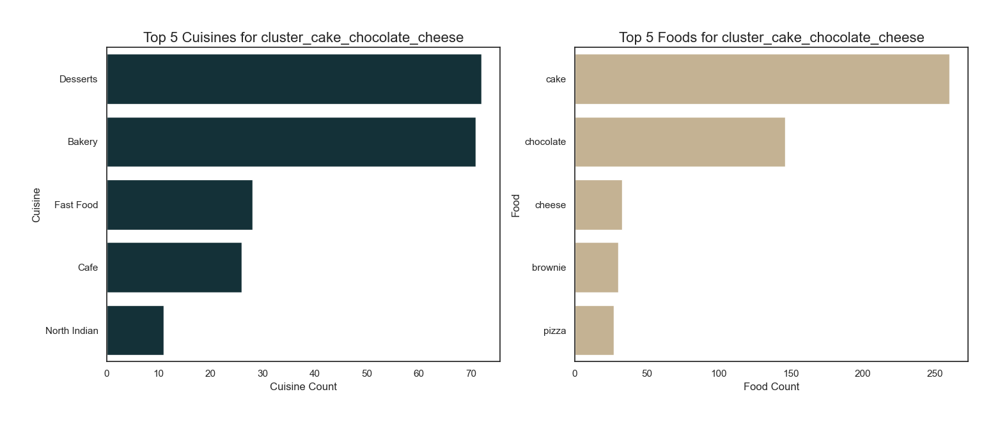

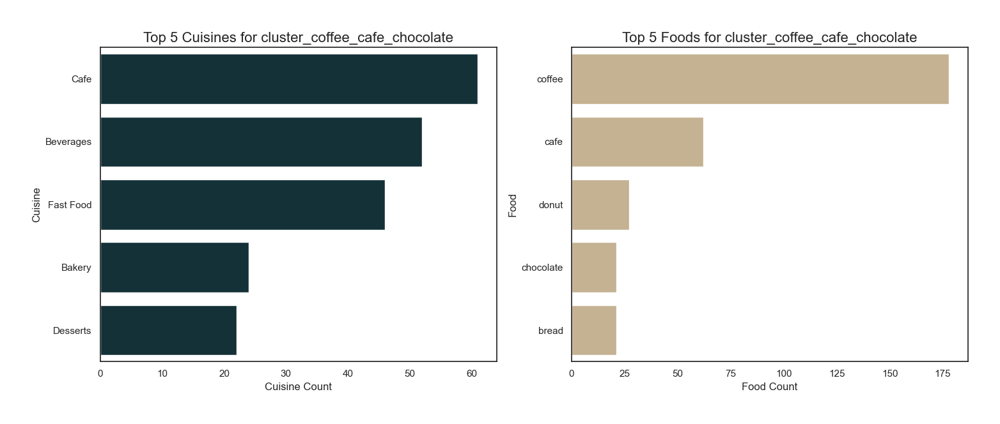

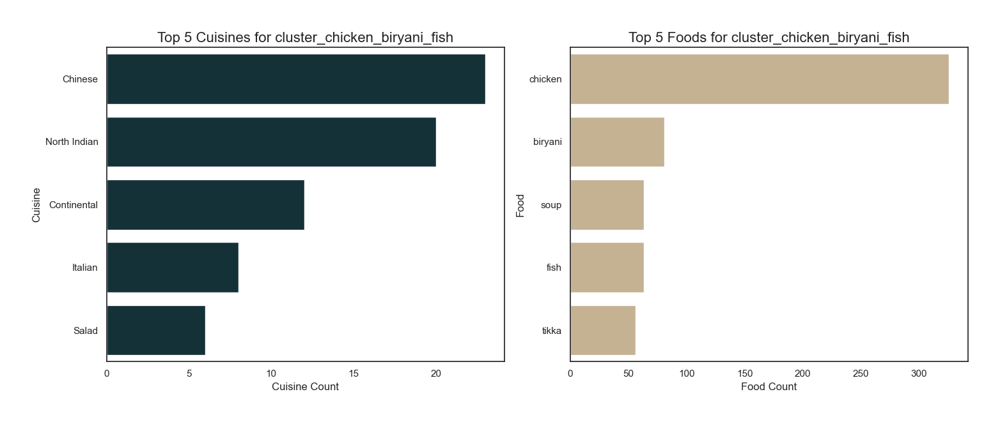

In [97]:
cluster_tuples=[(cluster_rice_biryani_pizza, 'cluster_rice_biryani_pizza'),
                (cluster_biryani_chicken_mutton, 'cluster_biryani_chicken_mutton'),
                (cluster_paneer_butter_tikka, 'cluster_paneer_butter_tikka'),
                (cluster_chicken_rice_biryani, 'cluster_chicken_rice_biryani'),    
                (cluster_ice_chocolate_fruit, 'cluster_ice_chocolate_fruit'),    
                (cluster_cake_chocolate_cheese, 'cluster_cake_chocolate_cheese'),   
                (cluster_coffee_cafe_chocolate, 'cluster_coffee_cafe_chocolate'),    
                (cluster_chicken_biryani_fish, 'cluster_chicken_biryani_fish')]

# Dictionary to store results
cluster_cuisine_counts = {}

# Process each cluster
for cluster, name in cluster_tuples:
    # Count the most common cuisines
    all_cuisines = cluster['Cuisines'].dropna().str.split(', ')
    flat_cuisines = [cuisine for sublist in all_cuisines for cuisine in sublist]
    cuisine_counts = Counter(flat_cuisines)
    cuisine_counts_df = pd.DataFrame(cuisine_counts.items(), columns=['Cuisines', 'Count']).sort_values(by='Count', ascending=False)
    
    # Extract food-related words from the reviews
    all_reviews = cluster['clean_review_lemmatized'].dropna().str.split(' ')
    flat_reviews = [word for sublist in all_reviews for word in sublist]
    food_mentions = [word for word in flat_reviews if word in foods_and_drinks]
    food_counts = Counter(food_mentions)
    food_counts_df = pd.DataFrame(food_counts.items(), columns=['Food', 'Count']).sort_values(by='Count', ascending=False)
    
    # Reset index and store in dictionary
    cluster_cuisine_counts[name] = {'Cuisines': cuisine_counts_df.reset_index(drop=True),
                                    'Foods': food_counts_df.reset_index(drop=True)}
    
    # Create subplots for the top 5 cuisines and foods
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot for Cuisines 
    top_cuisines = cuisine_counts_df.head(5)
    sns.barplot(data=top_cuisines, x='Count', y='Cuisines', color='#0E343E', orient='h', ax=axes[0])
    axes[0].set_title(f"Top 5 Cuisines for {name}", fontsize=16)
    axes[0].set_xlabel('Cuisine Count', fontsize=12)
    axes[0].set_ylabel('Cuisine', fontsize=12)
    
    # Plot for Foods
    top_foods = food_counts_df.head(5)
    sns.barplot(data=top_foods, x='Count', y='Food', color='#ccb48b', orient='h', ax=axes[1])
    axes[1].set_title(f"Top 5 Foods for {name}", fontsize=16)
    axes[1].set_xlabel('Food Count', fontsize=12)
    axes[1].set_ylabel('Food', fontsize=12)
    
    plt.tight_layout()
    plt.show()

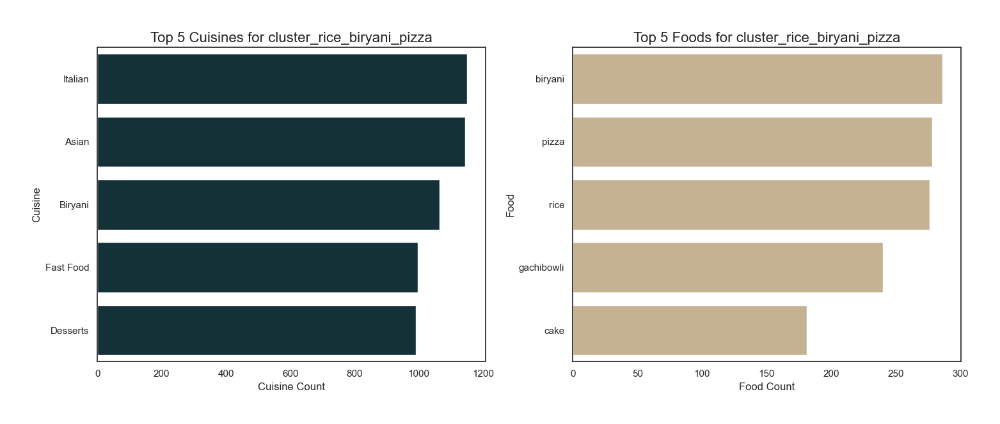

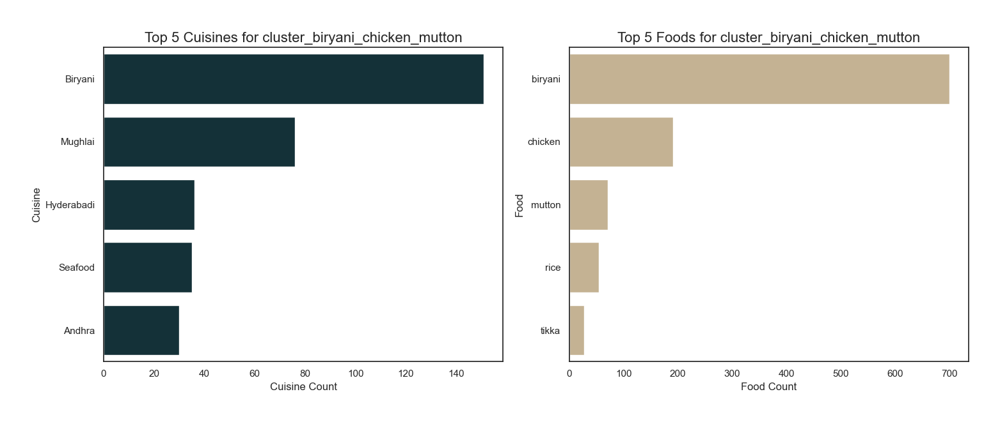

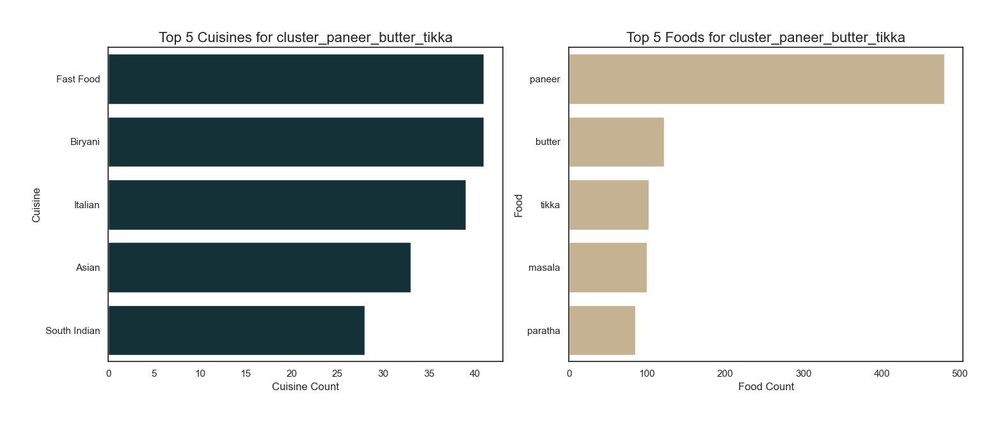

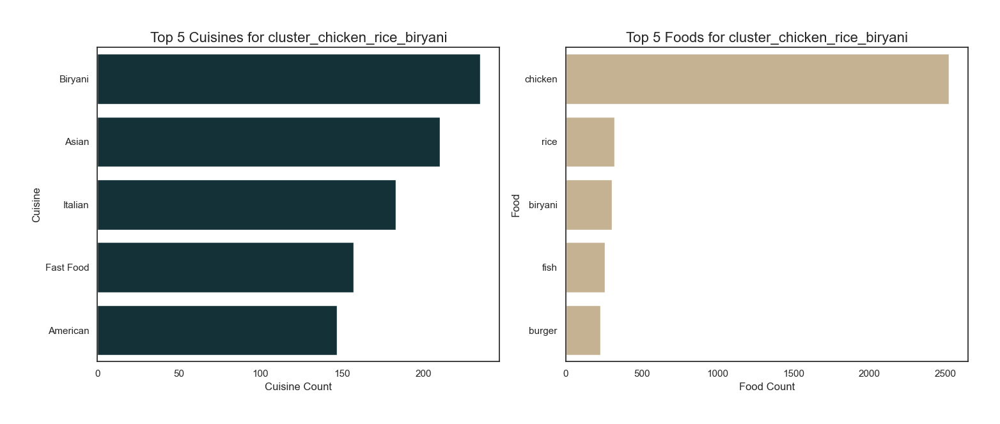

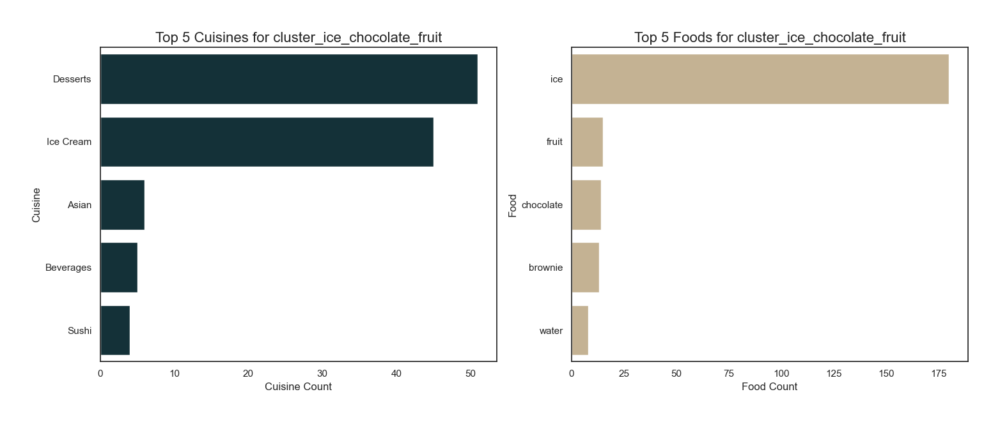

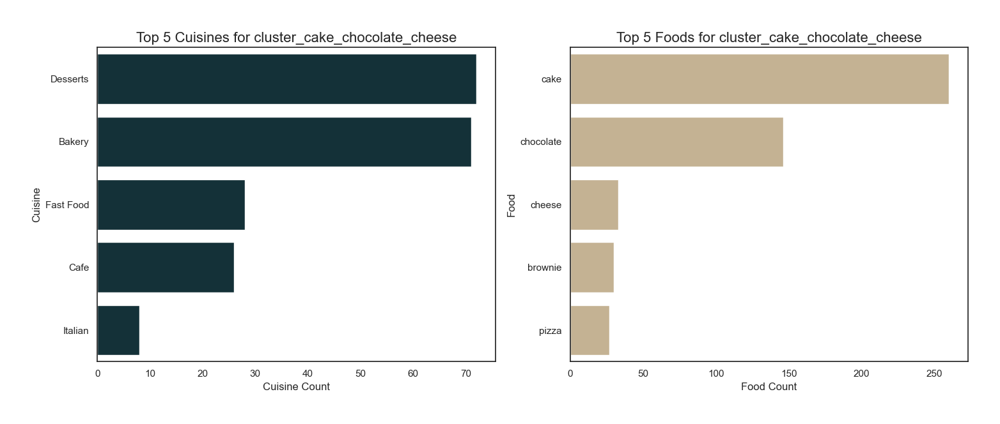

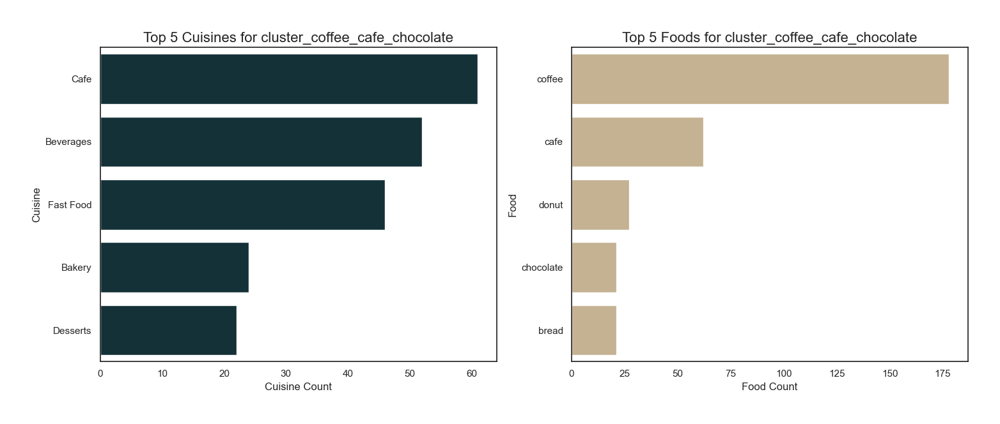

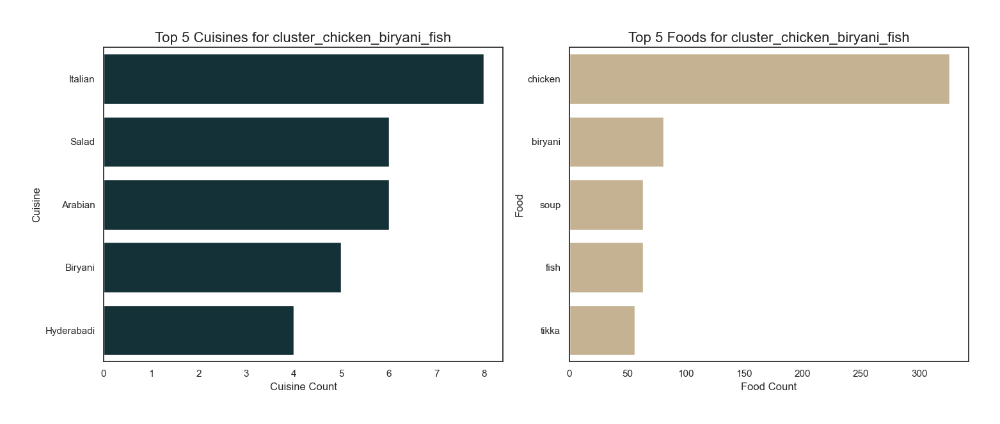

In [98]:
# Dictionary to store results
cluster_cuisine_counts = {}

# List of cuisines to exclude
exclude_cuisines = ['North Indian', 'Chinese', 'Continental']

# Process each cluster
for cluster, name in cluster_tuples:
    # Count the most common cuisines
    all_cuisines = cluster['Cuisines'].dropna().str.split(', ')
    flat_cuisines = [cuisine for sublist in all_cuisines for cuisine in sublist if cuisine not in exclude_cuisines]
    cuisine_counts = Counter(flat_cuisines)
    cuisine_counts_df = pd.DataFrame(cuisine_counts.items(), columns=['Cuisines', 'Count']).sort_values(by='Count', ascending=False)
    
    # Extract food-related words from the reviews
    all_reviews = cluster['clean_review_lemmatized'].dropna().str.split(' ')
    flat_reviews = [word for sublist in all_reviews for word in sublist]
    food_mentions = [word for word in flat_reviews if word in foods_and_drinks]
    food_counts = Counter(food_mentions)
    food_counts_df = pd.DataFrame(food_counts.items(), columns=['Food', 'Count']).sort_values(by='Count', ascending=False)
    
    # Reset index and store in dictionary
    cluster_cuisine_counts[name] = {'Cuisines': cuisine_counts_df.reset_index(drop=True),
                                    'Foods': food_counts_df.reset_index(drop=True)}
    
    # Create subplots for the top 5 cuisines and foods
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot for Cuisines with custom color
    top_cuisines = cuisine_counts_df.head(5)
    sns.barplot(data=top_cuisines, x='Count', y='Cuisines', color='#0E343E', orient='h', ax=axes[0])
    axes[0].set_title(f"Top 5 Cuisines for {name}", fontsize=16)
    axes[0].set_xlabel('Cuisine Count', fontsize=12)
    axes[0].set_ylabel('Cuisine', fontsize=12)
    
    # Plot for Foods with custom color
    top_foods = food_counts_df.head(5)
    sns.barplot(data=top_foods, x='Count', y='Food', color='#ccb48b', orient='h', ax=axes[1])
    axes[1].set_title(f"Top 5 Foods for {name}", fontsize=16)
    axes[1].set_xlabel('Food Count', fontsize=12)
    axes[1].set_ylabel('Food', fontsize=12)
    
    plt.tight_layout()
    plt.show()


### 5.3 DBSCAN
Let's repeat the same steps for DBSCAN.

In [99]:
hdbscan = HDBSCAN(min_cluster_size=40).fit(reviews_bow_td_matrix)
reviews_["hdbscan_bow_clusters"] = hdbscan.labels_.tolist()

print(set(hdbscan.labels_))

print(silhouette_score(reviews_bow_td_matrix, hdbscan.labels_))

{0, 1, 2, 3, 4, 5, 6, 7, 8, -1}
0.29596448543005477


In [100]:
#Renaming the clusters
reviews_ = cluster_namer_bow(reviews_, "hdbscan_bow_clusters", 'foods', 3)

In [101]:
plotter_3d_cluster(reviews_, "bow_vector_foods_only", "hdbscan_bow_clusters", 'foods')

In [102]:
# Creating the cluster variables
clusters_dict = filter_clusters(reviews_, cluster_column_name='hdbscan_bow_clusters')

clusters_dict.keys()

dict_keys(['cluster_chill_biryani_mojito', 'cluster_paneer_burger_beer', 'cluster_chicken_biryani_rice', 'cluster_biryani_rice_mutton', 'cluster_biryani_chicken_rice', 'cluster_chicken_biryani_tikka', 'cluster_chicken_rice_tandoori', 'cluster_gachibowli_jam_ice', 'cluster_pizza_ice_milkshake', 'cluster_ice_chocolate_rice'])

In [103]:
cluster_chill_biryani_mojito = reviews_[reviews_['hdbscan_bow_clusters'] == 'chill_biryani_mojito']
cluster_paneer_burger_beer = reviews_[reviews_['hdbscan_bow_clusters'] == 'paneer_burger_beer']
cluster_chicken_biryani_rice = reviews_[reviews_['hdbscan_bow_clusters'] == 'chicken_biryani_rice']
cluster_biryani_rice_mutton = reviews_[reviews_['hdbscan_bow_clusters'] == 'biryani_rice_mutton']
cluster_biryani_chicken_rice = reviews_[reviews_['hdbscan_bow_clusters'] == 'biryani_chicken_rice']
cluster_chicken_biryani_tikka = reviews_[reviews_['hdbscan_bow_clusters'] == 'chicken_biryani_tikka']
cluster_chicken_rice_tandoori = reviews_[reviews_['hdbscan_bow_clusters'] == 'chicken_rice_tandoori']
cluster_gachibowli_jam_ice = reviews_[reviews_['hdbscan_bow_clusters'] == 'gachibowli_jam_ice']
cluster_pizza_ice_milkshake = reviews_[reviews_['hdbscan_bow_clusters'] == 'pizza_ice_milkshake']
cluster_ice_chocolate_rice = reviews_[reviews_['hdbscan_bow_clusters'] == 'ice_chocolate_rice']


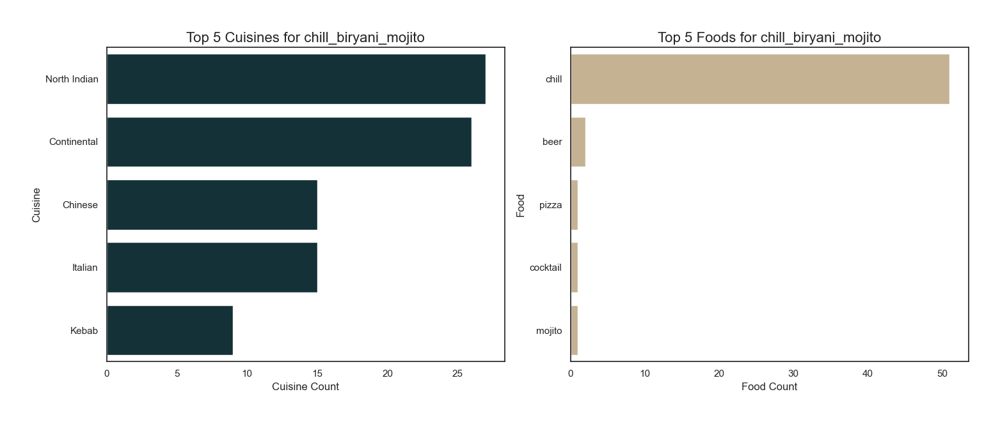

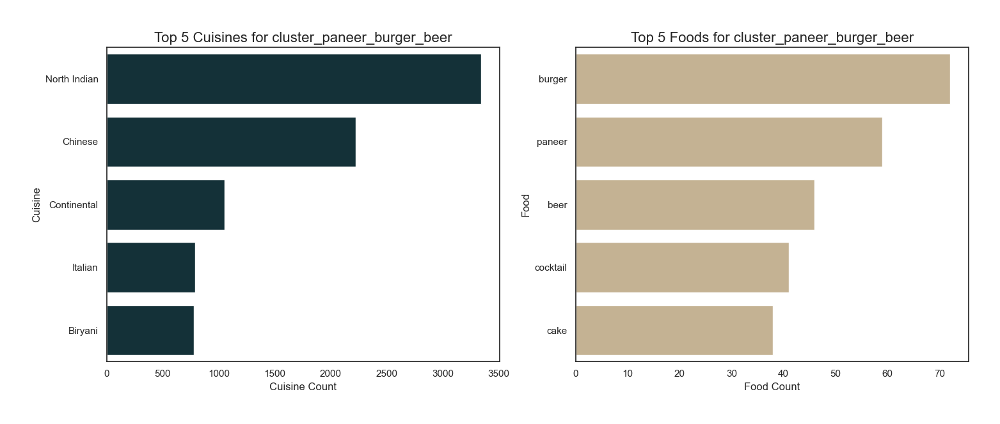

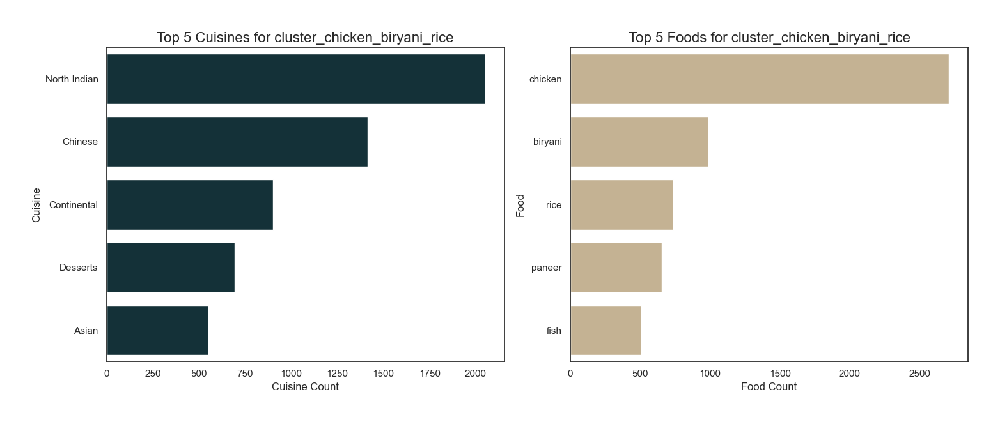

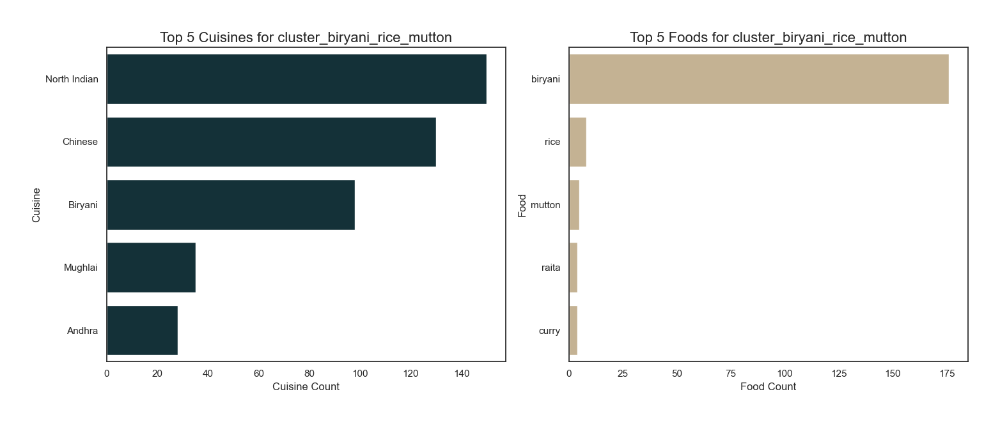

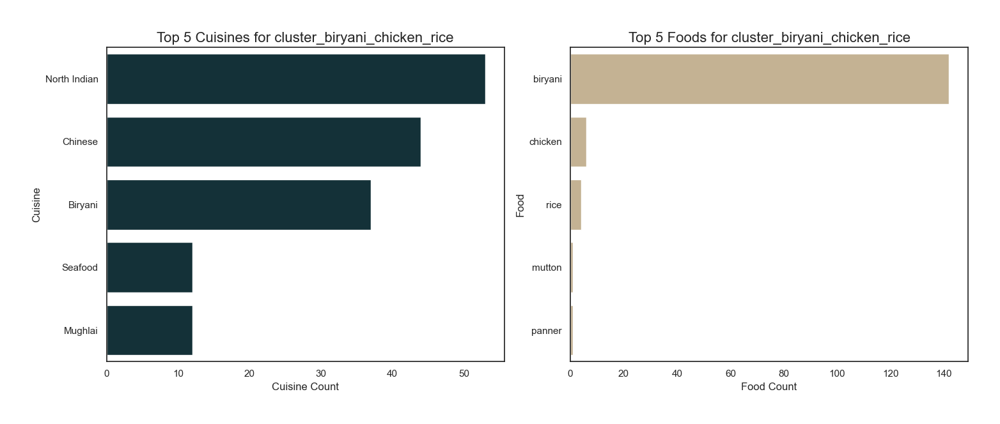

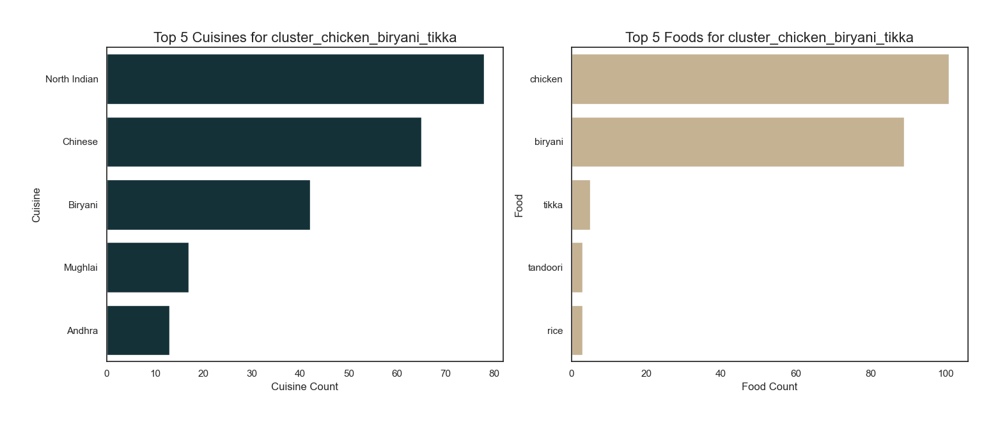

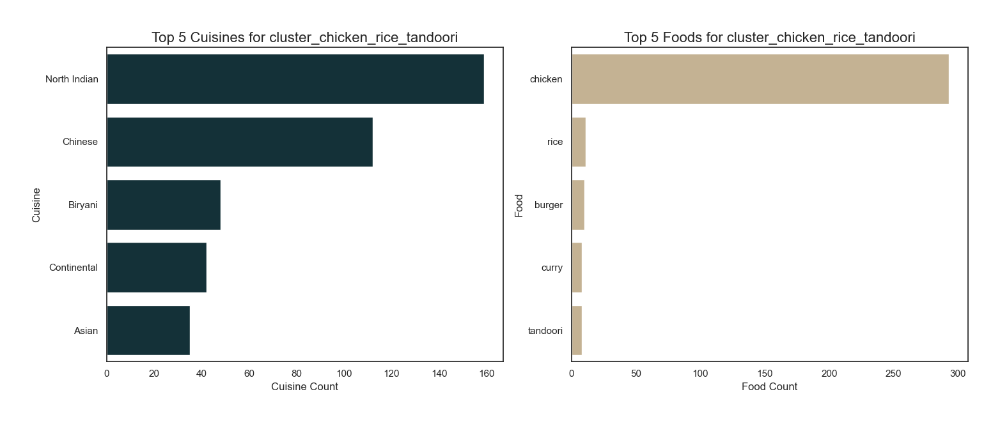

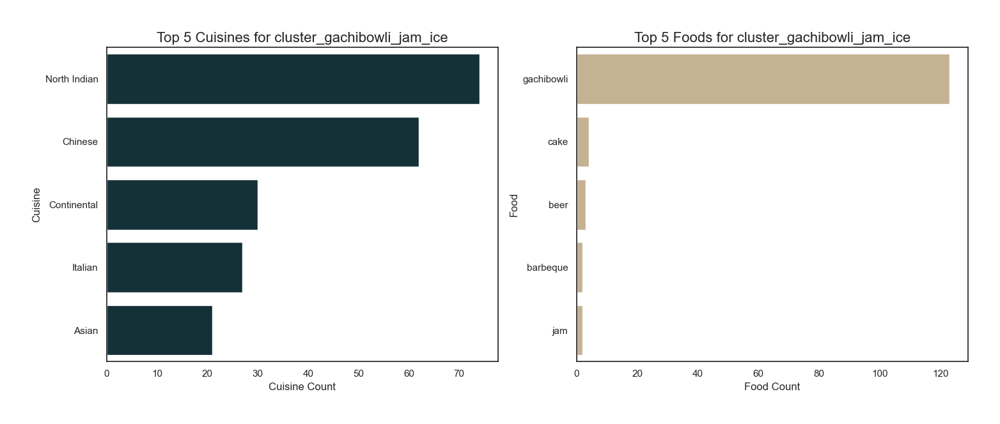

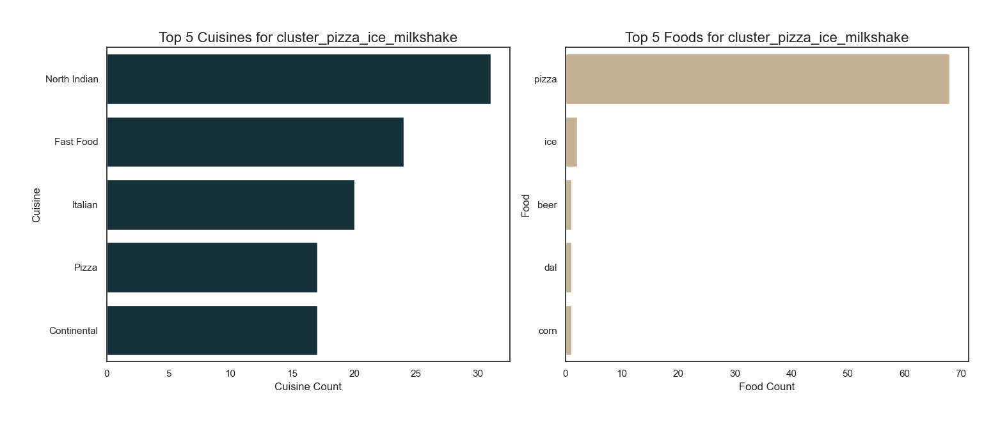

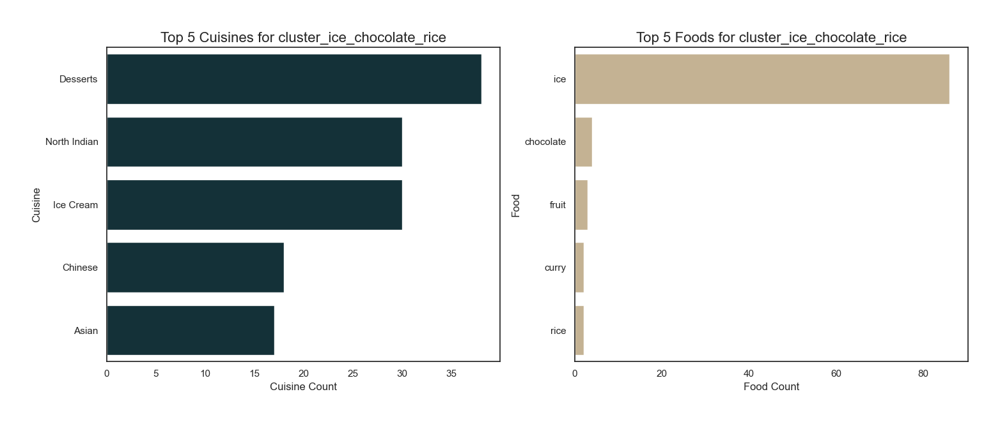

In [104]:
cluster_tuples=[    (cluster_chill_biryani_mojito, 'chill_biryani_mojito'),    (cluster_paneer_burger_beer, 'cluster_paneer_burger_beer'),    (cluster_chicken_biryani_rice, 'cluster_chicken_biryani_rice'),    (cluster_biryani_rice_mutton, 'cluster_biryani_rice_mutton'),    (cluster_biryani_chicken_rice, 'cluster_biryani_chicken_rice'),    (cluster_chicken_biryani_tikka, 'cluster_chicken_biryani_tikka'),    (cluster_chicken_rice_tandoori, 'cluster_chicken_rice_tandoori'),    (cluster_gachibowli_jam_ice, 'cluster_gachibowli_jam_ice'),    (cluster_pizza_ice_milkshake, 'cluster_pizza_ice_milkshake'),    (cluster_ice_chocolate_rice, 'cluster_ice_chocolate_rice')]
    

# Dictionary to store results
cluster_cuisine_counts = {}

# Process each cluster
for cluster, name in cluster_tuples:
    # Count the most common cuisines
    all_cuisines = cluster['Cuisines'].dropna().str.split(', ')
    flat_cuisines = [cuisine for sublist in all_cuisines for cuisine in sublist]
    cuisine_counts = Counter(flat_cuisines)
    cuisine_counts_df = pd.DataFrame(cuisine_counts.items(), columns=['Cuisines', 'Count']).sort_values(by='Count', ascending=False)
    
    # Extract food-related words from the reviews
    all_reviews = cluster['clean_review_lemmatized'].dropna().str.split(' ')
    flat_reviews = [word for sublist in all_reviews for word in sublist]
    food_mentions = [word for word in flat_reviews if word in foods_and_drinks]
    food_counts = Counter(food_mentions)
    food_counts_df = pd.DataFrame(food_counts.items(), columns=['Food', 'Count']).sort_values(by='Count', ascending=False)
    
    # Reset index and store in dictionary
    cluster_cuisine_counts[name] = {'Cuisines': cuisine_counts_df.reset_index(drop=True),
                                    'Foods': food_counts_df.reset_index(drop=True)}
    
    # Create subplots for the top 5 cuisines and foods
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot for Cuisines 
    top_cuisines = cuisine_counts_df.head(5)
    sns.barplot(data=top_cuisines, x='Count', y='Cuisines', color='#0E343E', orient='h', ax=axes[0])
    axes[0].set_title(f"Top 5 Cuisines for {name}", fontsize=16)
    axes[0].set_xlabel('Cuisine Count', fontsize=12)
    axes[0].set_ylabel('Cuisine', fontsize=12)
    
    # Plot for Foods
    top_foods = food_counts_df.head(5)
    sns.barplot(data=top_foods, x='Count', y='Food', color='#ccb48b', orient='h', ax=axes[1])
    axes[1].set_title(f"Top 5 Foods for {name}", fontsize=16)
    axes[1].set_xlabel('Food Count', fontsize=12)
    axes[1].set_ylabel('Food', fontsize=12)
    
    plt.tight_layout()
    plt.show()

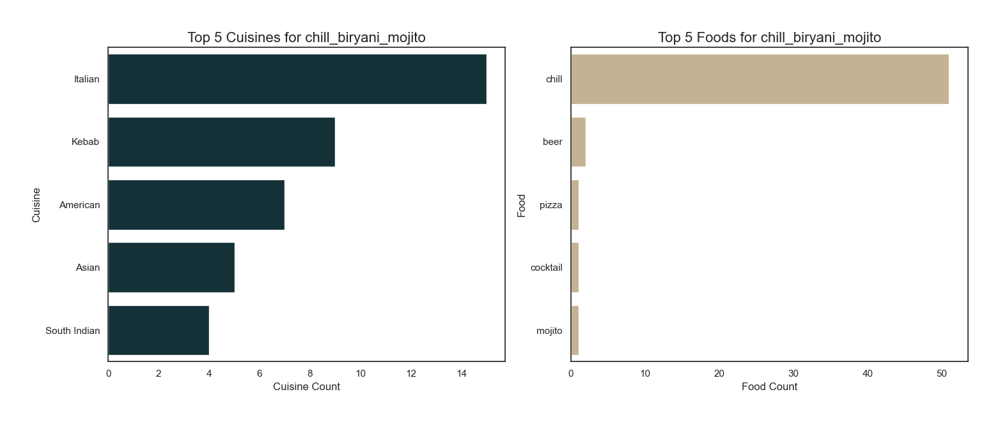

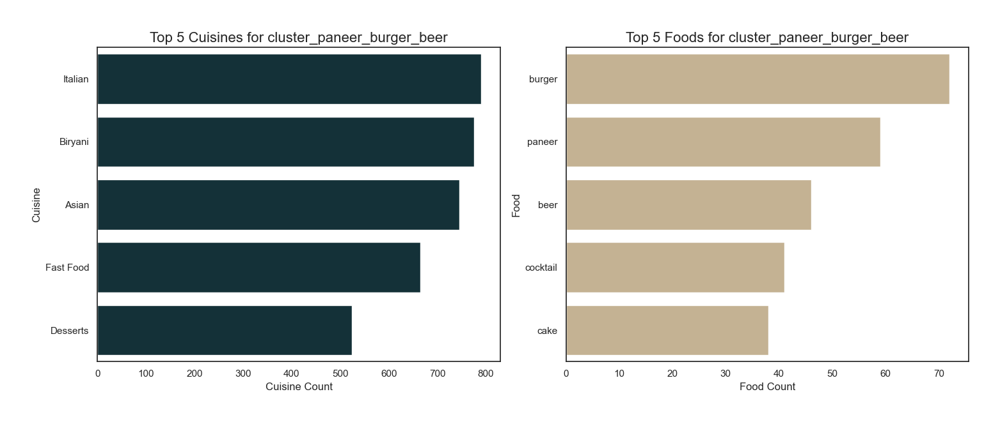

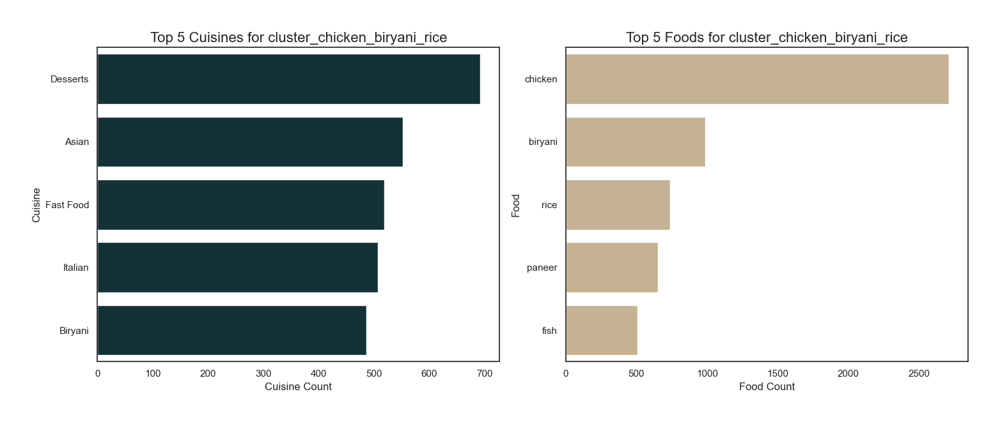

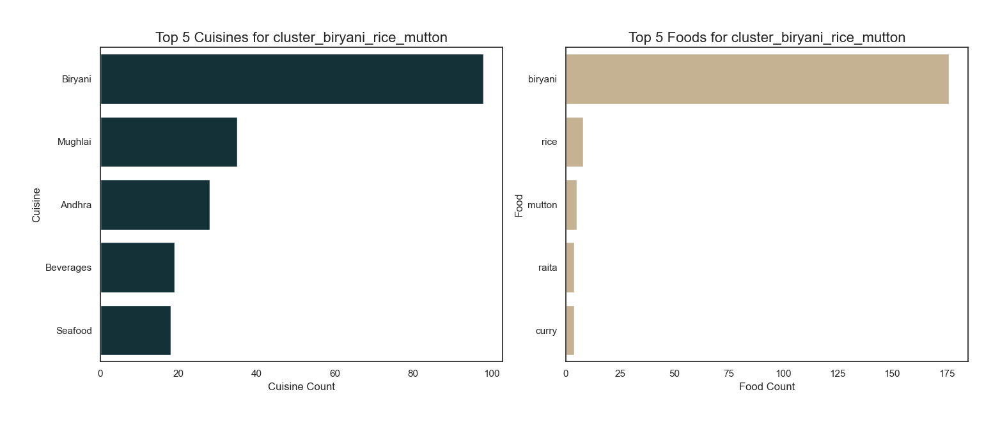

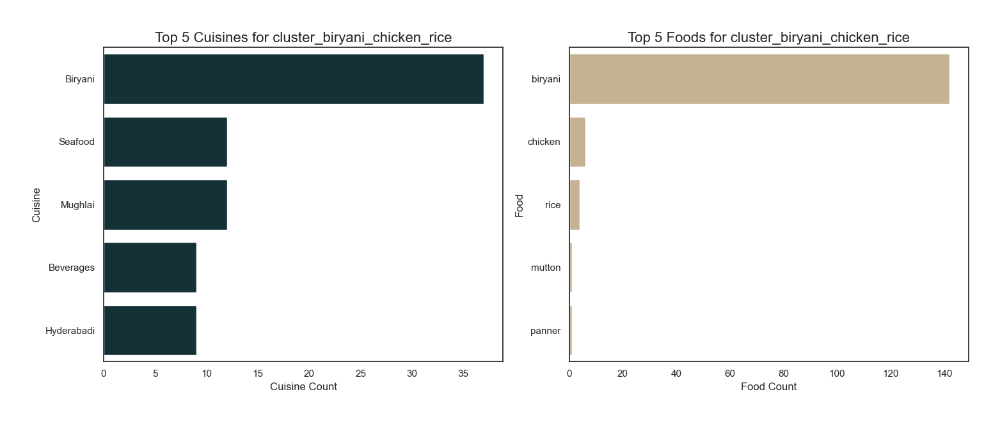

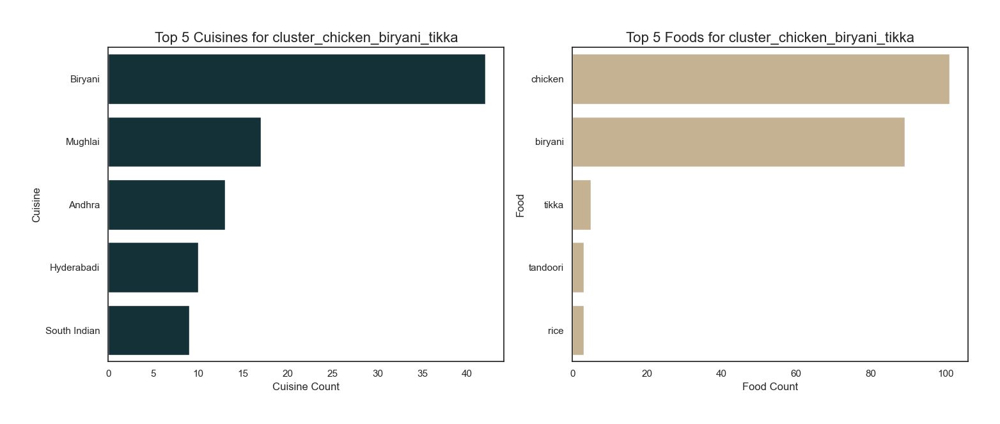

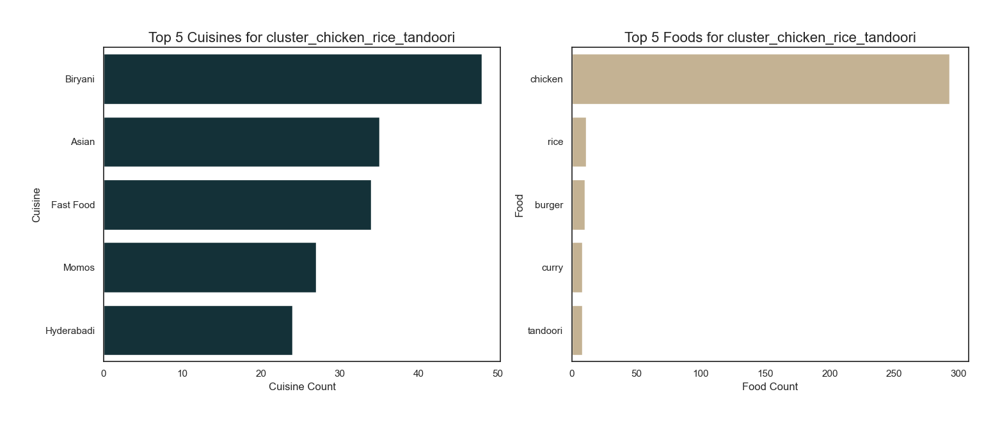

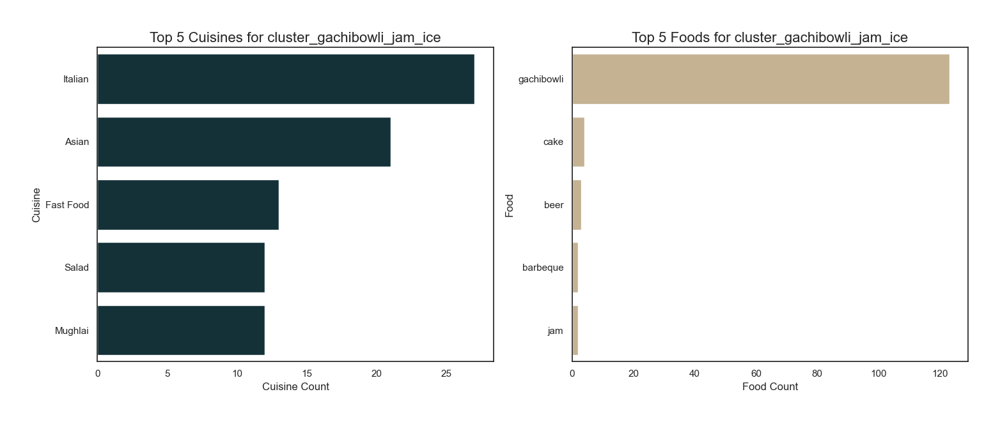

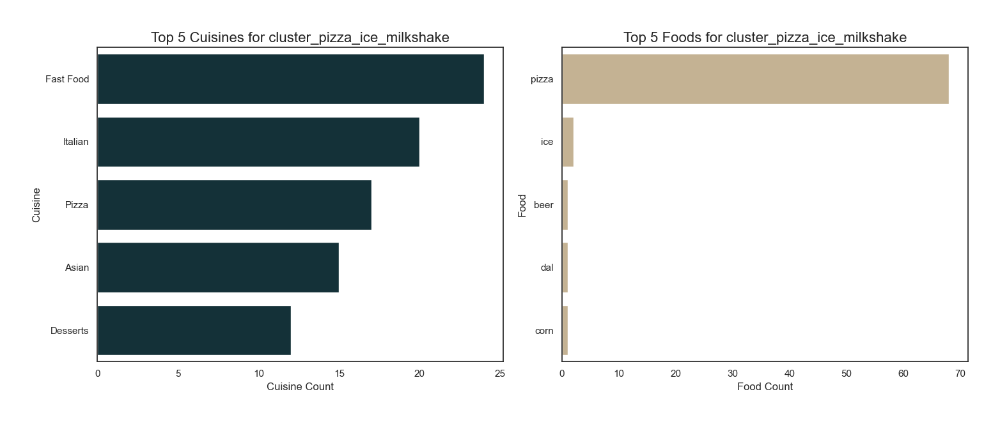

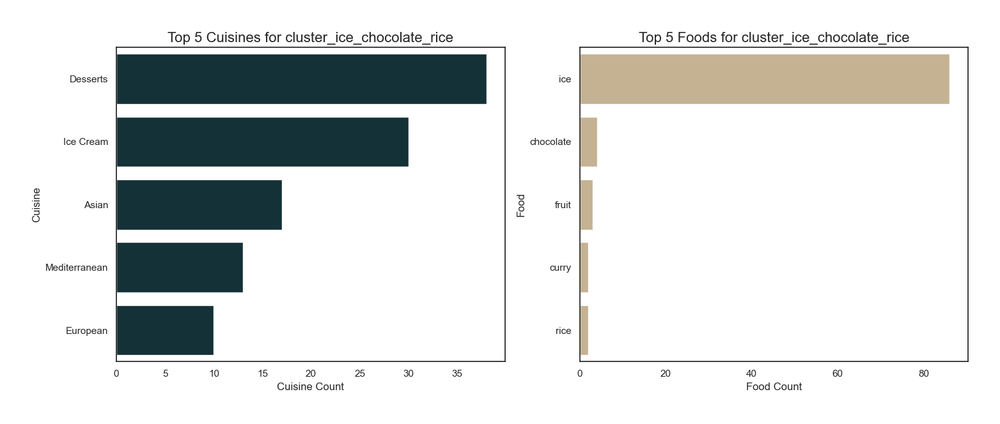

In [105]:
# Dictionary to store results
cluster_cuisine_counts = {}

# List of cuisines to exclude
exclude_cuisines = ['North Indian', 'Chinese', 'Continental']

# Process each cluster
for cluster, name in cluster_tuples:
    # Count the most common cuisines
    all_cuisines = cluster['Cuisines'].dropna().str.split(', ')
    flat_cuisines = [cuisine for sublist in all_cuisines for cuisine in sublist if cuisine not in exclude_cuisines]
    cuisine_counts = Counter(flat_cuisines)
    cuisine_counts_df = pd.DataFrame(cuisine_counts.items(), columns=['Cuisines', 'Count']).sort_values(by='Count', ascending=False)
    
    # Extract food-related words from the reviews
    all_reviews = cluster['clean_review_lemmatized'].dropna().str.split(' ')
    flat_reviews = [word for sublist in all_reviews for word in sublist]
    food_mentions = [word for word in flat_reviews if word in foods_and_drinks]
    food_counts = Counter(food_mentions)
    food_counts_df = pd.DataFrame(food_counts.items(), columns=['Food', 'Count']).sort_values(by='Count', ascending=False)
    
    # Reset index and store in dictionary
    cluster_cuisine_counts[name] = {'Cuisines': cuisine_counts_df.reset_index(drop=True),
                                    'Foods': food_counts_df.reset_index(drop=True)}
    
    # Create subplots for the top 5 cuisines and foods
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot for Cuisines with custom color
    top_cuisines = cuisine_counts_df.head(5)
    sns.barplot(data=top_cuisines, x='Count', y='Cuisines', color='#0E343E', orient='h', ax=axes[0])
    axes[0].set_title(f"Top 5 Cuisines for {name}", fontsize=16)
    axes[0].set_xlabel('Cuisine Count', fontsize=12)
    axes[0].set_ylabel('Cuisine', fontsize=12)
    
    # Plot for Foods with custom color
    top_foods = food_counts_df.head(5)
    sns.barplot(data=top_foods, x='Count', y='Food', color='#ccb48b', orient='h', ax=axes[1])
    axes[1].set_title(f"Top 5 Foods for {name}", fontsize=16)
    axes[1].set_xlabel('Food Count', fontsize=12)
    axes[1].set_ylabel('Food', fontsize=12)
    
    plt.tight_layout()
    plt.show()


<font color='#BFD72F' size=5>6. Topic Modelling (Information Requirement 3322)</font> <a class="anchor" id="P6"></a>
  
[Back to TOC](#toc)

<font size=5>6.1.1 Specific Data Preparation</font> <a class="anchor" id="P611"></a>

<i>To perform LSA with Sklearn, we will need the Bag of Words matrix generated from feature extraction (bow_matrix), as well has the reviews themselves. However, as to not overwrite the dataset, we will create a copy of it, named reviews_topic.</i>

In [188]:
reviews_topic= reviews_.copy()
bow_matrix_topic = bow_matrix.copy()

<font size=5>6.1.2 Model Implementation</font> <a class="anchor" id="P612"></a>

<i>To implement the LSA model, we will initially create for 20, 15 and 10 topics. The final number of topics will then be chosen given the evaluation of the model (6.1.3.).</i>

In [189]:
lsa = TruncatedSVD(n_components=15)
lsa_result = lsa.fit_transform(bow_matrix_topic)

# document - topic matrix, where 1st value is nr of docs, and 2nd value is nr of topics/dimensions (t)
print(lsa_result.shape, "\n\n")

# each row represents a document, and each column corresponds to a topic.
lsa_result[:3]

(9954, 15) 




array([[ 2.73038188, -1.12793829,  1.82115848,  0.55576736,  0.16292671,
         0.04941617, -0.29039782, -0.36191121,  0.04756915, -0.27168021,
         0.64085043,  0.19142465, -0.05936809, -0.57032476, -0.26118898],
       [ 2.27796466, -1.37422271,  2.24522922, -0.56542051,  0.28451992,
         0.13707874,  0.71657621,  0.97847749, -0.2186446 ,  0.07339706,
         0.24852214, -0.4257865 , -0.35982374,  0.28011068, -0.23846229],
       [ 1.25468081, -0.75903124, -0.47421845, -0.65387318,  0.35720484,
         0.65337554,  1.03960047,  0.30523293,  1.54973342, -0.20564544,
        -0.5269319 , -0.61519704,  0.43356889, -0.29936475,  0.39152072]])

<font size=5>6.1.3 Model Evaluation</font> <a class="anchor" id="P613"></a>

<i>In evaluation our model, we will verify the results of the document-topic and topic-words matrices, along with checking it with an actual review 983.

Discover the topic that contributes the most to the test document (iloc[983]) (i.e., whose weight is largest).</i>

In [190]:
## use an example! 
print(reviews_topic["clean_review"].iloc[983])
print("\n", lsa_result[983])


# output is the topic the example 983 has more weight
test_doc_topic = np.where(lsa_result[983] == lsa_result[983].max())[0][0]
print("\nTopic with highest weight: ", test_doc_topic)

i love treating myself to cream stone every once in a while it's the perfect treat i've tried almost all their flavors and i love every single one my favorite would be willy wonka i love chocolate i'm not fond of their waffles though but the ice creams are to die for definitely visit cream stone 

 [ 0.77921149  0.23806096 -0.52200589  0.38557076 -1.12273802  0.45068683
 -0.11062354  0.02927882  0.70244254 -0.22349407  0.59554845 -0.24888803
 -0.39045896 -0.17260297  0.04023253]

Topic with highest weight:  0


Topic 4 has more weight for the review number 983

Use the LSA results to discover the topic vectors of specific tokens (i.e., rows of the topic-word matrix).

<b> Interpretation:</b>
- Each row corresponds to a topic.
- Each column corresponds to a word (from the vocabulary).
- The values in the matrix are the weights (or importance) of each word for each topic.

In [191]:
# topic-word matrix, (nr_topics; nr_unique_words/features)
print("Number topics: {}, \nNumber features: {}\n".format(*lsa.components_.shape))

# example for 983th word in topic-word matrix, where each value in this matrix represents how important a word is to a topic.
print(lsa.components_[:,982], "\n")

# from "bow_vectorizer.get_feature_names_out()"
bow_word_list.shape

Number topics: 15, 
Number features: 14428

[ 1.00373926e-04 -1.88615199e-04 -4.45271349e-04  3.39054843e-04
 -1.74883756e-04 -1.25248402e-04 -2.39194883e-04  1.12248625e-04
 -7.27137803e-04  5.73042749e-06  1.10058637e-04  6.25440085e-04
  5.10006104e-04  1.45341666e-04 -1.04140315e-04] 



(14428,)

In [192]:
word_topic_dict = dict(zip(bow_word_list,[lsa.components_[:,i] for i in range(len(bow_word_list))]))
word_topic_dict['chicken']

array([ 0.27245166,  0.65699879, -0.04094172, -0.08243778,  0.49474694,
        0.06760831,  0.04203413,  0.13079266, -0.13506098, -0.19311494,
        0.11703858, -0.08451783,  0.06909772,  0.09665052, -0.07105179])

Above we can see how much weight each topic has on the word `chicken`.

Use the LSA results to discover how much each token contributes to each topic (i.e., the weights of each token for each topic; columns of the topic-word matrix). Use the process to discover the top 5 words of the main topic of the test document.

In [193]:
topic_word_dict_lsa = [{word : value for word, value in zip(bow_word_list,component)} for component in lsa.components_]

for topic in range(len(topic_word_dict_lsa)):
    words = np.random.choice(list(topic_word_dict_lsa[topic].keys()), 3)
    print(f"Words Contributions for topic {topic}\n")
    for word in words:
        print(f"\t{word}: {topic_word_dict_lsa[topic][word]}")
    print("\n")

Words Contributions for topic 0

	pinned: 0.00016186762774794553
	sarson: 0.0005086175491235289
	southern: 0.0003286176195256678


Words Contributions for topic 1

	foodance: 9.184133942647594e-05
	cum: 0.0005541814508319339
	khichdi: -8.249410765066163e-05


Words Contributions for topic 2

	venture: -7.953599106854162e-05
	vijay: -0.0005314448106793697
	fruitpunch: -0.00016981939696457198


Words Contributions for topic 3

	recognise: -3.7900669997677536e-05
	pappa: 0.00022264640965216233
	shared: -0.000461886143316385


Words Contributions for topic 4

	sulaimani: 0.00018034118016818328
	reallyenjoyed: 0.0001263541057817677
	demeanor: -1.8296815748510515e-05


Words Contributions for topic 5

	audience: -0.00029780589094887295
	rarely: -0.0004132340065356575
	thukpa: 0.0015679289371363586


Words Contributions for topic 6

	anymore: -0.001123055335774381
	worstseller: -9.725381102520099e-06
	sky: -7.627023418461285e-05


Words Contributions for topic 7

	thbtime: 0.00027968907024897

In [194]:
# dictionary showing for each topic, the weight of each word it relates to
topic_df_lsa = pd.DataFrame(topic_word_dict_lsa)
topic_df_lsa.iloc[:, :5]

,a,aa,aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaasorryyy,aaamsutra,aachar
0,0.000575,0.000056,0.000003,0.000072,0.000058
1,0.001169,-0.000073,0.000009,-0.000030,-0.000059
2,0.000069,0.000108,-0.000006,0.000042,0.000022
3,0.000765,-0.000169,-0.000010,0.000316,-0.000224
4,0.000352,0.000004,-0.000032,-0.000091,-0.000058
5,0.000559,-0.000096,-0.000070,-0.000110,0.000127
6,0.001518,-0.000191,-0.000050,-0.000334,0.000490
7,-0.002138,0.000021,0.000029,0.000062,-0.000323
8,-0.002052,0.000168,-0.000033,-0.000028,-0.000025
9,0.000264,0.000168,-0.000095,-0.000205,0.000362


In [195]:
# considering the topic from the example (983), see the actual weight for each word in Topic 4
topic_tgt = topic_df_lsa.loc[test_doc_topic]
topic_tgt = topic_tgt.sort_values(ascending=False)
topic_tgt.iloc[:10]

good        0.442357
food        0.384430
place       0.371868
chicken     0.272452
service     0.174281
taste       0.147407
one         0.135400
ambience    0.123684
ordered     0.116937
really      0.113307
Name: 0, dtype: float64

In [196]:
# variance explanied by reduced factors
np.sum(lsa.explained_variance_ratio_)

0.22466925347261152

<b> Graph of single and cumulative explained variance</b>

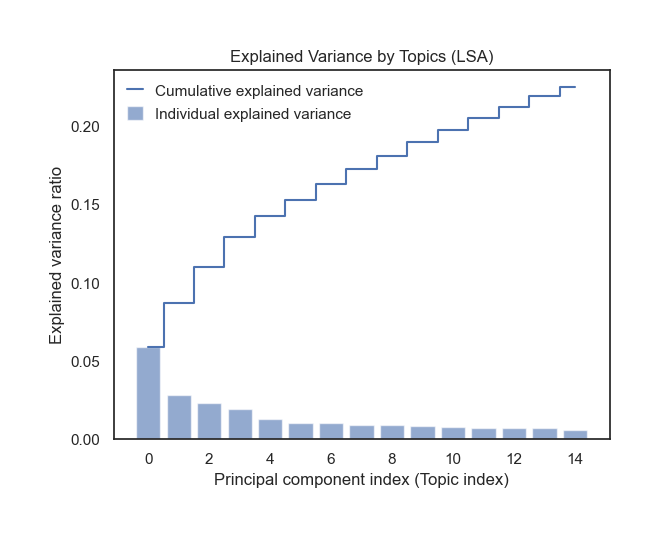

In [197]:
# get cumulative variance, to generate a pretty graph
explained_variance_ratio = lsa.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)


# Individual explained variance
plt.bar(range(len(explained_variance_ratio)), explained_variance_ratio, alpha=0.6, label="Individual explained variance")

# Cumulative explained variance
plt.step(range(len(cumulative_explained_variance)), cumulative_explained_variance, where='mid', label="Cumulative explained variance")

# Plot the graph
plt.xlabel("Principal component index (Topic index)")
plt.ylabel("Explained variance ratio")
plt.legend(loc="best")
plt.title("Explained Variance by Topics (LSA)")
plt.show()

After analysing the results for different number of topics, the final iteration was done using 15 topics.

<font size=5>6.2.1 Specific Data Preparation</font> <a class="anchor" id="P621"></a>

<i>Now, we will perform LSA using Gensim. The model name, however, is LSI (Latent Semantic Indexing)

To implement LSI it is needed a dictionary of the different reviews (reviews_dict), as well as a list containing the BoW representations of the tokens from the dictionary created of the reviews (reviews_corpus).

Should we clean_review_token or clean_review_lemmatized? We will use the lemmatized one for it reduces the dimenaionality (less words), focus more on the meaning of the words, as well as gives an improved topic coherence.</i>

In [198]:
# we have that column in string, but we need it in tokens in a list.
reviews_topic["clean_review_lemmatized_tokens"] = reviews_topic["clean_review_lemmatized"].apply(lambda x: x.split())

reviews_dict = corpora.Dictionary(reviews_topic["clean_review_lemmatized_tokens"])
reviews_corpus = [reviews_dict.doc2bow(doc) for doc in reviews_topic["clean_review_lemmatized_tokens"]]

<font size=5>6.2.2 Model Implementation</font> <a class="anchor" id="P622"></a>

In [199]:
reviews_lsi = LsiModel(reviews_corpus, id2word=reviews_dict, num_topics=15)

print(reviews_lsi.get_topics().shape, end="\n")

reviews_lsi.show_topics()

(15, 12717)


[(0,
  '0.406*"good" + 0.367*"place" + 0.350*"food" + 0.251*"chicken" + 0.194*"taste" + 0.173*"order" + 0.161*"service" + 0.137*"one" + 0.117*"try" + 0.114*"go"'),
 (1,
  '-0.595*"chicken" + 0.386*"food" + 0.294*"place" + -0.220*"taste" + 0.193*"service" + -0.186*"biryani" + 0.180*"good" + -0.118*"dish" + 0.109*"ambience" + -0.103*"order"'),
 (2,
  '0.823*"good" + -0.339*"place" + -0.158*"order" + -0.116*"food" + -0.104*"one" + -0.093*"get" + -0.087*"time" + -0.084*"go" + 0.078*"taste" + -0.073*"visit"'),
 (3,
  '-0.649*"place" + 0.582*"food" + 0.260*"order" + 0.157*"restaurant" + 0.149*"service" + -0.125*"good" + 0.097*"bad" + -0.081*"n" + -0.073*"visit" + -0.065*"best"'),
 (4,
  '0.525*"order" + -0.410*"chicken" + -0.404*"food" + 0.185*"good" + 0.156*"taste" + 0.148*"get" + 0.146*"one" + 0.132*"time" + 0.111*"bad" + -0.108*"great"'),
 (5,
  '-0.566*"order" + -0.317*"chicken" + -0.302*"place" + 0.196*"one" + 0.187*"serve" + -0.178*"biryani" + 0.161*"starter" + 0.125*"buffet" + 0.123*"

<font size=5>6.2.3 Model Evaluation</font> <a class="anchor" id="P623"></a>


<i>The final LSI consists of 10 topics, and below one can observe some results and insights from the document-topic and topic-word matrices generated.

Use the LSI results to generate a document-topic matrix. Store the resulting the document topic vectors as a new column in the original dataset.</i>

In [200]:
# see top 5 words for topic 4 (most weight for review 983)
reviews_lsi.show_topic(4,topn=5)

[('order', 0.5248790040420871),
 ('chicken', -0.4102864629424525),
 ('food', -0.4043022147147574),
 ('good', 0.18470650504953187),
 ('taste', 0.1562210882494842)]

In [201]:
lsi_doc_topic_matrix = np.array([[components[1] for components in reviews_lsi.__getitem__(doc)] for doc in tqdm(reviews_corpus)])
lsi_doc_topic_matrix[:5]

100%|██████████| 9954/9954 [00:01<00:00, 6179.90it/s]


array([list([2.559468071325069, 1.2607374101056417, 1.9336089991340586, -0.5756581566773784, 0.12089142406777606, -0.18819089053296775, -0.027017869511024202, 0.08559704853154831, 0.35657284207936324, 0.3933375893130179, 0.5172188773735533, -0.09258120154857558, 0.12165275175436081, 0.3178313288765938, 0.5742224782051697]),
       list([2.139210935420892, 1.4645125948842181, 2.318374580513635, 0.5814687568943014, 0.047967002158213645, 0.06767187797352416, 0.7054631670206303, 0.5599435778368064, -0.6328184665150893, -0.5896591330662538, 0.18392608084745438, 0.21492940096469176, 0.5125637075080022, -0.3001447638684773, 0.14431002675221016]),
       list([1.1618336135369032, 0.728119136091839, -0.18930016938679145, 0.585010075547514, -0.9399461294300239, 0.2693762786149509, -0.17684930010027, 0.16202509154847056, 0.40749109590745203, -1.7137561965990706, -0.04823754950226056, 0.06588020386620004, -0.9654546172281236, -0.12675575890048846, 0.11524452579255967]),
       list([1.552190313432

In [202]:
reviews_topic["gensim_lsi_topics_vector"] = lsi_doc_topic_matrix
display(reviews_topic["gensim_lsi_topics_vector"].head())

# Open the gensim LSI singular values vector
reviews_lsi.projection.s

0             [2.559468071325069, 1.2607374101056417, 1.9336089991340586, -0.5756581566773784, 0.12089142406777606, -0.18819089053296775, -0.027017869511024202, 0.08559704853154831, 0.35657284207936324, 0.3933375893130179, 0.5172188773735533, -0.09258120154857558, 0.12165275175436081, 0.3178313288765938, 0.5742224782051697]
1                 [2.139210935420892, 1.4645125948842181, 2.318374580513635, 0.5814687568943014, 0.047967002158213645, 0.06767187797352416, 0.7054631670206303, 0.5599435778368064, -0.6328184665150893, -0.5896591330662538, 0.18392608084745438, 0.21492940096469176, 0.5125637075080022, -0.3001447638684773, 0.14431002675221016]
2              [1.1618336135369032, 0.728119136091839, -0.18930016938679145, 0.585010075547514, -0.9399461294300239, 0.2693762786149509, -0.17684930010027, 0.16202509154847056, 0.40749109590745203, -1.7137561965990706, -0.04823754950226056, 0.06588020386620004, -0.9654546172281236, -0.12675575890048846, 0.11524452579255967]
3    [1.55219031343293

array([231.52907926, 105.56320276,  94.68231148,  87.4840393 ,
        76.67786797,  71.39177957,  64.89892062,  60.43439441,
        60.05899994,  59.36027544,  57.09104559,  55.14026331,
        52.57297615,  51.70865274,  51.31825217])

In [203]:
for topic_idx, topic in enumerate(lsa.components_):
    print(f"Topic {topic_idx + 1}:")
    top_words = [bow_word_list[i] for i in topic.argsort()[:-10 - 1:-1]]
    print(" ".join(top_words))
    print("\n")

Topic 1:
good food place chicken service taste one ambience ordered really


Topic 2:
chicken biryani taste fried veg ordered fish rice spicy dish


Topic 3:
good taste also veg nice quantity biryani ok biriyani overall


Topic 4:
place good n best one visit friends chocolate hangout amazing


Topic 5:
chicken place food biryani nice ambience wings great mandi tikka


Topic 6:
n prawns great food sauce best garlic u topped fish


Topic 7:
service great veg starters ambience buffet really nice non us


Topic 8:
service n biryani chicken order time ordered great worst restaurant


Topic 9:
great taste best try biryani one must amazing really ambience


Topic 10:
biryani n veg service starters non served prawns mutton hyderabadi


Topic 11:
one best try chicken must good food hyderabad us biryani


Topic 12:
really taste nice like also us served well dish hyderabadi


Topic 13:
great time us good experience served biryani staff get order


Topic 14:
taste service chicken place buffet hyde

We can see the top 10 words for eafch of the topics. From these, we can get an insight on what each topic reflects on!


Comparing using the sklearn LSA and gensim LSI, we got sligthly higher singular vector score when using the gensim LSI. Thus, suing gensim might give better results.

<font size=5>6.3.1 Data Preparation Specific </font> <a class="anchor" id="P63"></a>

<font size=5>6.3.2 Model Implementation </font> <a class="anchor" id="P63"></a>


In [204]:
lda = LatentDirichletAllocation(n_components=10,doc_topic_prior=None,topic_word_prior=None,max_iter=10,verbose=True)
lda_result = lda.fit_transform(bow_matrix)

#document-topic matrix
print(lda_result.shape, end="\n")

lda_result[983]

iteration: 1 of max_iter: 10
iteration: 2 of max_iter: 10
iteration: 3 of max_iter: 10
iteration: 4 of max_iter: 10
iteration: 5 of max_iter: 10
iteration: 6 of max_iter: 10
iteration: 7 of max_iter: 10
iteration: 8 of max_iter: 10
iteration: 9 of max_iter: 10
iteration: 10 of max_iter: 10
(9954, 10)


array([0.0028575 , 0.00285751, 0.24347166, 0.00285783, 0.00285748,
       0.49083449, 0.24569035, 0.00285765, 0.00285789, 0.00285764])

<font size=5>6.3.3 Model Evaluation </font> <a class="anchor" id="P63"></a>

In [205]:
topic_word_dict_lda = [{word : value for word, value in zip(bow_word_list,component)} for component in lda.components_]
lda_sklearn_df = pd.DataFrame(topic_word_dict_lda)
lda_sklearn_df.iloc[:, :5]

,a,aa,aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaasorryyy,aaamsutra,aachar
0,0.100080,0.100000,0.100012,0.100043,1.1
1,0.100000,0.100011,0.100000,0.100000,0.1
2,0.100021,0.100000,0.100000,0.100000,0.1
3,0.101768,1.937078,0.100000,0.100000,0.1
4,0.100000,0.100000,0.100076,0.100000,0.1
5,0.100000,0.262903,0.100000,1.099917,0.1
6,3.098123,0.100000,1.099894,0.100040,0.1
7,0.100008,0.100006,0.100017,0.100000,0.1
8,0.100000,0.100002,0.100000,0.100000,0.1
9,0.100000,0.100000,0.100000,0.100000,0.1


In [206]:
topic_tgt = lda_sklearn_df.loc[test_doc_topic]
topic_tgt = topic_tgt.sort_values(ascending=False)
topic_tgt.iloc[:10]

chicken    1663.717578
good        855.486552
ordered     604.598955
food        597.786810
rice        588.758413
taste       426.974326
veg         411.227489
fish        410.198246
fried       401.837047
paneer      380.110132
Name: 0, dtype: float64

<font size=5>6.4.1 Data Preparation Specific </font> <a class="anchor" id="P641"></a> 

<font size=5>6.4.2 Model Implementation </font> <a class="anchor" id="P642"></a> 

In [207]:
lda_gensim = LdaModel(reviews_corpus, id2word=reviews_dict, num_topics=10,iterations=50)
lda_gensim.show_topics()

[(0,
  '0.049*"chicken" + 0.043*"biryani" + 0.039*"order" + 0.018*"rice" + 0.015*"bad" + 0.012*"taste" + 0.011*"veg" + 0.010*"piece" + 0.009*"food" + 0.009*"get"'),
 (1,
  '0.041*"place" + 0.034*"food" + 0.030*"good" + 0.019*"service" + 0.014*"great" + 0.013*"go" + 0.012*"ambience" + 0.012*"visit" + 0.011*"really" + 0.011*"staff"'),
 (2,
  '0.070*"good" + 0.028*"chicken" + 0.023*"taste" + 0.017*"try" + 0.014*"place" + 0.014*"nice" + 0.013*"food" + 0.010*"coffee" + 0.009*"also" + 0.009*"order"'),
 (3,
  '0.020*"donut" + 0.015*"chocolate" + 0.014*"paratha" + 0.013*"try" + 0.012*"bakery" + 0.011*"shake" + 0.011*"hyderabadi" + 0.010*"cake" + 0.010*"taste" + 0.009*"also"'),
 (4,
  '0.051*"food" + 0.040*"good" + 0.022*"service" + 0.017*"place" + 0.013*"ambience" + 0.012*"taste" + 0.012*"burger" + 0.011*"momos" + 0.010*"time" + 0.009*"staff"'),
 (5,
  '0.021*"place" + 0.015*"good" + 0.014*"chicken" + 0.013*"pork" + 0.012*"food" + 0.011*"drink" + 0.011*"veg" + 0.009*"go" + 0.008*"order" + 0.00

<font size=5>6.4.3 Model Evaluation </font> <a class="anchor" id="P643"></a> 

In [208]:
lda_doc_topic_matrix = np.array([[components[1] for components in lda_gensim.__getitem__(doc,eps=0.000)] for doc in tqdm(reviews_corpus)])
test_doc_topic = np.where(lda_result[983] == lda_result[983].max())[0][0]
print("\n", test_doc_topic)
lda_gensim.show_topic(test_doc_topic,topn=5)

100%|██████████| 9954/9954 [00:03<00:00, 2811.77it/s]



 5


[('place', 0.020996634),
 ('good', 0.014842676),
 ('chicken', 0.01380091),
 ('pork', 0.012915252),
 ('food', 0.012482107)]

We will now see the perplexity of the LDA model.
Perplexity in LDA is a metric that measures how well the model predicts a sample of unseen data, with lower values indicating better performance because it signifies higher predictive accuracy and less uncertainty.

In [209]:
# Assess model with perplexity
print(f"Perplexity: {lda_gensim.log_perplexity(reviews_corpus)}\n")

# Assess the model by checking the coherence of the LDA model.
# The score varies between 0 and 1, and the closest to 1, 
# the better.

cm = CoherenceModel(model=lda_gensim, texts=reviews_topic["clean_review_lemmatized_tokens"], coherence='c_v')
print(f"Coherence total: {cm.get_coherence()}\nCoherence per topic:")
cm.get_coherence_per_topic()

Perplexity: -7.716234420725464

Coherence total: 0.3761974410170364
Coherence per topic:


[0.478447817558353,
 0.39963367005318307,
 0.37182928372004975,
 0.2727079901655627,
 0.35662365823089726,
 0.36475646367391873,
 0.42743169971937867,
 0.39378107575179244,
 0.3750018672500385,
 0.3217608840471898]

In [210]:
for i, topic in lda_gensim.show_topics(num_topics=10, num_words=10, formatted=False):
    print(f"Topic {i}: {[word for word, prob in topic]}") 

Topic 0: ['chicken', 'biryani', 'order', 'rice', 'bad', 'taste', 'veg', 'piece', 'food', 'get']
Topic 1: ['place', 'food', 'good', 'service', 'great', 'go', 'ambience', 'visit', 'really', 'staff']
Topic 2: ['good', 'chicken', 'taste', 'try', 'place', 'nice', 'food', 'coffee', 'also', 'order']
Topic 3: ['donut', 'chocolate', 'paratha', 'try', 'bakery', 'shake', 'hyderabadi', 'cake', 'taste', 'also']
Topic 4: ['food', 'good', 'service', 'place', 'ambience', 'taste', 'burger', 'momos', 'time', 'staff']
Topic 5: ['place', 'good', 'chicken', 'pork', 'food', 'drink', 'veg', 'go', 'order', 'serve']
Topic 6: ['place', 'food', 'chicken', 'try', 'taste', 'dish', 'order', 'good', 'great', 'best']
Topic 7: ['order', 'food', 'restaurant', 'taste', 'good', 'service', 'bad', 'time', 'like', 'even']
Topic 8: ['place', 'good', 'great', 'try', 'time', 'food', 'go', 'chinese', 'ambience', 'also']
Topic 9: ['taste', 'quantity', 'breakfast', 'bread', 'less', 'good', 'wrap', 'shawarma', 'order', 'late']


We didn't really get great results from this, which might be due to the fact all the topics are concercing restaurants. 
But we can detect some of the topics subject! 

For instance:
- Topic 0 refers to a restaurant where food and beverages are sweets.
- Topic 6 is establishments focused on or famous for their fried chicken dishes.